In [6]:
import os
import sys
import glob
import uproot
import numpy as np
import matplotlib.pyplot as plt

from scipy import stats as st
import scipy

import peakutils

from datetime import datetime

import math
from scipy          import stats
from scipy.optimize import curve_fit

In [7]:
### Import functions from peak_functions

repository_path = os.path.abspath('../..')
sys.path.append(repository_path)

import blr_functions  as blr
import peak_functions as pf
import fit_functions  as fitf

In [8]:
import warnings
warnings.filterwarnings("ignore")

In [9]:
plt.rcParams["figure.figsize"] = 9, 6
plt.rcParams["font.size"]      = 14

In [10]:
filename = '/Users/romoluque_c/LEGEND/BACON/new_setup/datatest/run-09_02_2024-file_6.root'
infile   = uproot.open(filename)
RawTree  = infile['RawTree']

## Plot one event:

In [12]:
fav_col = '#418094'

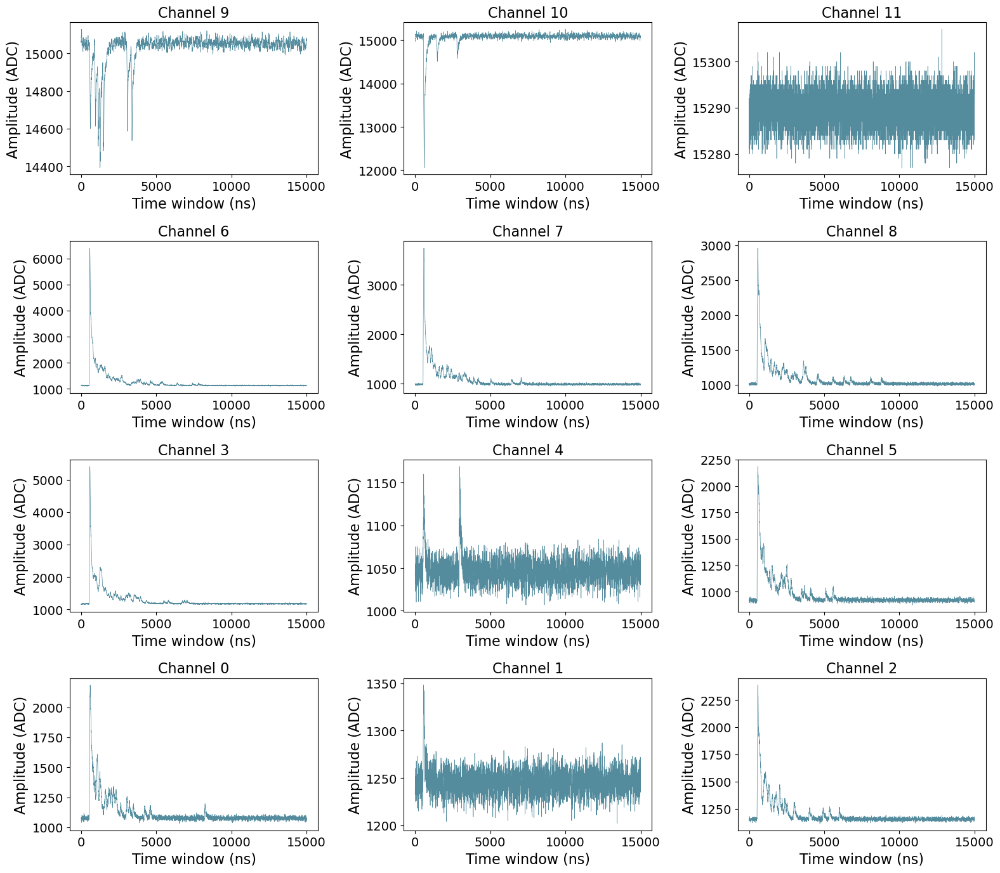

In [105]:
choose_evt = 2952
fig, axs   = plt.subplots(4, 3, figsize=(16, 14))
for row, ich in enumerate(reversed(np.arange(0, 12, 3))):
    for col in range(3):
        ch = ich + col
        wf = np.array(RawTree[f'chan{ch}/rdigi'].array())[choose_evt]
        axs[row][col].plot(2*np.arange(len(wf)), wf, linewidth=0.5, color=fav_col, alpha=0.9)
        axs[row][col].set_xlabel('Time window (ns)', fontsize=16)
        axs[row][col].set_ylabel('Amplitude (ADC)',  fontsize=16)
        axs[row][col].set_title(f"Channel {ch}",     fontsize=16)
plt.tight_layout()
plt.show()

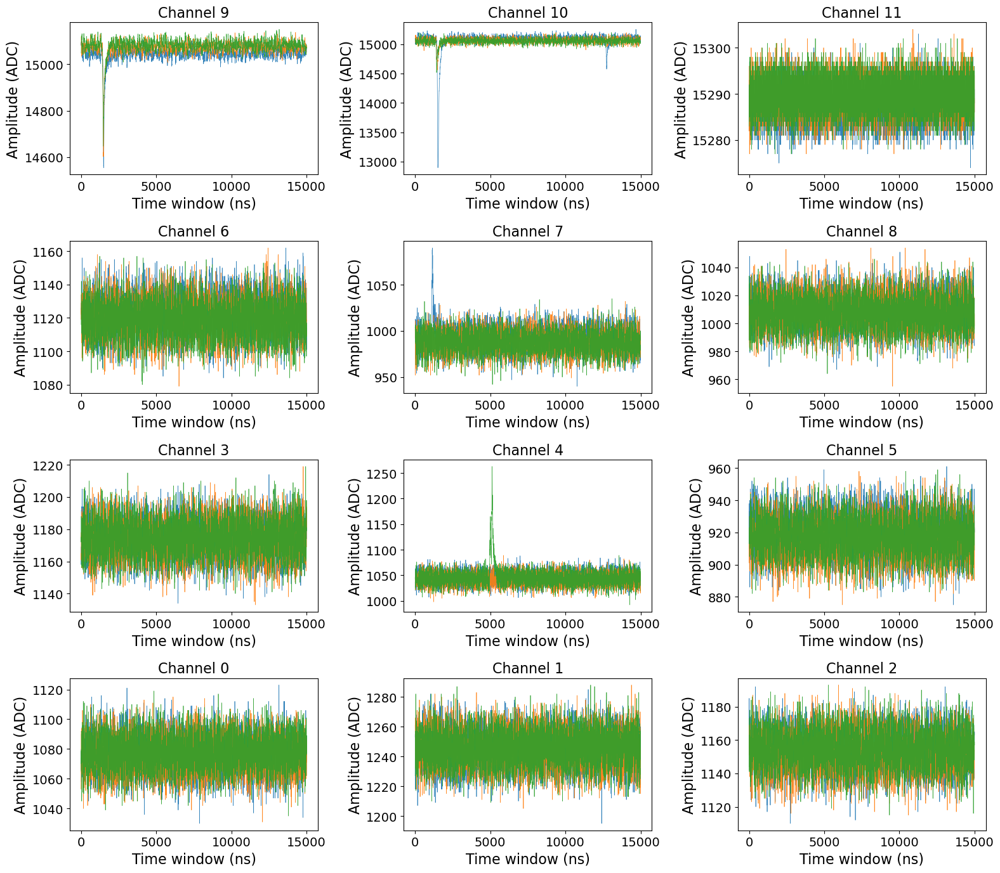

In [80]:
fig, axs = plt.subplots(4, 3, figsize=(16, 14))
for row, ich in enumerate(reversed(np.arange(0, 12, 3))):
    for col in range(3):
        ch = ich + col
        for evt in [1000, 9000, 21000]: #range(100):
            wf = np.array(RawTree[f'chan{ch}/rdigi'].array())[evt]
            axs[row][col].plot(2*np.arange(len(wf)), wf, linewidth=0.5, alpha=0.9)
        axs[row][col].set_xlabel('Time window (ns)', fontsize=16)
        axs[row][col].set_ylabel('Amplitude (ADC)',  fontsize=16)
        axs[row][col].set_title(f"Channel {ch}",     fontsize=16)
plt.tight_layout()
plt.show()

## Sum the waveforms

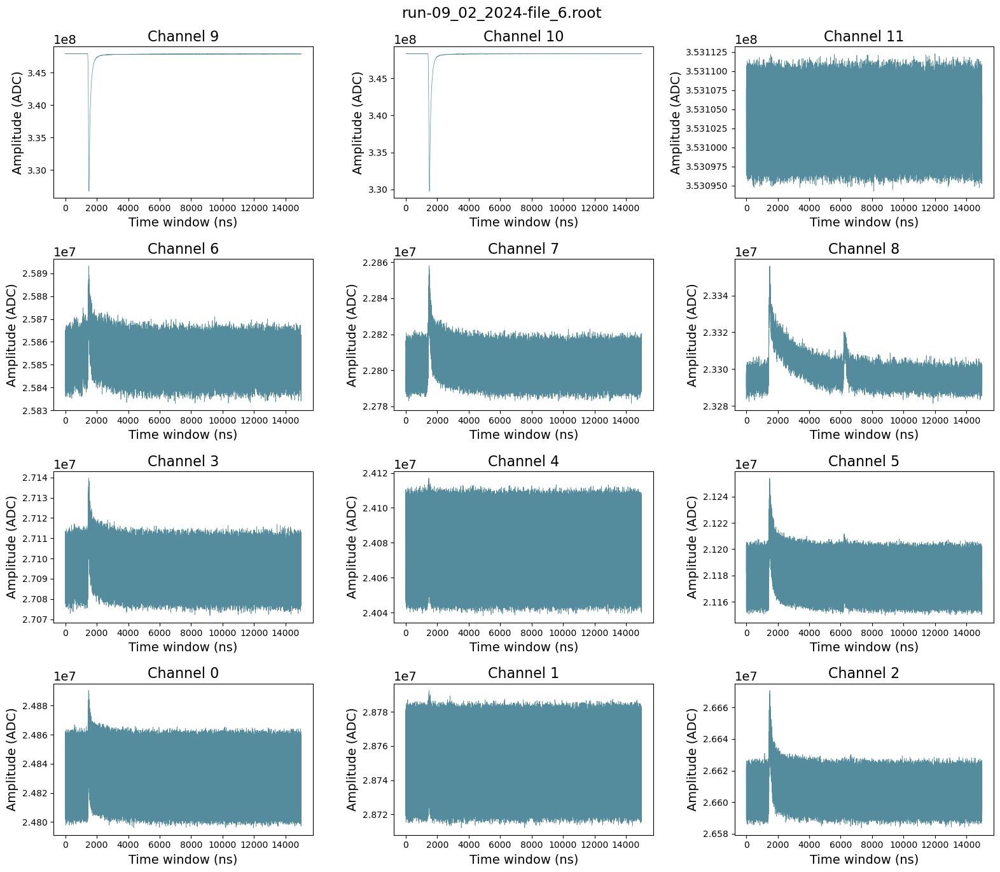

In [169]:
fig, axs   = plt.subplots(4, 3, figsize=(16, 14))
for row, ich in enumerate(reversed(np.arange(0, 12, 3))):
    for col in range(3):
        ch = ich + col
        all_wfs = np.array(RawTree[f'chan{ch}/rdigi'].array())
        sum_wfs = np.sum(all_wfs, axis=0)
        axs[row][col].plot(2*np.arange(len(wf)), sum_wfs, linewidth=0.5, color=fav_col, alpha=0.9)
        axs[row][col].set_xlabel('Time window (ns)', fontsize=14)
        axs[row][col].set_ylabel('Amplitude (ADC)',  fontsize=14)
        axs[row][col].set_title(f"Channel {ch}",     fontsize=16)
        axs[row][col].tick_params(axis='x', labelsize=10)
        axs[row][col].tick_params(axis='y', labelsize=10)
        
fname = filename.split("/")[-1]
fig.suptitle(fname)
plt.tight_layout()
plt.show()

### Let's subtract the baseline to see if it changes:

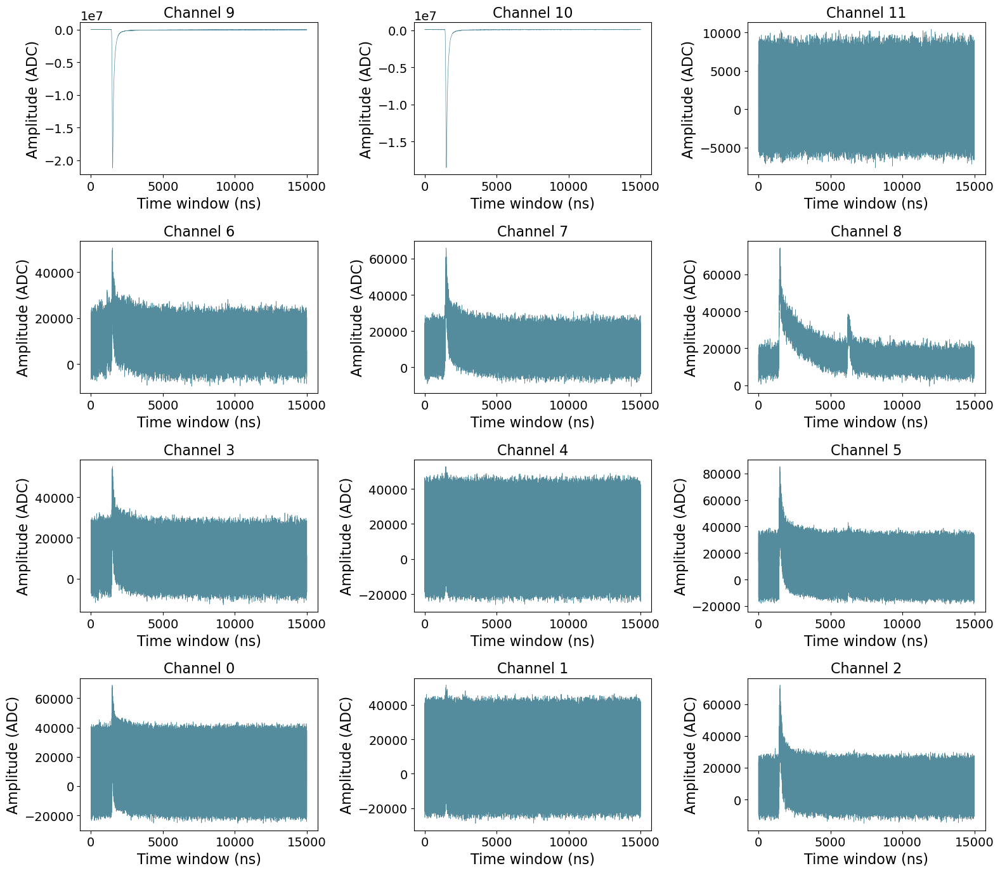

In [170]:
fig, axs   = plt.subplots(4, 3, figsize=(16, 14))
for row, ich in enumerate(reversed(np.arange(0, 12, 3))):
    for col in range(3):
        ch = ich + col
        all_wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
        subt_wfs = pf.subtract_baseline(all_wfs, mode=True, wf_range_bsl=(0, 500))
        sum_wfs  = np.sum(subt_wfs, axis=0)
        axs[row][col].plot(2*np.arange(len(wf)), sum_wfs, linewidth=0.5, color=fav_col, alpha=0.9)
        axs[row][col].set_xlabel('Time window (ns)', fontsize=16)
        axs[row][col].set_ylabel('Amplitude (ADC)',  fontsize=16)
        axs[row][col].set_title(f"Channel {ch}",     fontsize=16)
plt.tight_layout()
plt.show()

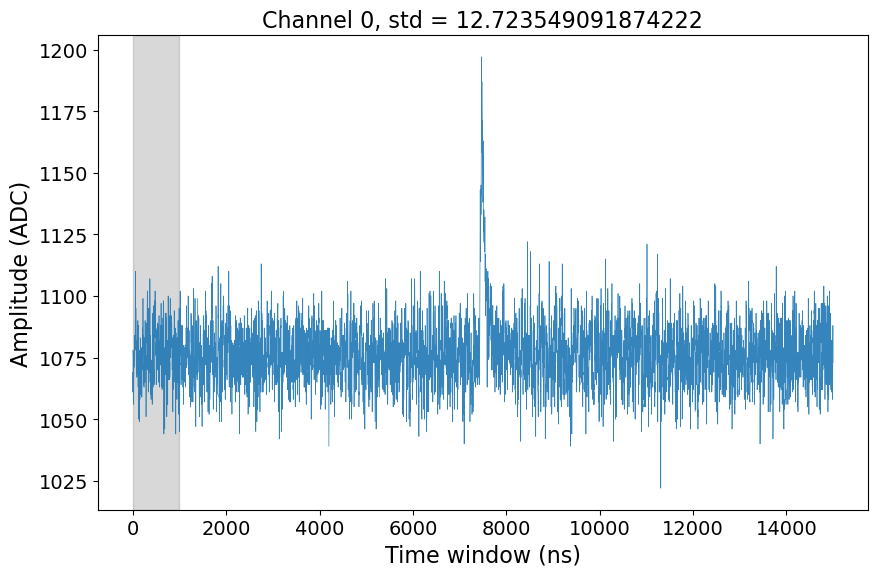

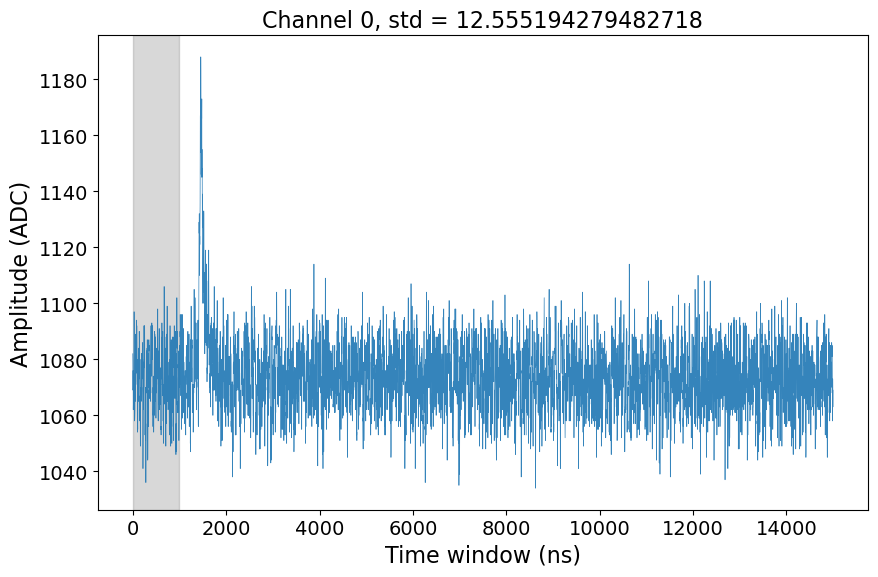

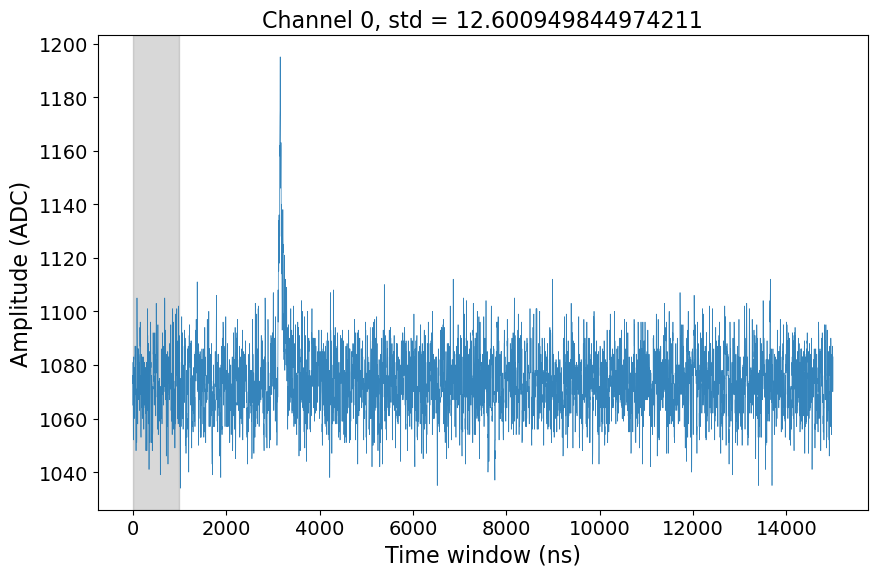

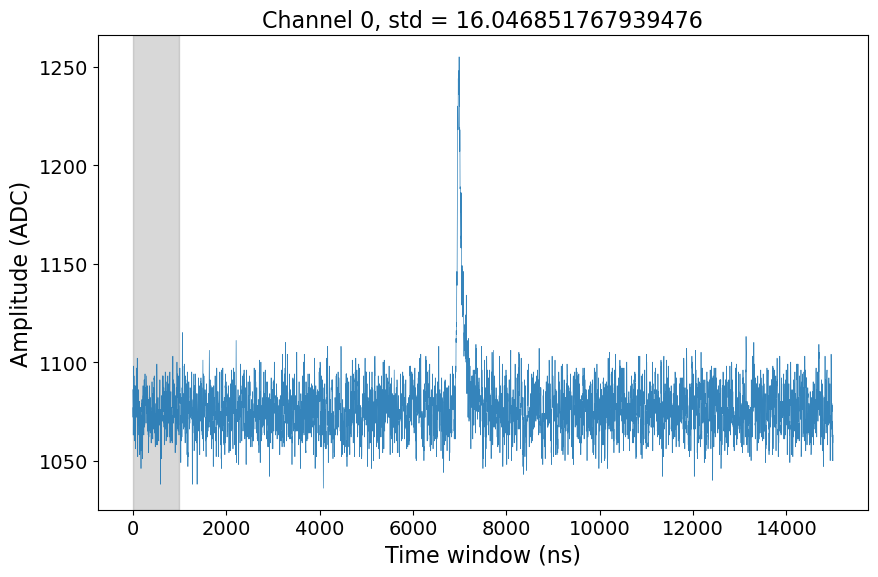

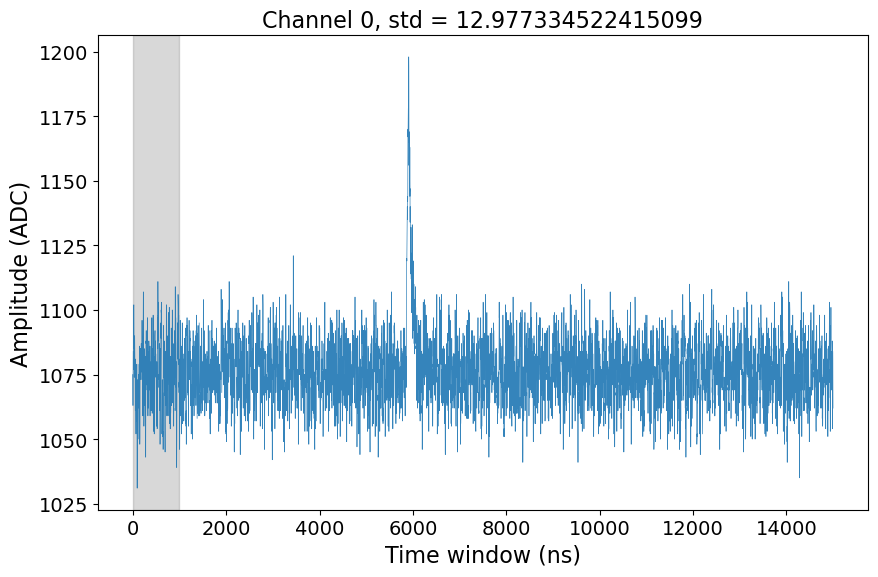

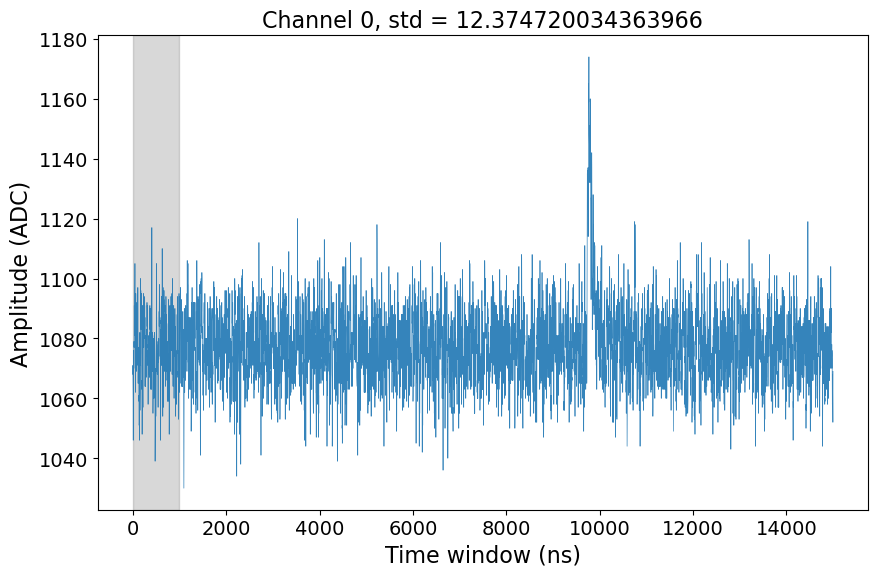

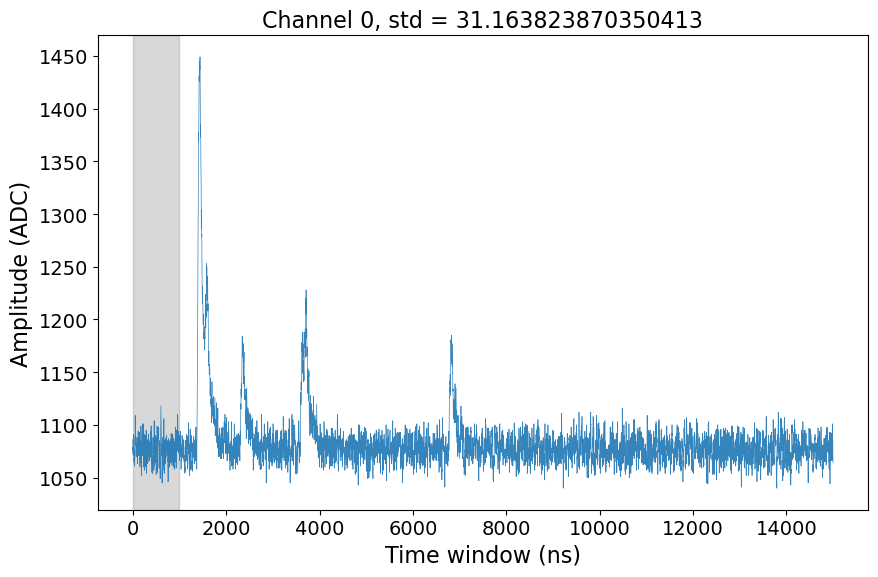

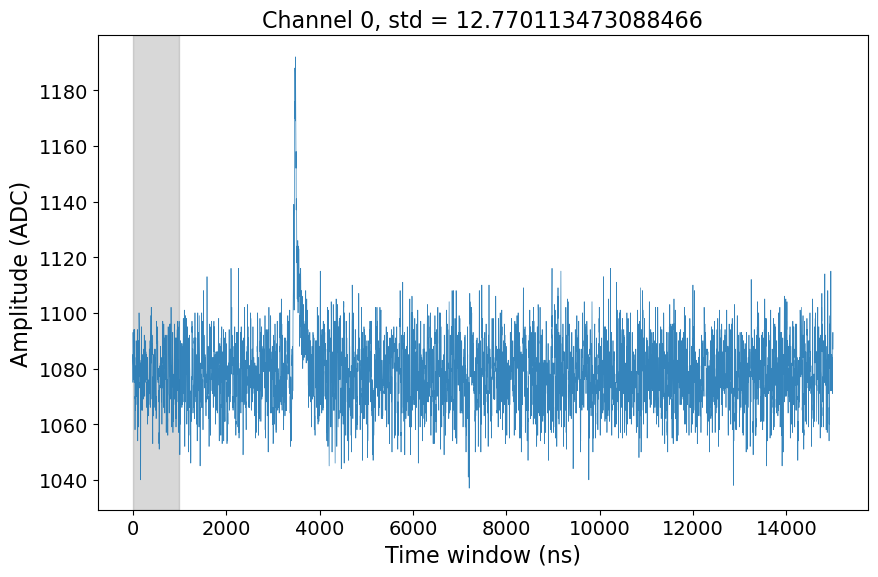

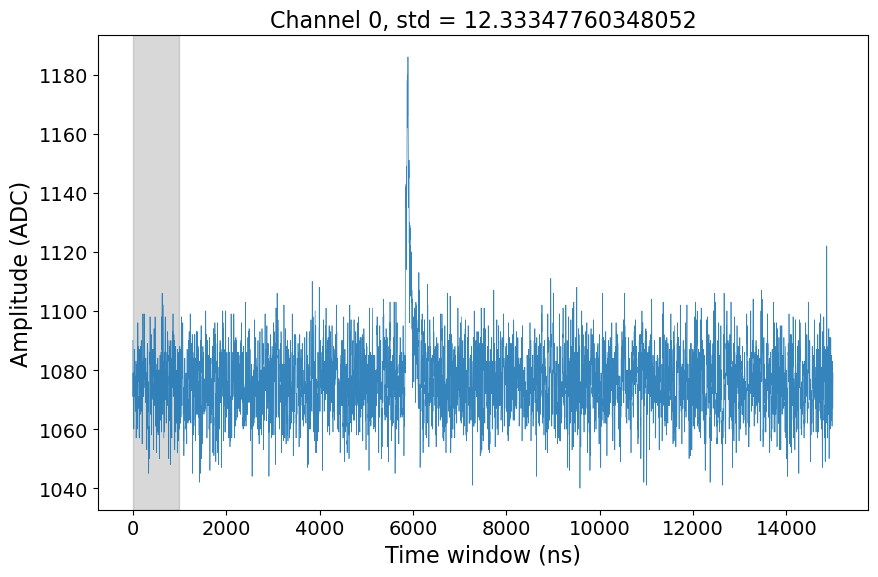

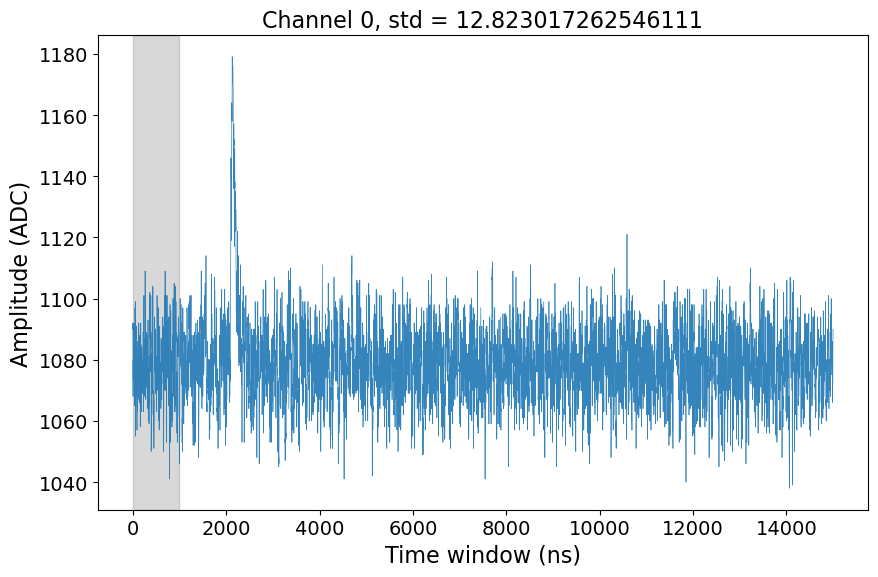

In [161]:
fig    = plt.figure(figsize=(9, 6))
sel_ch = 0
wfs = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[0:1000]
for wf in wfs:
    if np.std(wf)>12:
        plt.plot(2*np.arange(len(wf)), wf, linewidth=0.5, alpha=0.9)
        plt.axvspan(0, 2*500, color='grey', alpha=0.3)
        plt.xlabel('Time window (ns)', fontsize=16)
        plt.ylabel('Amplitude (ADC)',  fontsize=16)
        plt.title(f"Channel {sel_ch}, std = {np.std(wf)}",     fontsize=16)
        plt.show()

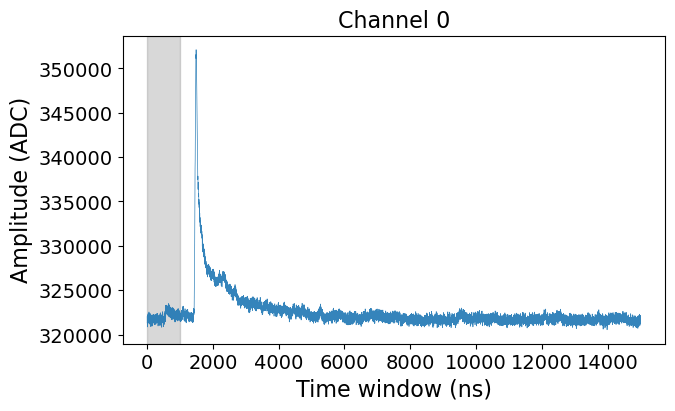

In [168]:
sel_ch     = 0
wfs        = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())
rms_values = np.std(wfs, axis=1)
filt_wfs   = wfs[rms_values > 12]
sum_fwfs   = np.sum(filt_wfs, axis=0) 

fig = plt.figure(figsize=(7, 4))
plt.plot(2*np.arange(len(sum_fwfs)), sum_fwfs, linewidth=0.5, alpha=0.9)
plt.axvspan(0, 2*500, color='grey', alpha=0.3)
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.title(f"Channel {sel_ch}",     fontsize=16)
plt.show()

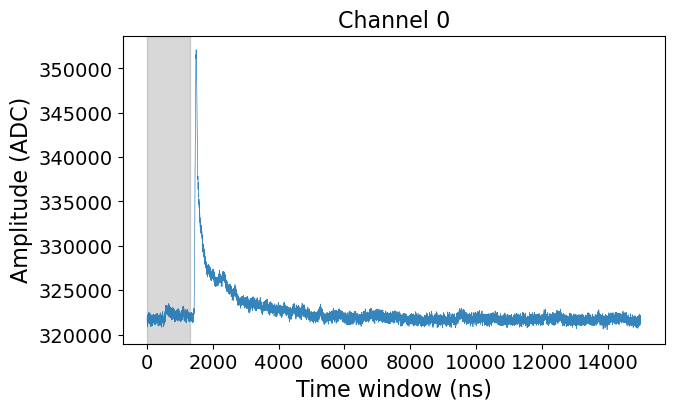

In [19]:
sel_ch     = 0
wfs        = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())
rms_values = np.std(wfs, axis=1)
filt_wfs   = wfs[rms_values > 12]
sum_fwfs   = np.sum(filt_wfs, axis=0) 

fig = plt.figure(figsize=(7, 4))
plt.plot(2*np.arange(len(sum_fwfs)), sum_fwfs, linewidth=0.5, alpha=0.9)
plt.axvspan(0, 2*650, color='grey', alpha=0.3)
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.title(f"Channel {sel_ch}",     fontsize=16)
plt.show()

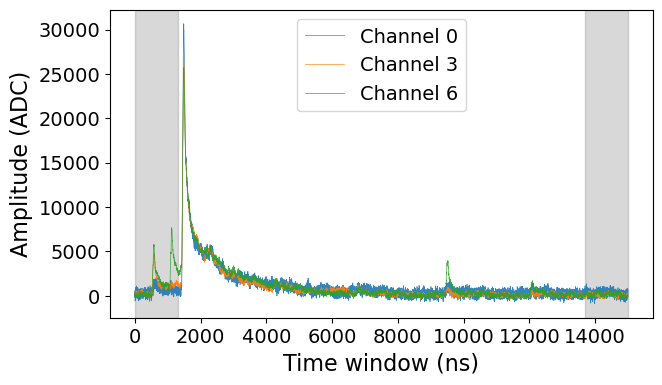

In [43]:
max_smpl_bsl = 650
full_time_w  = 7500

fig = plt.figure(figsize=(7, 4))
for ch in [0, 3, 6]:
    wfs        = np.array(RawTree[f'chan{ch}/rdigi'].array())
    rms_values = np.std(wfs, axis=1)
    filt_wfs   = wfs[rms_values > 12]
    subt_wfs   = [pf.subtract_baseline(wf, mode=True, wf_range_bsl=(0, max_smpl_bsl), mean_bsl=False) for wf in filt_wfs]
    sum_fwfs   = np.sum(subt_wfs, axis=0) 
    
    plt.plot(2*np.arange(len(sum_fwfs)), sum_fwfs, linewidth=0.5, alpha=0.9, label=f'Channel {ch}')
plt.axvspan(0, 2*max_smpl_bsl, color='grey', alpha=0.3)
plt.axvspan(2*(full_time_w - max_smpl_bsl), 2*full_time_w, color='grey', alpha=0.3)
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.legend()
plt.show()

## Compare baseline rms with Run2 data

In [130]:
filename0 = '/Users/romoluque_c/LEGEND/BACON/datatest/run-11_20_2023-file_1.root'
infile0   = uproot.open(filename0)
RawTree0  = infile0['RawTree']

filename1 = '/Users/romoluque_c/LEGEND/BACON/new_setup/datatest/run-09_02_2024-file_6.root'
infile1   = uproot.open(filename1)
RawTree1  = infile1['RawTree']

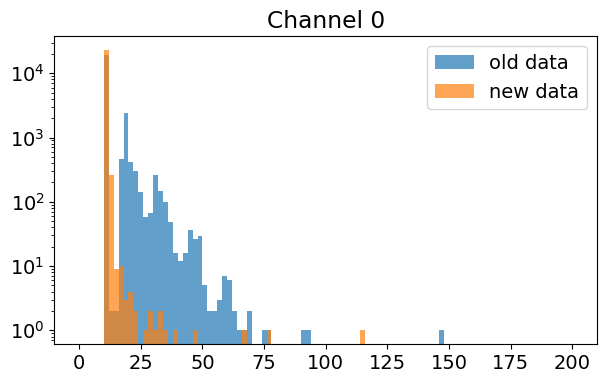

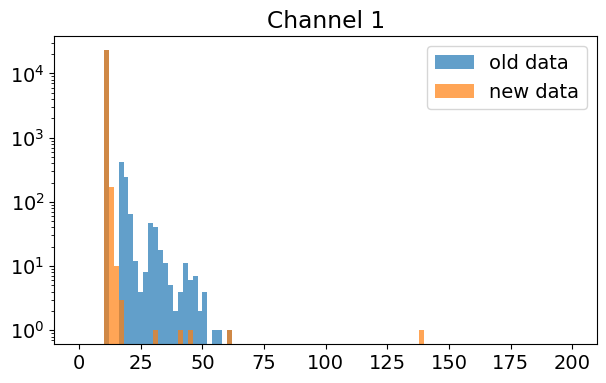

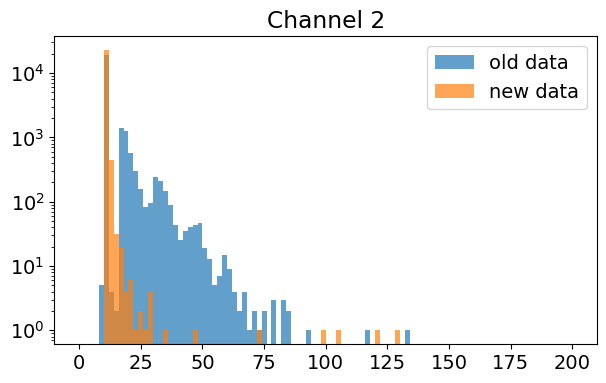

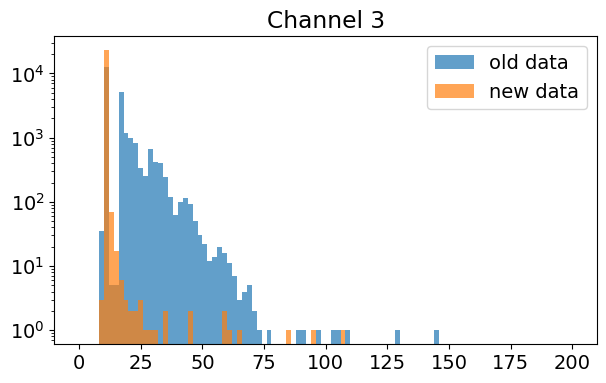

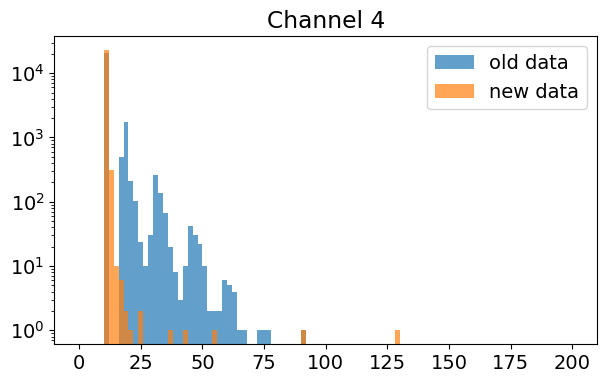

...

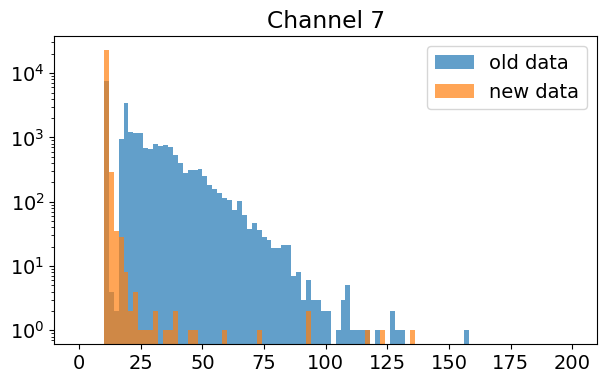

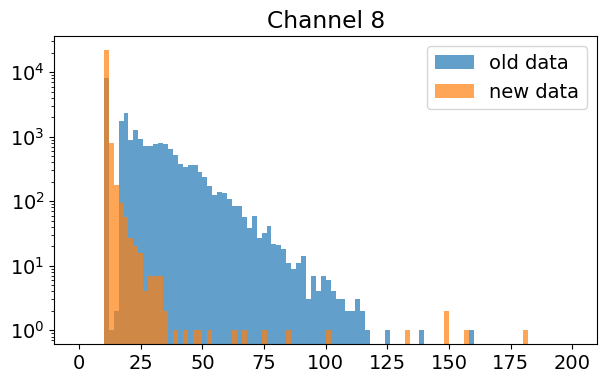

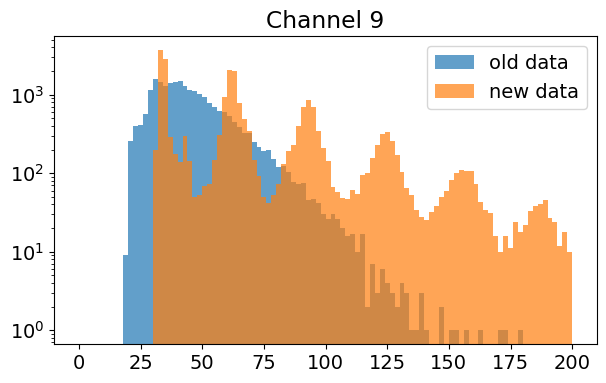

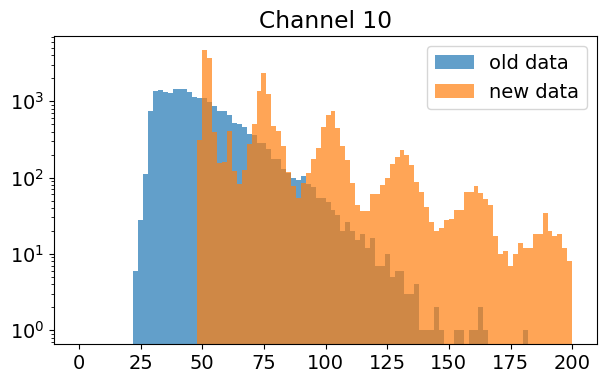

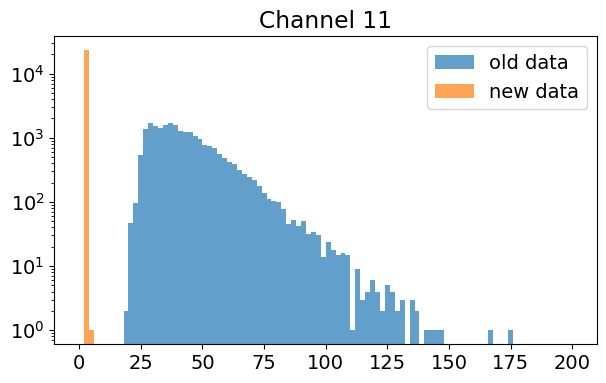

In [143]:
for ch in range(12):
    wfs0 = np.array(RawTree0[f'chan{ch}/rdigi'].array())
    wfs1 = np.array(RawTree1[f'chan{ch}/rdigi'].array())
    stds0 = [np.std(wf) for wf in wfs0]
    stds1 = [np.std(wf) for wf in wfs1]
    plt.figure(figsize=(7, 4))
    plt.hist(stds0, bins=100, range=(0, 200), label='old data', log=True, alpha=0.7)
    plt.hist(stds1, bins=100, range=(0, 200), label='new data', log=True, alpha=0.7)
    plt.title(f'Channel {ch}')
    plt.legend()
    plt.show()

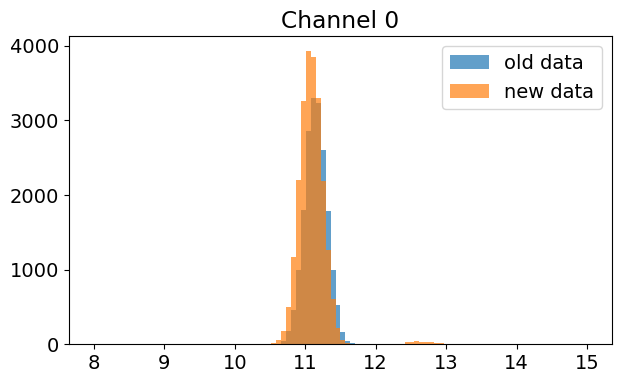

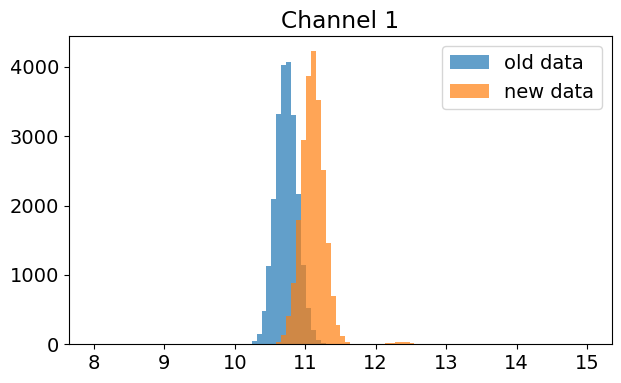

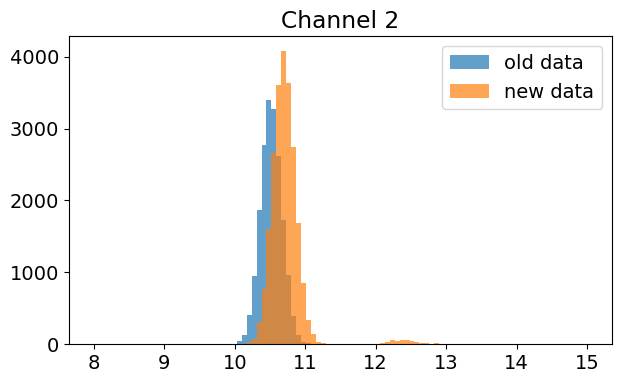

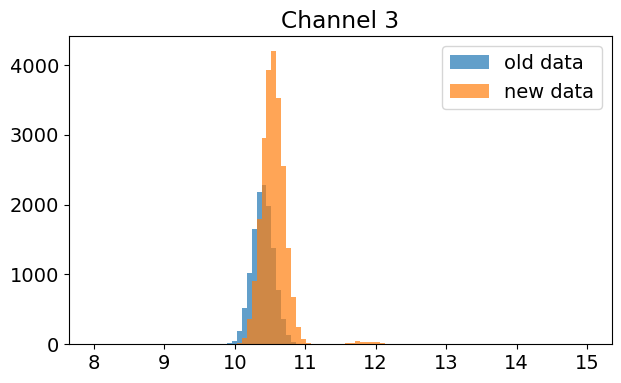

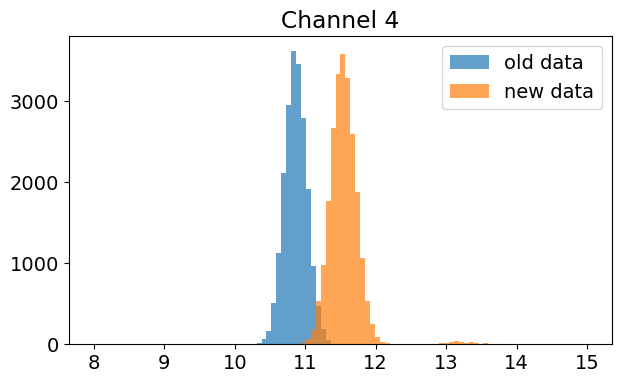

...

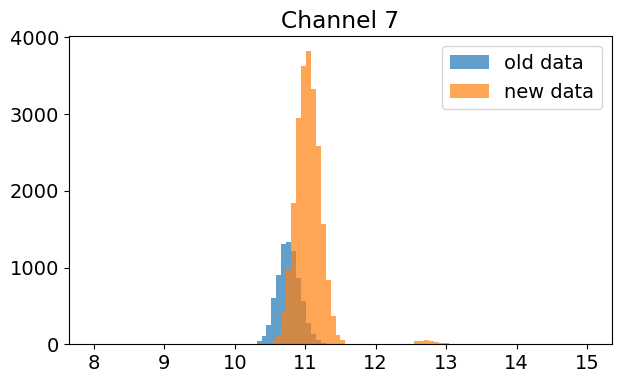

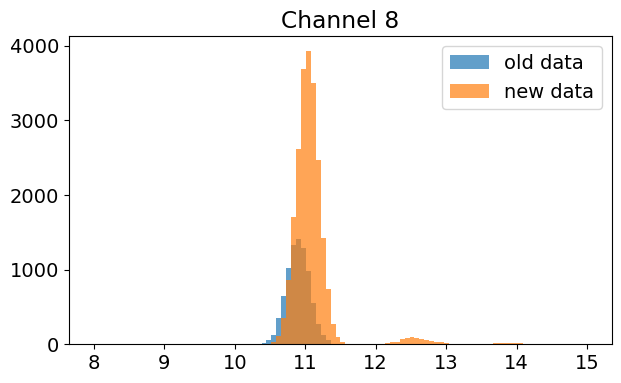

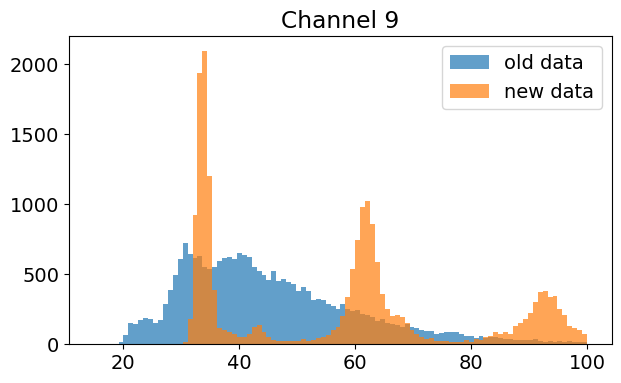

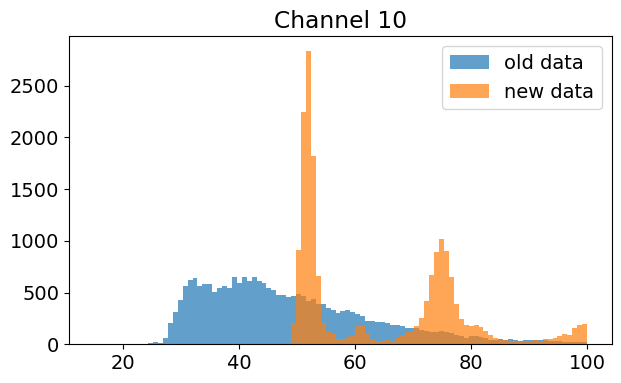

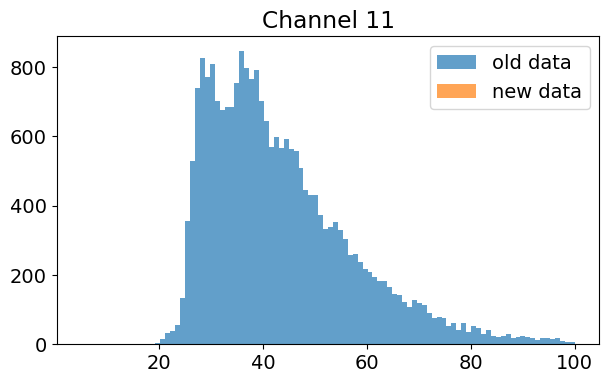

In [165]:
for ch in range(12):
    wfs0 = np.array(RawTree0[f'chan{ch}/rdigi'].array())
    wfs1 = np.array(RawTree1[f'chan{ch}/rdigi'].array())
    stds0 = [np.std(wf) for wf in wfs0]
    stds1 = [np.std(wf) for wf in wfs1]
    if ch in [9, 10]:
        range_hist = (15, 100)
    elif ch == 11:
        range_hist = (5, 100)
    else:
        range_hist = (8, 15)
    plt.figure(figsize=(7, 4))
    plt.hist(stds0, bins=100, range=range_hist, label='old data', alpha=0.7)
    plt.hist(stds1, bins=100, range=range_hist, label='new data', alpha=0.7)
    plt.title(f'Channel {ch}')
    plt.legend()
    plt.show()

## Compute the max std to remove baseline events:

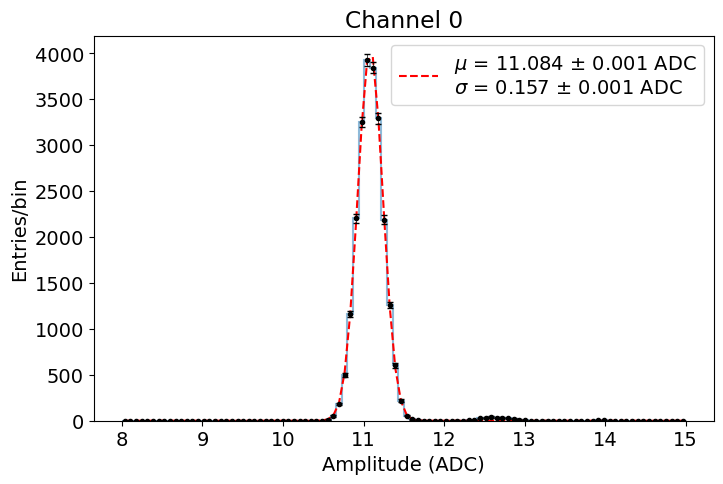

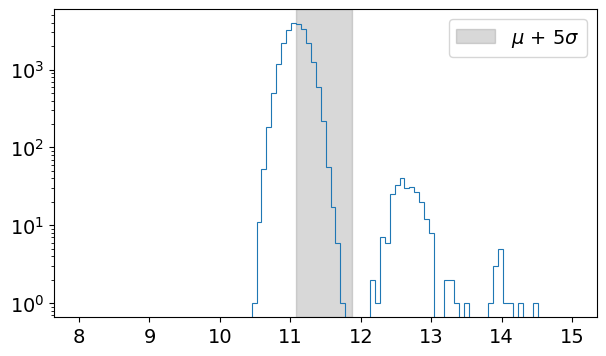

In [190]:
sel_ch     = 0
wfs1       = np.array(RawTree1[f'chan{sel_ch}/rdigi'].array())
stds1      = np.array([np.std(wf) for wf in wfs1])
range_hist = (8, 15)

fitf.gaussian_fit_IC(stds1, bins=100, prange=range_hist, ampl=4000,
                     mean=11, sigma=0.1, frange=(10.5, 11.5), title=f'Channel {sel_ch}', units='ADC',
                     xlabel='Amplitude (ADC)', print_chi2=False, ndec=3)

plt.figure(figsize=(7, 4))
plt.hist(stds1, bins=100, range=range_hist, histtype='step', lw=0.8, log=True)
plt.axvspan(11.084, 11.084+5*0.157, color='grey', alpha=0.3, label=r'$\mu$ + 5$\sigma$')
plt.legend();

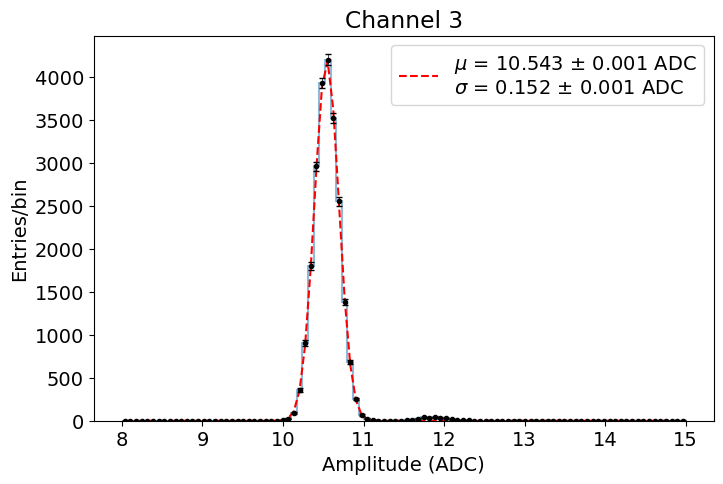

(10.542722605154488,
 0.0010068571294867257,
 0.15151837346245642,
 0.000718256996426478,
 0.35682576950408484,
 0.0016914952265843558,
 1.3628991478297103)

In [197]:
sel_ch     = 3
wfs1       = np.array(RawTree1[f'chan{sel_ch}/rdigi'].array())
stds1      = np.array([np.std(wf) for wf in wfs1])
range_hist = (8, 15)

fitf.gaussian_fit_IC(stds1, bins=100, prange=range_hist, ampl=4000,
                     mean=10.7, sigma=0.1, frange=(10, 11.2), title=f'Channel {sel_ch}', units='ADC',
                     xlabel='Amplitude (ADC)', print_chi2=False, ndec=3)

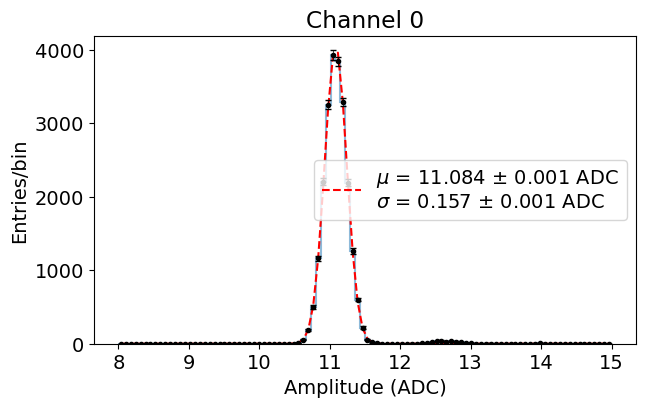

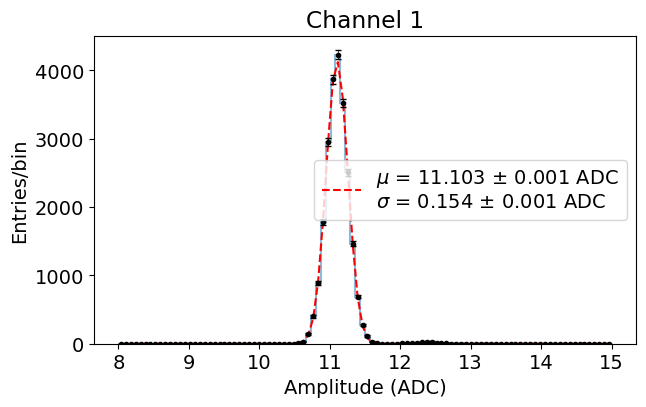

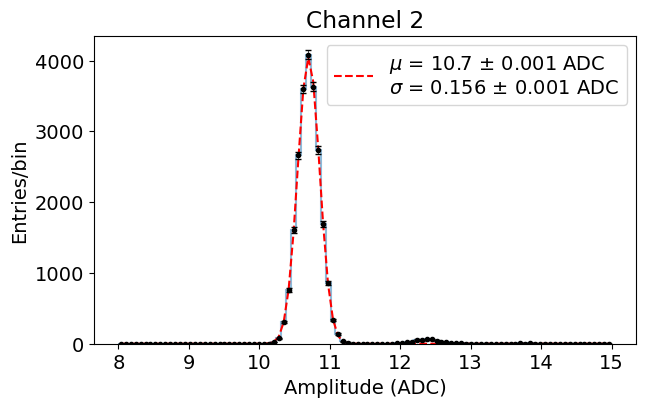

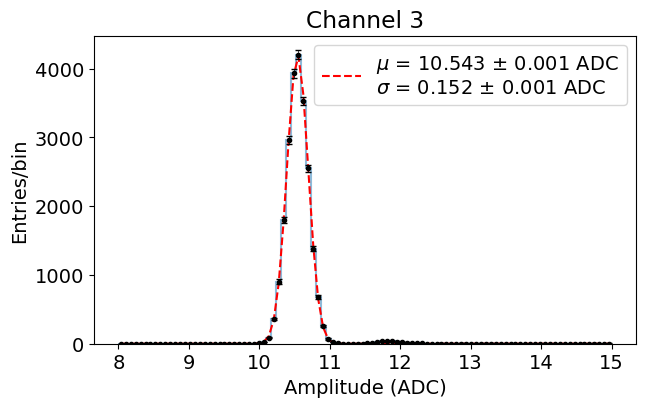

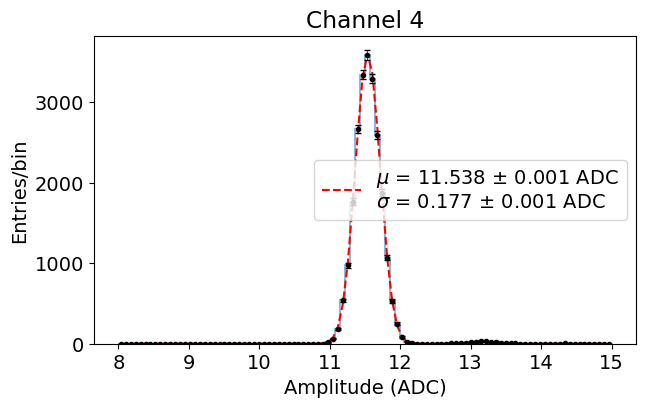

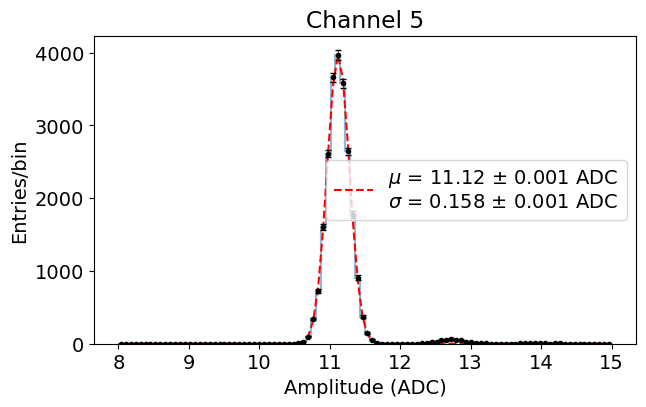

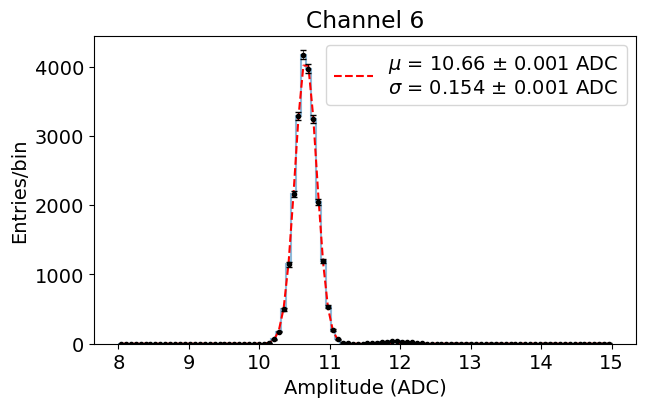

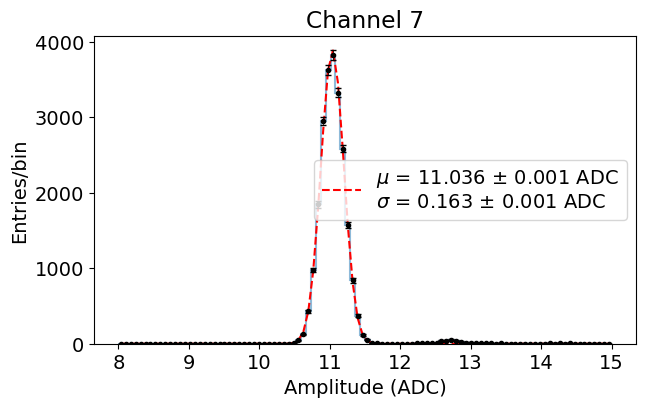

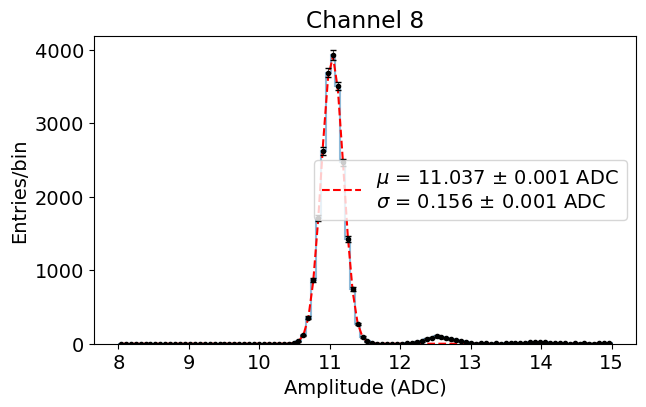

In [202]:
means_dict = {}
sigms_dict = {}
for ch in range(9):
    wfs1       = np.array(RawTree1[f'chan{ch}/rdigi'].array())
    stds1      = np.array([np.std(wf) for wf in wfs1])
    range_hist = (8, 15)
    
    mean_val = 11
    frange   = (10.5, 11.5)
    sigma    = 0.16
    if ch in [2, 3, 6]:
        mean_val = 10.7
        frange   = (10, 11.2)
    elif ch == 4:
        mean_val = 11.5
        frange   = (11, 12)
    f_vals = fitf.gaussian_fit_IC(stds1, bins=100, prange=range_hist, ampl=4000,
                                  mean=mean_val, sigma=sigma, frange=frange, title=f'Channel {ch}', units='ADC',
                                  xlabel='Amplitude (ADC)', print_chi2=False, figsize=(7, 4), ndec=3);
    means_dict[ch] = f_vals[0]
    sigms_dict[ch] = f_vals[2]

#### Histogram of all the wf

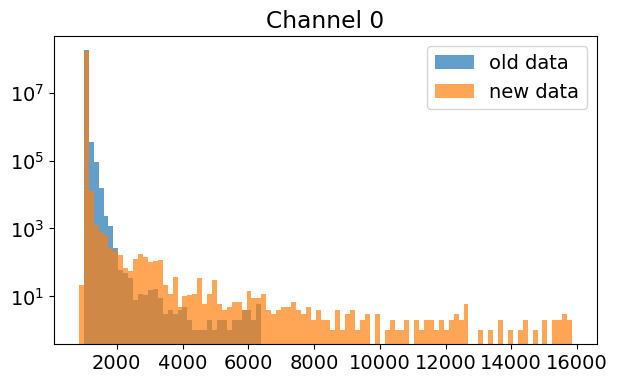

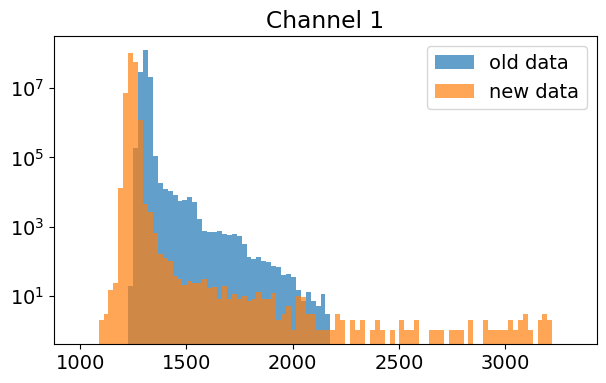

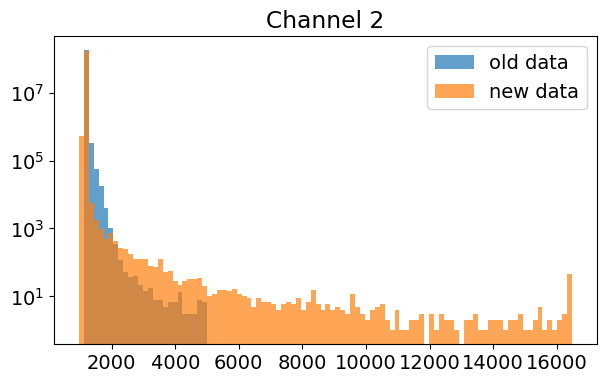

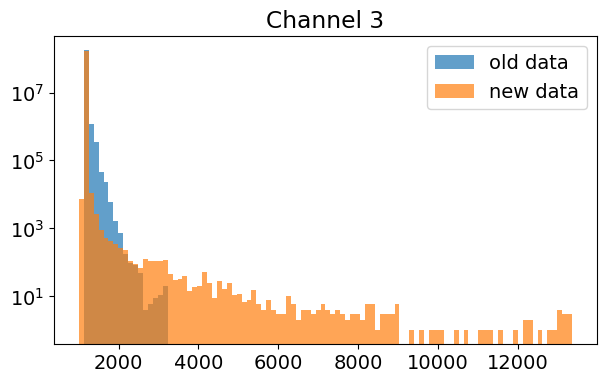

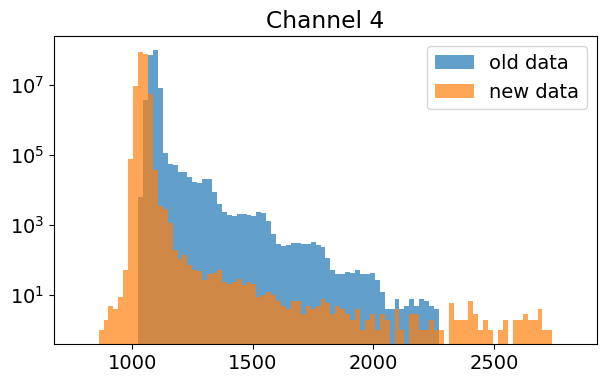

...

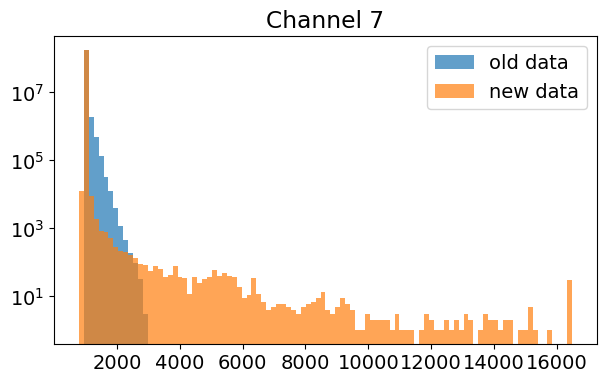

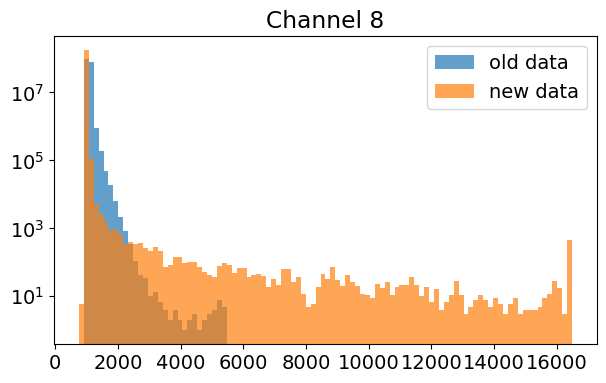

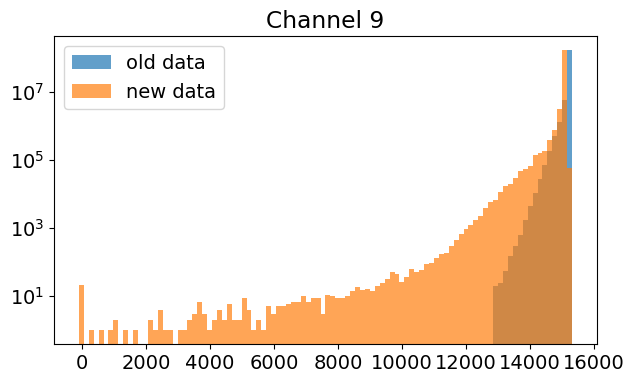

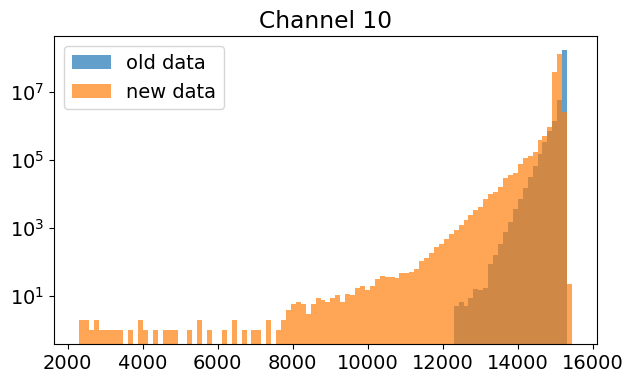

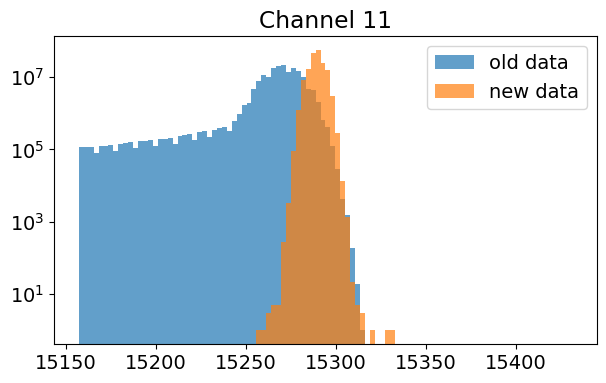

In [149]:
for ch in range(12):
    wfs0  = np.array(RawTree0[f'chan{ch}/rdigi'].array())
    wfs1  = np.array(RawTree1[f'chan{ch}/rdigi'].array())
    conc0 = np.concatenate(wfs0)
    conc1 = np.concatenate(wfs1)
    hist_range = min(conc1) - 100, max(conc1) + 100
    plt.figure(figsize=(7, 4))
    plt.hist(conc0, bins=100, range=hist_range, label='old data', log=True, alpha=0.7)
    plt.hist(conc1, bins=100, range=hist_range, label='new data', log=True, alpha=0.7)
    plt.title(f'Channel {ch}')
    plt.legend()
    plt.show()

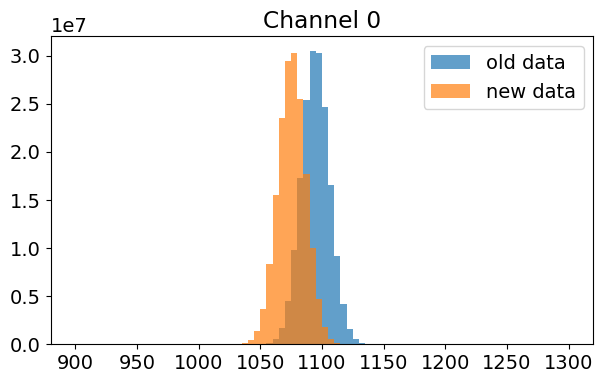

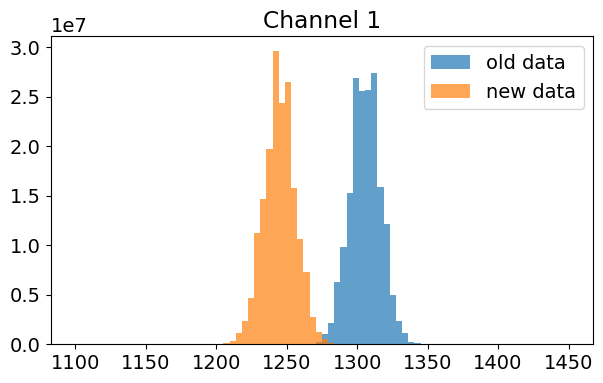

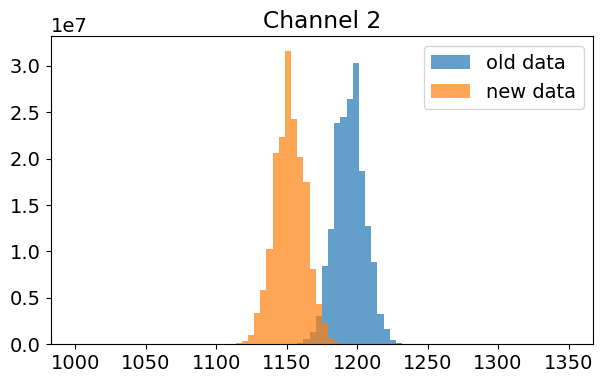

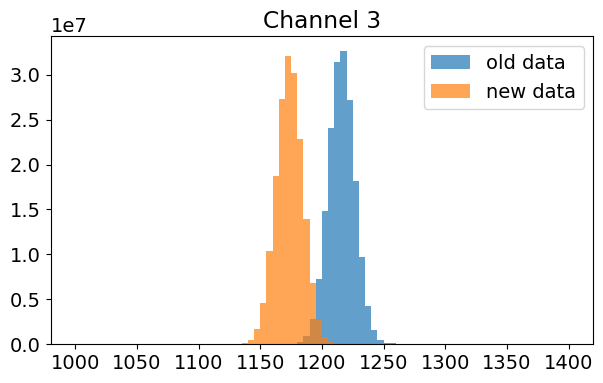

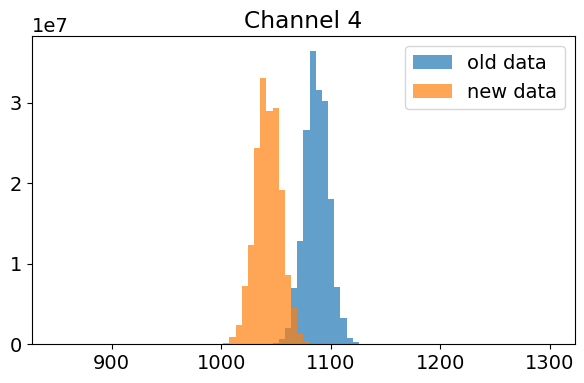

...

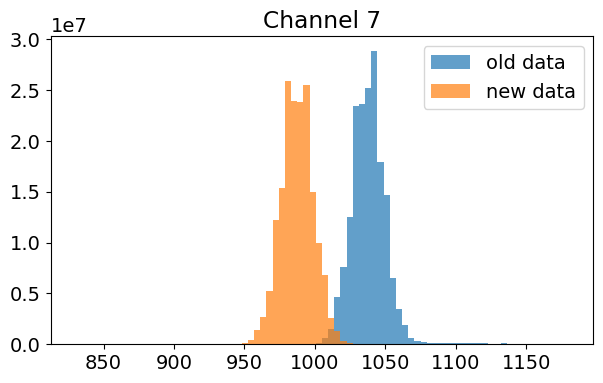

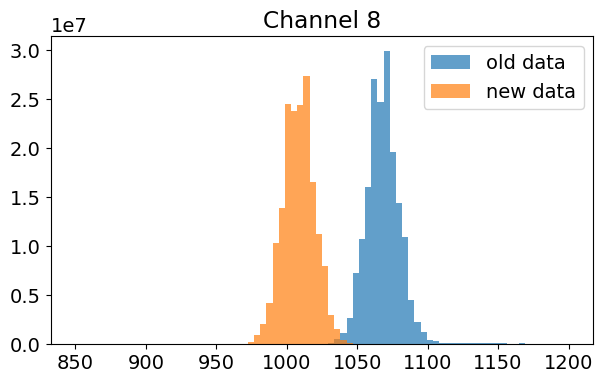

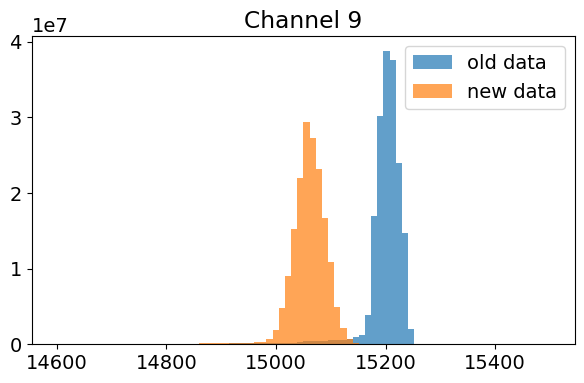

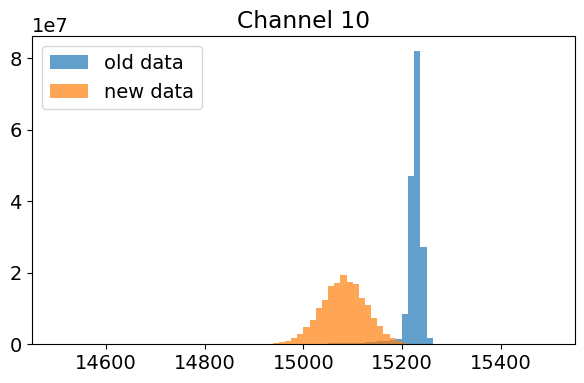

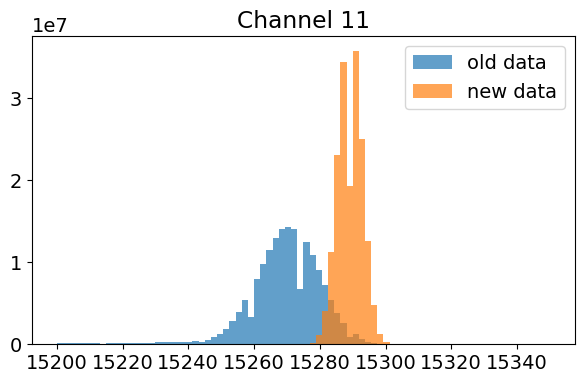

In [153]:
ranges_dict = {0:(900, 1300), 1:(1100, 1450), 2:(1000, 1350), 3:(1000, 1400), 4:(850, 1300), 5:(700, 1200),
               6:(950, 1350), 7:(830, 1180), 8:(850, 1200), 9:(14600, 15500), 10:(14500, 15500), 11:(15200, 15350)}
for ch in range(12):
    wfs0  = np.array(RawTree0[f'chan{ch}/rdigi'].array())
    wfs1  = np.array(RawTree1[f'chan{ch}/rdigi'].array())
    conc0 = np.concatenate(wfs0)
    conc1 = np.concatenate(wfs1)
    hist_range = min(conc1) - 100, max(conc1) + 100
    plt.figure(figsize=(7, 4))
    plt.hist(conc0, bins=80, range=ranges_dict[ch], label='old data', alpha=0.7)
    plt.hist(conc1, bins=80, range=ranges_dict[ch], label='new data', alpha=0.7)
    plt.title(f'Channel {ch}')
    plt.legend()
    plt.show()

#### Sum wf of an old data file

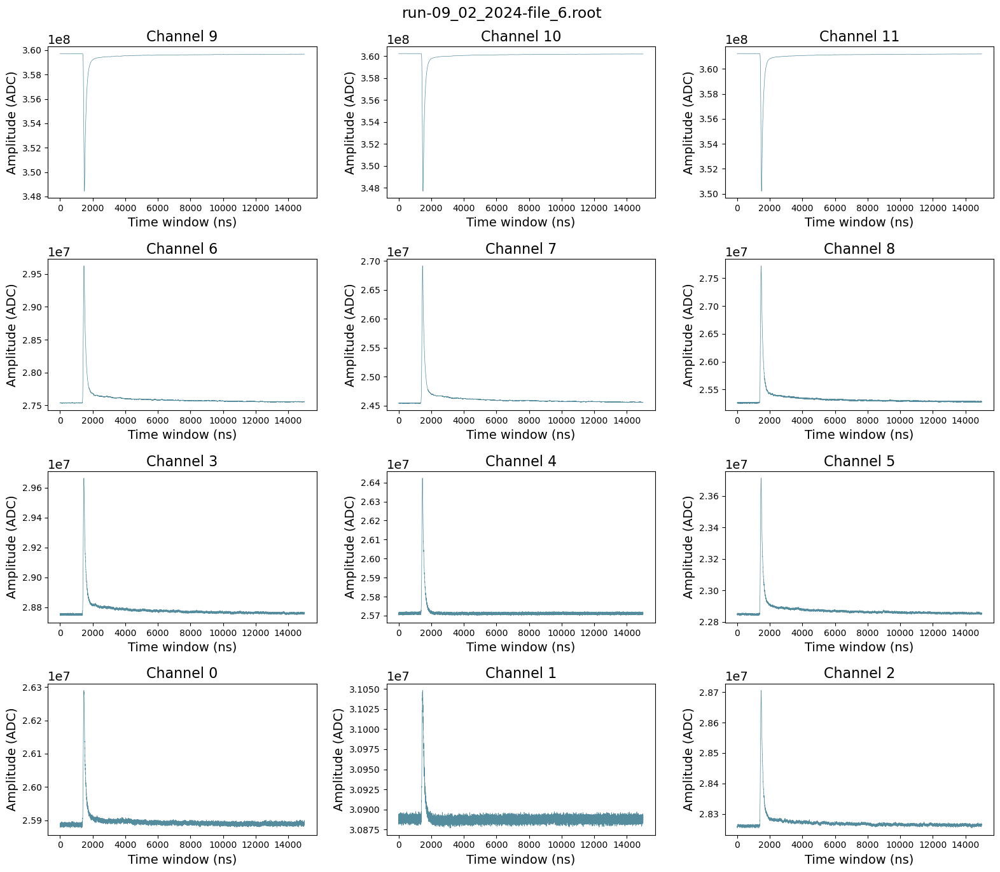

In [154]:
fig, axs   = plt.subplots(4, 3, figsize=(16, 14))
for row, ich in enumerate(reversed(np.arange(0, 12, 3))):
    for col in range(3):
        ch = ich + col
        all_wfs = np.array(RawTree0[f'chan{ch}/rdigi'].array())
        sum_wfs = np.sum(all_wfs, axis=0)
        axs[row][col].plot(2*np.arange(len(wf)), sum_wfs, linewidth=0.5, color=fav_col, alpha=0.9)
        axs[row][col].set_xlabel('Time window (ns)', fontsize=14)
        axs[row][col].set_ylabel('Amplitude (ADC)',  fontsize=14)
        axs[row][col].set_title(f"Channel {ch}",     fontsize=16)
        axs[row][col].tick_params(axis='x', labelsize=10)
        axs[row][col].tick_params(axis='y', labelsize=10)
        
fname = filename.split("/")[-1]
fig.suptitle(fname)
plt.tight_layout()
plt.show()

#### Try to compute and subtract baseline individually to each wf

In [126]:
def subtract_baseline(wfs, mode=True, wf_range_bsl=(0, None), mean_bsl=True):
    """
    Subtract the baseline to one or multiple waveforms in the input
    with a specific algorithm (mode or mean).
    """
    if len(wfs.shape)==1: ## Only one waveform
        baseline = pf.compute_baseline(wfs, mode=mode, wf_range_bsl=wf_range_bsl)
        return wfs - baseline
    elif len(wfs.shape)==2: ## Multiple wfs
        if mean_bsl:
            baseline = np.mean([pf.compute_baseline(wf, mode=mode, wf_range_bsl=wf_range_bsl) for wf in wfs])
            return wfs - baseline
        else:
            baselines = np.array([pf.compute_baseline(wf, mode=mode, wf_range_bsl=wf_range_bsl) for wf in wfs])
            return np.array([wf - bsl for wf, bsl in zip(wfs, baselines)])

9
10
11
6
7
8
3
4
5
0
1
2


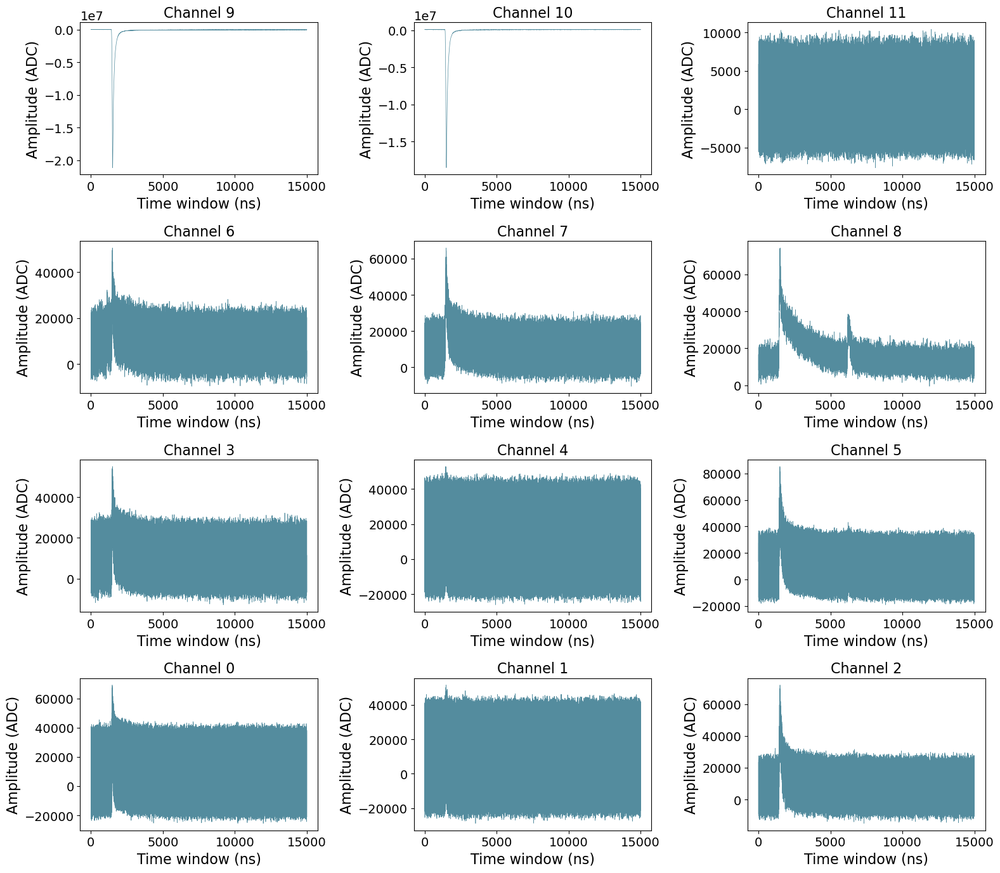

In [127]:
fig, axs   = plt.subplots(4, 3, figsize=(16, 14))
for row, ich in enumerate(reversed(np.arange(0, 12, 3))):
    for col in range(3):
        ch = ich + col
        print(ch)
        all_wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
        subt_wfs = subtract_baseline(all_wfs, mode=True, wf_range_bsl=(0, 500), mean_bsl=False)
        sum_wfs  = np.sum(subt_wfs, axis=0)
        axs[row][col].plot(2*np.arange(len(wf)), sum_wfs, linewidth=0.5, color=fav_col, alpha=0.9)
        axs[row][col].set_xlabel('Time window (ns)', fontsize=16)
        axs[row][col].set_ylabel('Amplitude (ADC)',  fontsize=16)
        axs[row][col].set_title(f"Channel {ch}",     fontsize=16)
plt.tight_layout()
plt.show()

## Try to remove baseline events to reduce the baseline in the wf sum

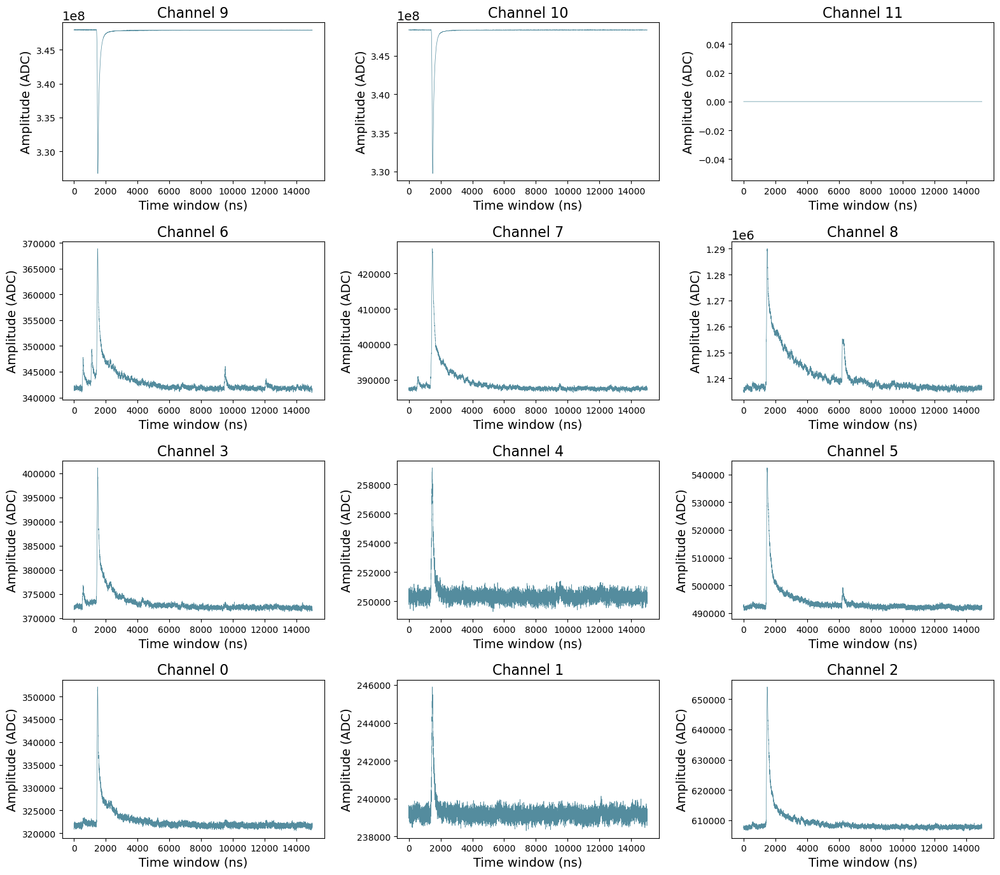

In [204]:
fig, axs   = plt.subplots(4, 3, figsize=(16, 14))
for row, ich in enumerate(reversed(np.arange(0, 12, 3))):
    for col in range(3):
        ch = ich + col
        if ch in [9, 10, 11]:
            rms_thr = 12
        else:
            rms_thr = means_dict[ch] + 5 *sigms_dict[ch]

        all_wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
        rms_vals = np.std(all_wfs, axis=1)
        filt_wfs = all_wfs[rms_vals > rms_thr]
        sum_fwfs = np.sum(filt_wfs, axis=0) 
        axs[row][col].plot(2*np.arange(len(sum_fwfs)), sum_fwfs, linewidth=0.5, color=fav_col, alpha=0.9)
        axs[row][col].set_xlabel('Time window (ns)', fontsize=14)
        axs[row][col].set_ylabel('Amplitude (ADC)',  fontsize=14)
        axs[row][col].set_title(f"Channel {ch}",     fontsize=16)
        axs[row][col].tick_params(axis='x', labelsize=10)
        axs[row][col].tick_params(axis='y', labelsize=10)
        
plt.tight_layout()
plt.show()

## Look at the PMT

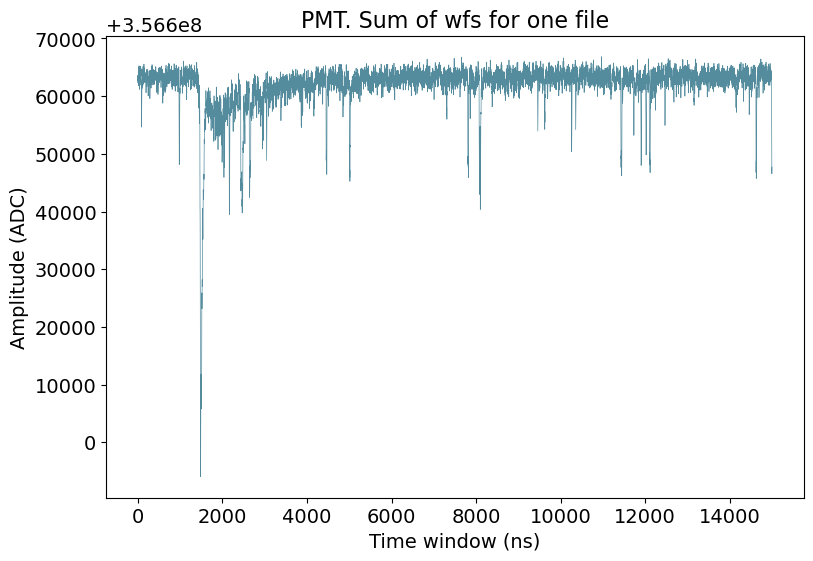

In [38]:
fig = plt.figure(figsize=(9, 6))
all_wfs = np.array(RawTree[f'chan12/rdigi'].array())
sum_wfs = np.sum(all_wfs, axis=0)
plt.plot(2*np.arange(len(wf)), sum_wfs, linewidth=0.5, color=fav_col, alpha=0.9)
plt.xlabel('Time window (ns)', fontsize=14)
plt.ylabel('Amplitude (ADC)',  fontsize=14)
plt.title(f"PMT. Sum of wfs for one file", fontsize=16)
plt.show()

## Study the baseline shifting vs time

In [96]:
filenames = ['run-09_01_2024-file_5.root', 'run-09_02_2024-file_6.root', 'run-09_04_2024-file_4.root']

all_bslns_mean = [[] for ch in range(12)]
all_bslns_mode = [[] for ch in range(12)]
for f in filenames:
    f_name = '/Users/romoluque_c/LEGEND/BACON/new_setup/datatest/' + f
    infile   = uproot.open(f_name)
    RawTree  = infile['RawTree']
    
    for ch in range(12):
        #if ch>0:
        #    continue
        print(ch)
        for wf in np.array(RawTree[f'chan{ch}/rdigi'].array()):
            bsl_mean = pf.compute_baseline(wf, wf_range_bsl=(0, 500), mode=False)
            bsl_mode = pf.compute_baseline(wf, wf_range_bsl=(0, 500), mode=True)
            all_bslns_mean[ch].append(bsl_mean)
            all_bslns_mode[ch].append(bsl_mode)

0
1
2
3
4
5
6
7
8
9
10
11
0
1
2
3
4
5
6
7
8
9
10
11
0
1
2
3
4
5
6
7
8
9
10
11


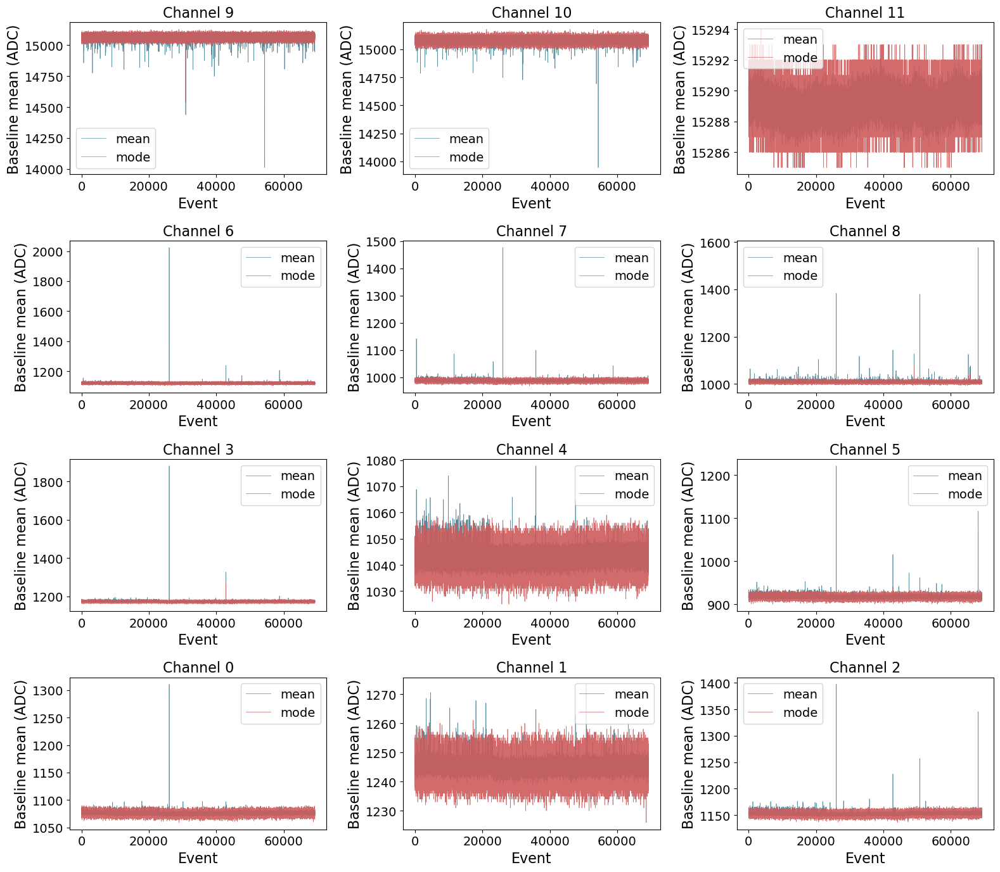

In [99]:
fig, axs   = plt.subplots(4, 3, figsize=(16, 14))
for row, ich in enumerate(reversed(np.arange(0, 12, 3))):
    for col in range(3):
        ch = ich + col
        axs[row][col].plot(range(len(all_bslns_mean[ch])), all_bslns_mean[ch], linewidth=0.5, color=fav_col,     alpha=0.9, label='mean')
        axs[row][col].plot(range(len(all_bslns_mode[ch])), all_bslns_mode[ch], linewidth=0.5, color='indianred', alpha=0.9, label='mode')
        axs[row][col].set_xlabel('Event', fontsize=16)
        axs[row][col].set_ylabel('Baseline mean (ADC)',  fontsize=16)
        axs[row][col].set_title(f"Channel {ch}",     fontsize=16)
        axs[row][col].legend()
plt.tight_layout()
plt.show()

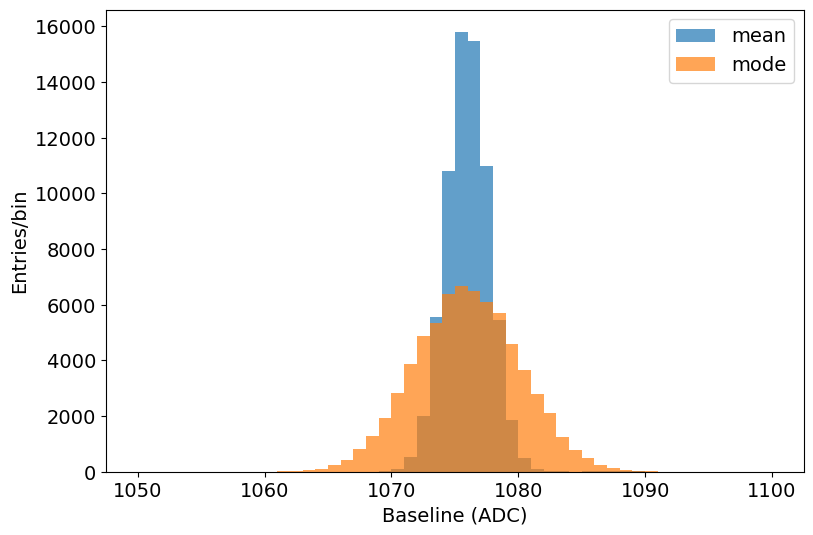

In [100]:
plt.hist(all_bslns_mean[0], bins=50, range=(1050, 1100), alpha=0.7, label='mean')
plt.hist(all_bslns_mode[0], bins=50, range=(1050, 1100), alpha=0.7, label='mode')
plt.xlabel('Baseline (ADC)')
plt.ylabel('Entries/bin')
plt.legend()
plt.show()

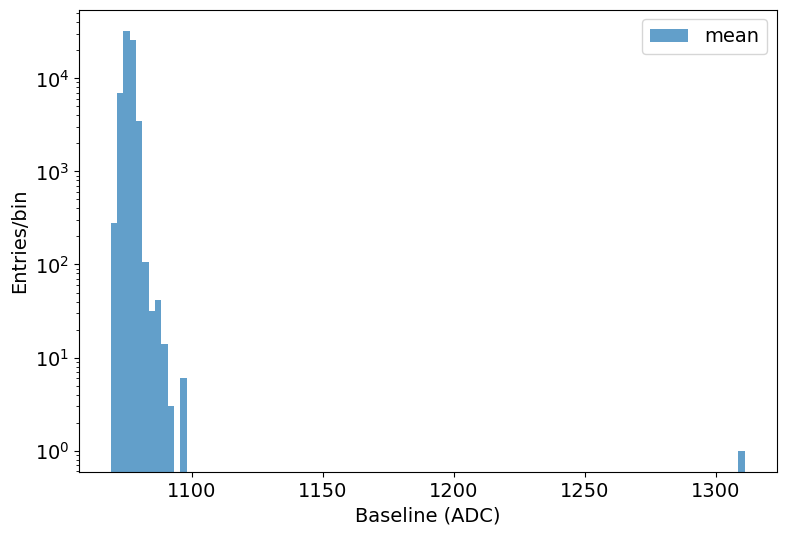

In [101]:
plt.hist(all_bslns_mean[0], bins=100, alpha=0.7, label='mean', log=True)
plt.xlabel('Baseline (ADC)')
plt.ylabel('Entries/bin')
plt.legend()
plt.show()

In [102]:
np.argmax(all_bslns_mean[0])

26047

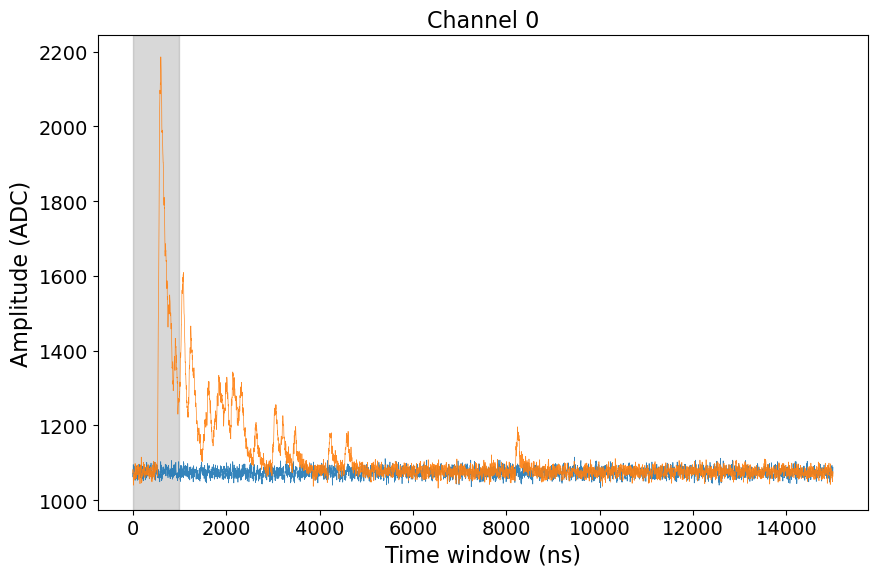

In [103]:
f_name  = '/Users/romoluque_c/LEGEND/BACON/new_setup/datatest/' + filenames[1]
infile  = uproot.open(f_name)
RawTree = infile['RawTree']

fig     = plt.figure(figsize=(9, 6))
sel_ch  = 0
for evt in [0, 2952]:
    wf = np.array(RawTree[f'chan{sel_ch}/rdigi'].array())[evt]
    plt.plot(2*np.arange(len(wf)), wf, linewidth=0.5, alpha=0.9)
plt.axvspan(0, 2*500, color='grey', alpha=0.3)
plt.xlabel('Time window (ns)', fontsize=16)
plt.ylabel('Amplitude (ADC)',  fontsize=16)
plt.title(f"Channel {sel_ch}",     fontsize=16)
plt.tight_layout()
plt.show()

## Get the single PE spectrum:

In [220]:
max_vals_dict = {ch: np.array([]) for ch in range(9)}
some_files = np.sort(glob.glob('/Users/romoluque_c/LEGEND/BACON/new_setup/datatest/run-09_02_2024-*.root'))
for i,filename in enumerate(some_files):
    infile   = uproot.open(filename)
    RawTree  = infile['RawTree']
    max_vals_ch = np.array([])
    for ch in range(9):
        rms_thr  = means_dict[ch] + 5 *sigms_dict[ch]
        all_wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
        rms_vals = np.std(all_wfs, axis=1)
        filt_wfs = all_wfs[rms_vals > rms_thr]
        max_vals = np.max(filt_wfs, axis=1)
        max_vals_dict[ch] = np.concatenate((max_vals_dict[ch], max_vals))
        print(f"{i}/{len(some_files)}", ch, len(max_vals))

0/10 0 332
0/10 1 315
0/10 2 692
0/10 3 396
0/10 4 372
0/10 5 832
0/10 6 426
0/10 7 565
0/10 8 1804
1/10 0 382
1/10 1 329
1/10 2 751
1/10 3 483
1/10 4 434
1/10 5 903
1/10 6 551
1/10 7 653
1/10 8 1655
2/10 0 307
2/10 1 225
2/10 2 671
2/10 3 331
2/10 4 249
2/10 5 760
2/10 6 339
2/10 7 451
2/10 8 1669
3/10 0 297
3/10 1 230
3/10 2 580
3/10 3 326
3/10 4 226
3/10 5 644
3/10 6 343
3/10 7 438
3/10 8 1608
4/10 0 312
4/10 1 246
4/10 2 545
4/10 3 319
4/10 4 250
4/10 5 578
4/10 6 330
4/10 7 433
4/10 8 1416
5/10 0 288
5/10 1 240
5/10 2 512
5/10 3 335
5/10 4 231
5/10 5 531
5/10 6 328
5/10 7 454
5/10 8 1292
6/10 0 299
6/10 1 192
6/10 2 527
6/10 3 317
6/10 4 240
6/10 5 536
6/10 6 305
6/10 7 392
6/10 8 1223
7/10 0 265
7/10 1 193
7/10 2 389
7/10 3 297
7/10 4 204
7/10 5 492
7/10 6 249
7/10 7 384
7/10 8 989
8/10 0 296
8/10 1 198
8/10 2 434
8/10 3 293
8/10 4 240
8/10 5 512
8/10 6 278
8/10 7 405
8/10 8 1092
9/10 0 162
9/10 1 92
9/10 2 209
9/10 3 153
9/10 4 111
9/10 5 256
9/10 6 147
9/10 7 177
9/10 8 470


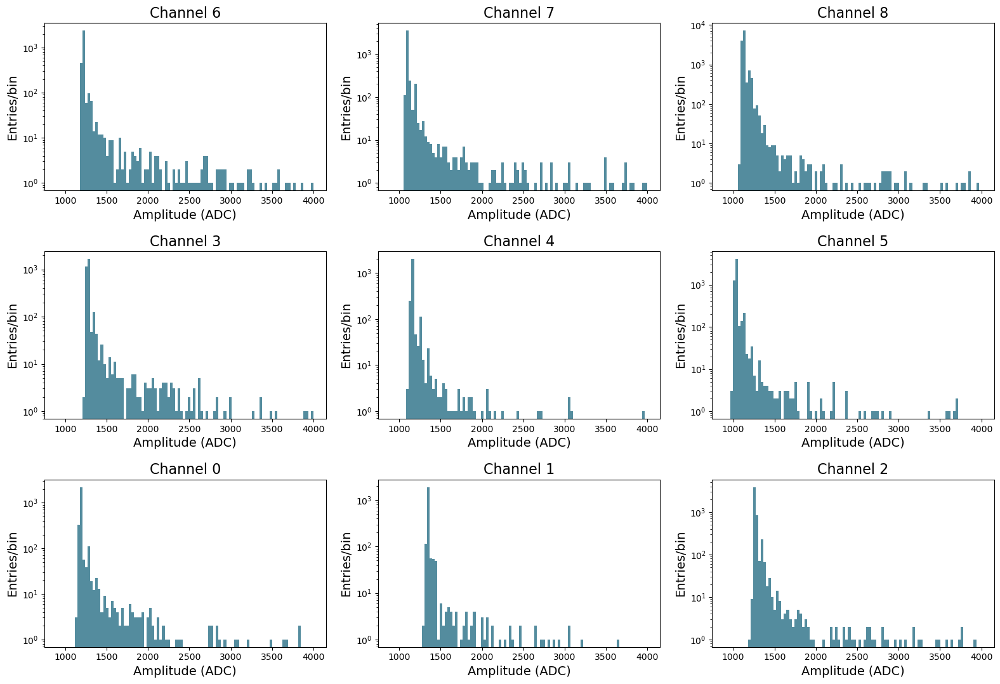

In [225]:
fig, axs   = plt.subplots(3, 3, figsize=(16, 11))
for row, ich in enumerate(reversed(np.arange(0, 9, 3))):
    for col in range(3):
        ch = ich + col
        axs[row][col].hist(max_vals_dict[ch], bins=100, range=(900, 4000), color=fav_col, alpha=0.9, log=True)
        axs[row][col].set_xlabel('Amplitude (ADC)', fontsize=14)
        axs[row][col].set_ylabel('Entries/bin',     fontsize=14)
        axs[row][col].set_title(f"Channel {ch}",    fontsize=16)
        axs[row][col].tick_params(axis='x', labelsize=10)
        axs[row][col].tick_params(axis='y', labelsize=10)
        
plt.tight_layout()
plt.show()

#### Let's try without filtering with rms

In [226]:
max_vals_dict2 = {ch: np.array([]) for ch in range(9)}
some_files = np.sort(glob.glob('/Users/romoluque_c/LEGEND/BACON/new_setup/datatest/run-09_02_2024-*.root'))
for i,filename in enumerate(some_files):
    infile   = uproot.open(filename)
    RawTree  = infile['RawTree']
    max_vals_ch = np.array([])
    for ch in range(9):
        rms_thr  = means_dict[ch] + 5 *sigms_dict[ch]
        all_wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
        max_vals = np.max(all_wfs, axis=1)
        max_vals_dict2[ch] = np.concatenate((max_vals_dict2[ch], max_vals))
        print(f"{i}/{len(some_files)}", ch, len(max_vals))

0/10 0 23096
0/10 1 23096
0/10 2 23096
0/10 3 23096
0/10 4 23096
0/10 5 23096
0/10 6 23096
0/10 7 23096
0/10 8 23096
1/10 0 23095
1/10 1 23095
1/10 2 23095
1/10 3 23095
1/10 4 23095
1/10 5 23095
1/10 6 23095
1/10 7 23095
1/10 8 23095
2/10 0 23095
2/10 1 23095
2/10 2 23095
2/10 3 23095
2/10 4 23095
2/10 5 23095
2/10 6 23095
2/10 7 23095
2/10 8 23095
3/10 0 23095
3/10 1 23095
3/10 2 23095
3/10 3 23095
3/10 4 23095
3/10 5 23095
3/10 6 23095
3/10 7 23095
3/10 8 23095
4/10 0 23095
4/10 1 23095
4/10 2 23095
4/10 3 23095
4/10 4 23095
4/10 5 23095
4/10 6 23095
4/10 7 23095
4/10 8 23095
5/10 0 23095
5/10 1 23095
5/10 2 23095
5/10 3 23095
5/10 4 23095
5/10 5 23095
5/10 6 23095
5/10 7 23095
5/10 8 23095
6/10 0 23095
6/10 1 23095
6/10 2 23095
6/10 3 23095
6/10 4 23095
6/10 5 23095
6/10 6 23095
6/10 7 23095
6/10 8 23095
7/10 0 23095
7/10 1 23095
7/10 2 23095
7/10 3 23095
7/10 4 23095
7/10 5 23095
7/10 6 23095
7/10 7 23095
7/10 8 23095
8/10 0 23095
8/10 1 23095
8/10 2 23095
8/10 3 23095
8/10 4 23095

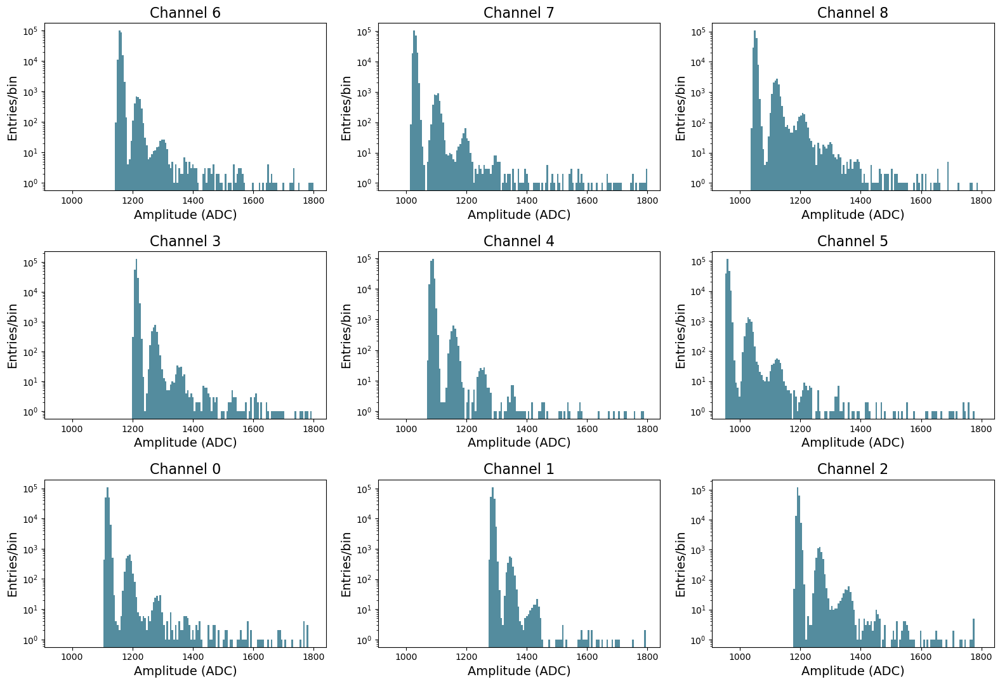

In [231]:
fig, axs   = plt.subplots(3, 3, figsize=(16, 11))
for row, ich in enumerate(reversed(np.arange(0, 9, 3))):
    for col in range(3):
        ch = ich + col
        axs[row][col].hist(max_vals_dict2[ch], bins=150, range=(950, 1800), color=fav_col, alpha=0.9, log=True)
        axs[row][col].set_xlabel('Amplitude (ADC)', fontsize=14)
        axs[row][col].set_ylabel('Entries/bin',     fontsize=14)
        axs[row][col].set_title(f"Channel {ch}",    fontsize=16)
        axs[row][col].tick_params(axis='x', labelsize=10)
        axs[row][col].tick_params(axis='y', labelsize=10)
        
plt.tight_layout()
plt.show()

### Let's subtract the baseline:

In [232]:
max_vals_dict3 = {ch: np.array([]) for ch in range(9)}
some_files = np.sort(glob.glob('/Users/romoluque_c/LEGEND/BACON/new_setup/datatest/run-09_02_2024-*.root'))
for i,filename in enumerate(some_files):
    infile   = uproot.open(filename)
    RawTree  = infile['RawTree']
    max_vals_ch = np.array([])
    for ch in range(9):
        rms_thr  = means_dict[ch] + 5 *sigms_dict[ch]
        all_wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
        subt_wfs = pf.subtract_baseline(all_wfs, mode=True, wf_range_bsl=(0, 500))
        max_vals = np.max(subt_wfs, axis=1)
        max_vals_dict3[ch] = np.concatenate((max_vals_dict3[ch], max_vals))
        print(f"{i}/{len(some_files)}", ch, len(max_vals))

0/10 0 23096
0/10 1 23096
0/10 2 23096
0/10 3 23096
0/10 4 23096
0/10 5 23096
0/10 6 23096
0/10 7 23096
0/10 8 23096
1/10 0 23095
1/10 1 23095
1/10 2 23095
1/10 3 23095
1/10 4 23095
1/10 5 23095
1/10 6 23095
1/10 7 23095
1/10 8 23095
2/10 0 23095
2/10 1 23095
2/10 2 23095
2/10 3 23095
2/10 4 23095
2/10 5 23095
2/10 6 23095
2/10 7 23095
2/10 8 23095
3/10 0 23095
3/10 1 23095
3/10 2 23095
3/10 3 23095
3/10 4 23095
3/10 5 23095
3/10 6 23095
3/10 7 23095
3/10 8 23095
4/10 0 23095
4/10 1 23095
4/10 2 23095
4/10 3 23095
4/10 4 23095
4/10 5 23095
4/10 6 23095
4/10 7 23095
4/10 8 23095
5/10 0 23095
5/10 1 23095
5/10 2 23095
5/10 3 23095
5/10 4 23095
5/10 5 23095
5/10 6 23095
5/10 7 23095
5/10 8 23095
6/10 0 23095
6/10 1 23095
6/10 2 23095
6/10 3 23095
6/10 4 23095
6/10 5 23095
6/10 6 23095
6/10 7 23095
6/10 8 23095
7/10 0 23095
7/10 1 23095
7/10 2 23095
7/10 3 23095
7/10 4 23095
7/10 5 23095
7/10 6 23095
7/10 7 23095
7/10 8 23095
8/10 0 23095
8/10 1 23095
8/10 2 23095
8/10 3 23095
8/10 4 23095

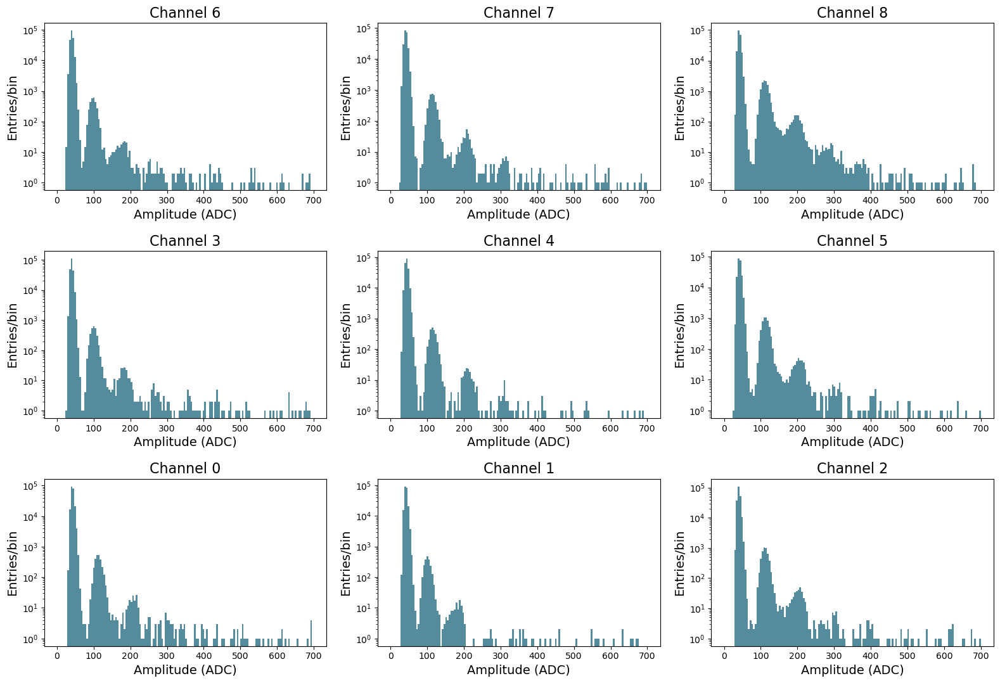

In [237]:
fig, axs   = plt.subplots(3, 3, figsize=(16, 11))
for row, ich in enumerate(reversed(np.arange(0, 9, 3))):
    for col in range(3):
        ch = ich + col
        axs[row][col].hist(max_vals_dict3[ch], bins=150, range=(0, 700), color=fav_col, alpha=0.9, log=True)
        axs[row][col].set_xlabel('Amplitude (ADC)', fontsize=14)
        axs[row][col].set_ylabel('Entries/bin',     fontsize=14)
        axs[row][col].set_title(f"Channel {ch}",    fontsize=16)
        axs[row][col].tick_params(axis='x', labelsize=10)
        axs[row][col].tick_params(axis='y', labelsize=10)
        
plt.tight_layout()
plt.show()

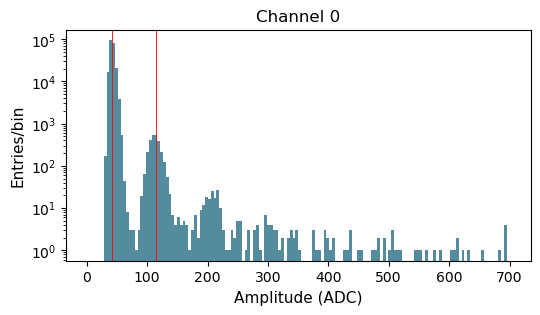

73

In [298]:
fig, ax0 = plt.subplots(1, 1, figsize=(6, 3))
ch = 0
ax0.hist(max_vals_dict3[ch], bins=150, range=(0, 700), color=fav_col, alpha=0.9, log=True)
ax0.axvline( 42, color='r', lw=0.6)
ax0.axvline(115, color='r', lw=0.6)
ax0.set_xlabel('Amplitude (ADC)', fontsize=11)
ax0.set_ylabel('Entries/bin',     fontsize=11)
ax0.set_title(f"Channel {ch}",    fontsize=12)
ax0.tick_params(axis='x', labelsize=10)
ax0.tick_params(axis='y', labelsize=10)
plt.show()

115-42

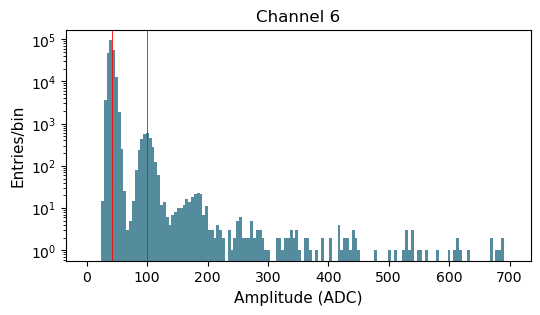

73

In [341]:
fig, ax0 = plt.subplots(1, 1, figsize=(6, 3))
ch = 6
ax0.hist(max_vals_dict3[ch], bins=150, range=(0, 700), color=fav_col, alpha=0.9, log=True)
ax0.axvline( 42, color='r', lw=0.6)
ax0.axvline(100, color='r', lw=0.6)
ax0.set_xlabel('Amplitude (ADC)', fontsize=11)
ax0.set_ylabel('Entries/bin',     fontsize=11)
ax0.set_title(f"Channel {ch}",    fontsize=12)
ax0.tick_params(axis='x', labelsize=10)
ax0.tick_params(axis='y', labelsize=10)
plt.show()

115-42

## Compute rms after subtracting baseline:

In [253]:
def gaussian(x, amplitude, mean, stddev):
    return amplitude * np.exp(-((x - mean) ** 2) / (2 * stddev ** 2))

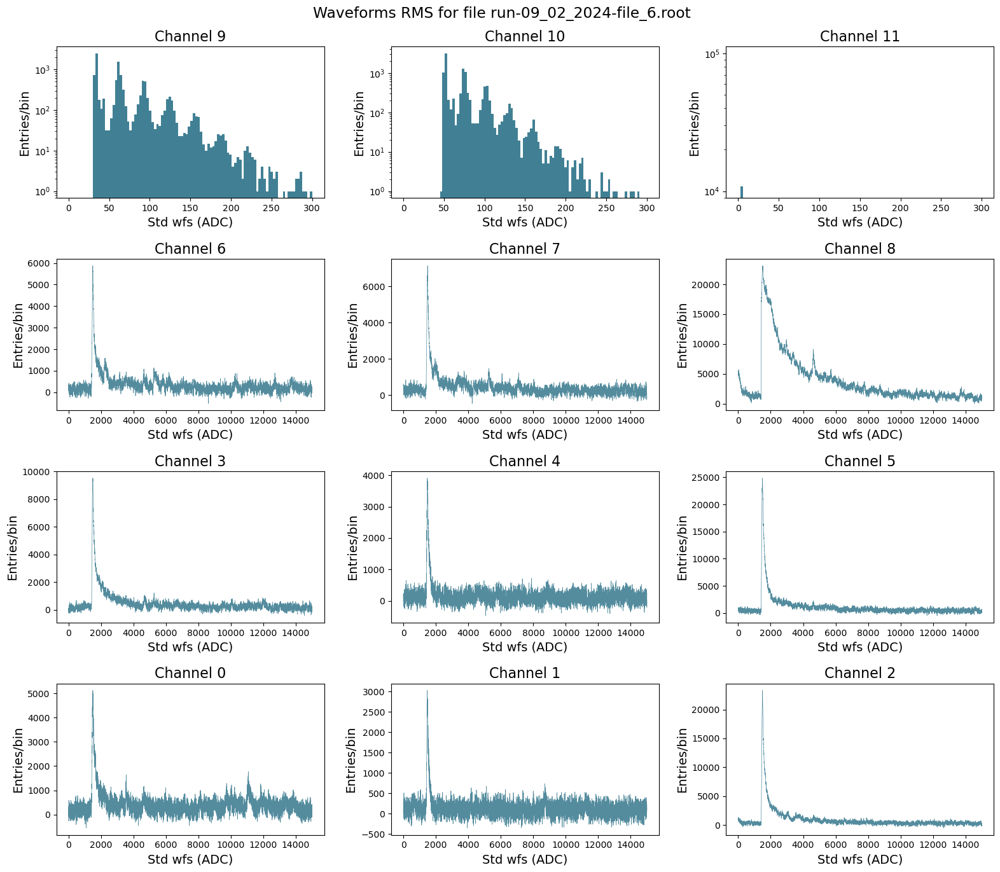

In [259]:
from scipy.signal   import find_peaks
from scipy.optimize import curve_fit

fig, axs   = plt.subplots(4, 3, figsize=(16, 14))
for row, ich in enumerate(reversed(np.arange(0, 12, 3))):
    for col in range(3):
        ch = ich + col
        all_wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
        subt_wfs = pf.subtract_baseline(all_wfs, mode=True, wf_range_bsl=(0, 500))
        rms_vals = np.std(subt_wfs, axis=1)
        
        if ich in [9, 10, 11]:
            axs[row][col].hist(rms_vals, bins=100, range=(0, 300), color=fav_col, log=True)
        else:
            #y, x, _ = axs[row][col].hist(rms_vals, bins=100, range=(8, 18), color=fav_col, log=True)
            y, x = np.histogram(rms_vals, bins=100, range=(8, 18))

            initial_guess = [np.max(y), x[np.argmax(y)], 0.15]  # stddev is initialized to 1
            (_, mean_fit, std_fit), _ = curve_fit(gaussian, x[1:], y, p0=initial_guess)
            
            rms_thr  = mean_fit + 5*std_fit
            filt_wfs = subt_wfs[rms_vals > rms_thr]
            sum_fwfs = np.sum(filt_wfs, axis=0)
            axs[row][col].plot(2*np.arange(len(sum_fwfs)), sum_fwfs, linewidth=0.5, color='#418094', alpha=0.9)
            
        axs[row][col].set_xlabel('Std wfs (ADC)', fontsize=14)
        axs[row][col].set_ylabel('Entries/bin',  fontsize=14)
        axs[row][col].set_title(f"Channel {ch}",     fontsize=16)
        axs[row][col].tick_params(axis='x', labelsize=10)
        axs[row][col].tick_params(axis='y', labelsize=10)
        
plt.suptitle(f'Waveforms RMS for file {fname}')
plt.tight_layout()
plt.show()

### Find peaks test

In [247]:
from scipy.signal import find_peaks

for ich in range(9):
    ch = ich + col
    all_wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
    subt_wfs = pf.subtract_baseline(all_wfs, mode=True, wf_range_bsl=(0, 500))
    rms_vals = np.std(all_wfs, axis=1)
    print(np.histogram(rms_vals))
#    print(find_peaks(rms_vals))


(array([10887,     0,     1,     0,     0,     0,     0,     0,     0,
           2]), array([ 10.10099888,  91.48314027, 172.86528166, 254.24742306,
       335.62956445, 417.01170584, 498.39384724, 579.77598863,
       661.15813002, 742.54027141, 823.92241281]))
(array([10888,     0,     0,     0,     1,     0,     0,     0,     0,
           1]), array([  9.95139441,  52.0975188 ,  94.2436432 , 136.3897676 ,
       178.53589199, 220.68201639, 262.82814079, 304.97426518,
       347.12038958, 389.26651398, 431.41263837]))
(array([10820,    55,    13,     1,     0,     0,     0,     0,     0,
           1]), array([10.83956219, 13.25910649, 15.67865079, 18.0981951 , 20.5177394 ,
       22.93728371, 25.35682801, 27.77637232, 30.19591662, 32.61546093,
       35.03500523]))
(array([10887,     1,     0,     0,     1,     0,     0,     0,     0,
           1]), array([  10.5212575 ,  133.06482668,  255.60839586,  378.15196504,
        500.69553422,  623.23910341,  745.78267259,  868.32624177

## Test file from Sept 9th

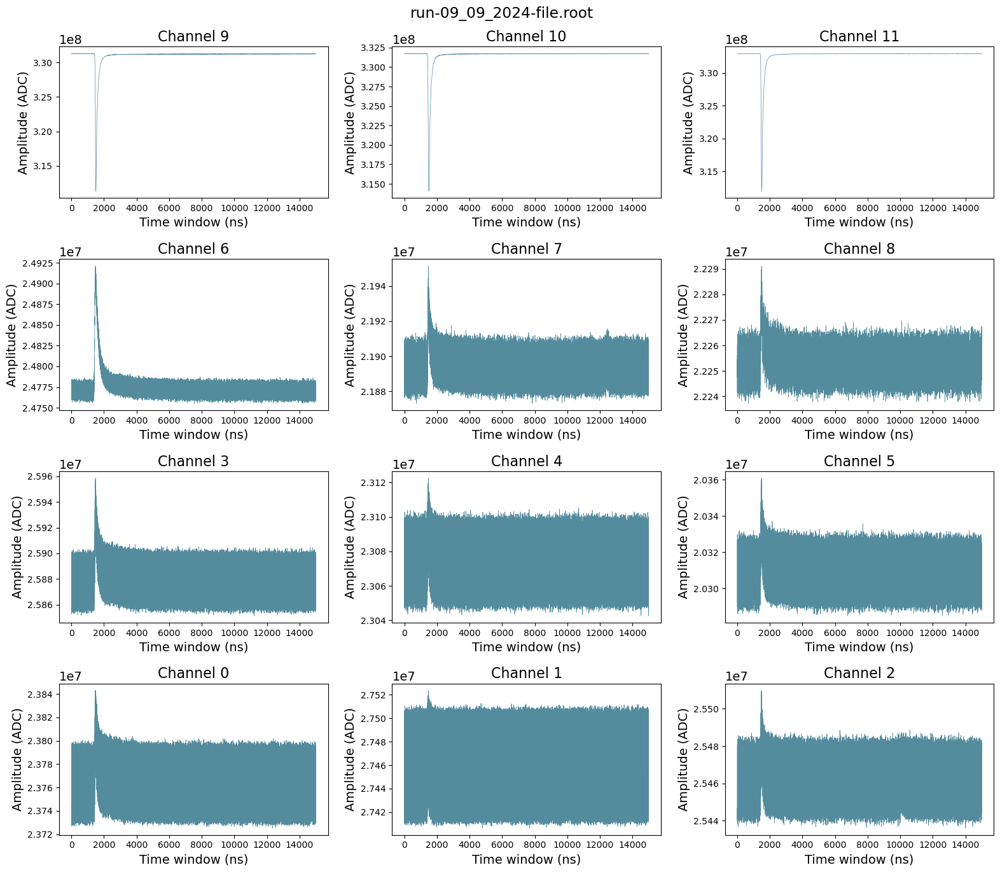

In [260]:
filename = '/Users/romoluque_c/LEGEND/BACON/new_setup/datatest/run-09_09_2024-file.root'
infile   = uproot.open(filename)
RawTree  = infile['RawTree']

fig, axs   = plt.subplots(4, 3, figsize=(16, 14))
for row, ich in enumerate(reversed(np.arange(0, 12, 3))):
    for col in range(3):
        ch = ich + col
        all_wfs = np.array(RawTree[f'chan{ch}/rdigi'].array())
        sum_wfs = np.sum(all_wfs, axis=0)
        axs[row][col].plot(2*np.arange(len(wf)), sum_wfs, linewidth=0.5, color=fav_col, alpha=0.9)
        axs[row][col].set_xlabel('Time window (ns)', fontsize=14)
        axs[row][col].set_ylabel('Amplitude (ADC)',  fontsize=14)
        axs[row][col].set_title(f"Channel {ch}",     fontsize=16)
        axs[row][col].tick_params(axis='x', labelsize=10)
        axs[row][col].tick_params(axis='y', labelsize=10)
        
fname = filename.split("/")[-1]
fig.suptitle(fname)
plt.tight_layout()
plt.show()

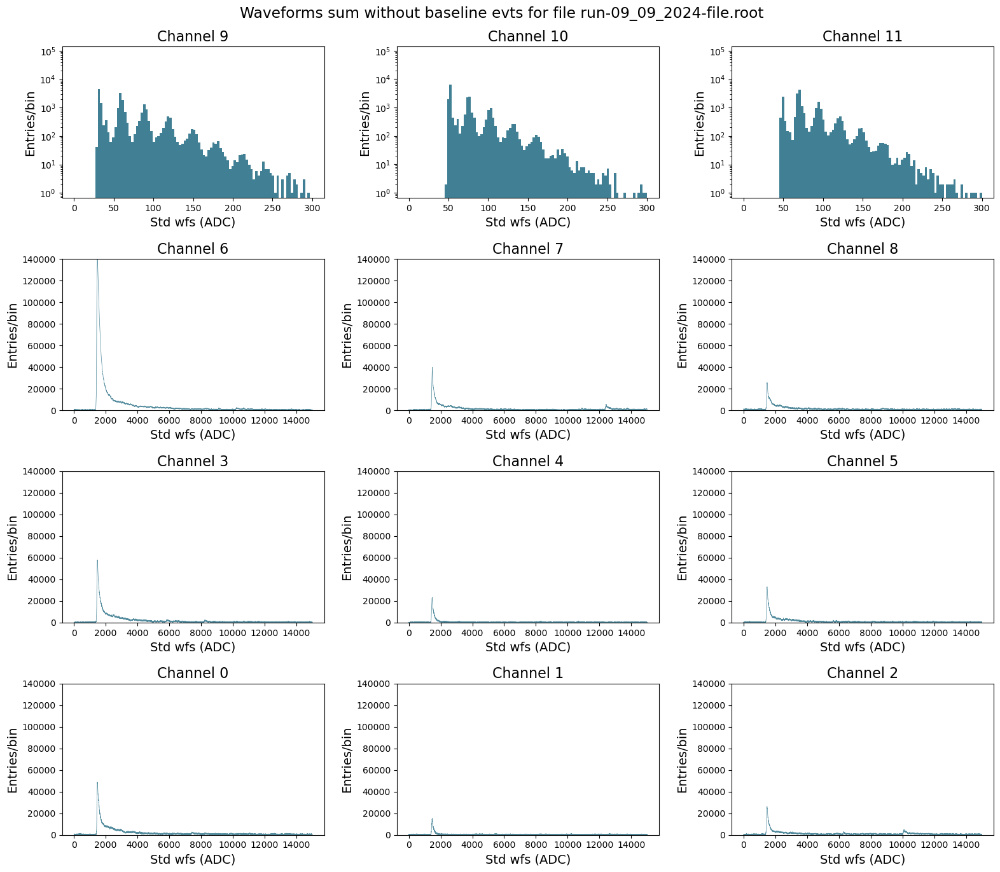

In [263]:
save_thr = []
fig, axs = plt.subplots(4, 3, figsize=(16, 14))
for row, ich in enumerate(reversed(np.arange(0, 12, 3))):
    for col in range(3):
        ch = ich + col
        all_wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
        subt_wfs = pf.subtract_baseline(all_wfs, mode=True, wf_range_bsl=(0, 500))
        rms_vals = np.std(subt_wfs, axis=1)
        
        if ich in [9, 10, 11]:
            axs[row][col].hist(rms_vals, bins=100, range=(0, 300), color=fav_col, log=True)
        else:
            #y, x, _ = axs[row][col].hist(rms_vals, bins=100, range=(8, 18), color=fav_col, log=True)
            y, x = np.histogram(rms_vals, bins=100, range=(8, 18))

            initial_guess = [np.max(y), x[np.argmax(y)], 0.15]  # stddev is initialized to 1
            (_, mean_fit, std_fit), _ = curve_fit(gaussian, x[1:], y, p0=initial_guess)
            
            rms_thr  = mean_fit + 5*std_fit
            save_thr.append(rms_thr)
            filt_wfs = subt_wfs[rms_vals > rms_thr]
            sum_fwfs = np.sum(filt_wfs, axis=0)
            axs[row][col].plot(2*np.arange(len(sum_fwfs)), sum_fwfs, linewidth=0.5, color='#418094', alpha=0.9)
            
        axs[row][col].set_xlabel('Std wfs (ADC)', fontsize=14)
        axs[row][col].set_ylabel('Entries/bin',   fontsize=14)
        axs[row][col].set_title(f"Channel {ch}",  fontsize=16)
        axs[row][col].set_ylim(0, 140000)
        axs[row][col].tick_params(axis='x', labelsize=10)
        axs[row][col].tick_params(axis='y', labelsize=10)
        
plt.suptitle(f'Waveforms sum without baseline evts for file {fname}')
plt.tight_layout()
plt.show()

In [264]:
save_thr

[11.474572631093778,
 11.913815964379726,
 12.545492826237568,
 11.421582909126911,
 12.655099521881713,
 11.958139215531657,
 12.265987249642034,
 12.54880140957997,
 11.603146298881214]

In [265]:
for evt in range(20):
    for ich in range(9):
        wf      = np.array(RawTree[f'chan{ch}/rdigi'].array())[evt]
        rms_val = np.std(wf)
        if rms_val>save_thr[ich]:
            print(evt, ich)

0 0
0 1
0 3
0 5
0 6
0 8
1 0
1 1
1 3
1 5
1 6
1 8


In [287]:
ch0       = 0
wfs0      = np.array(RawTree[f'chan{ch0}/rdigi'].array())
rms_vals0 = np.std(wfs0, axis=1)
np.where((rms_vals0 > 1.1 * save_thr[ch0]) & (rms_vals0 < 1.5 * save_thr[ch0]))[0][:20]

array([107, 113, 144, 152, 185, 190, 205, 247, 285, 294, 310, 331, 353,
       360, 378, 513, 549, 561, 566, 597])

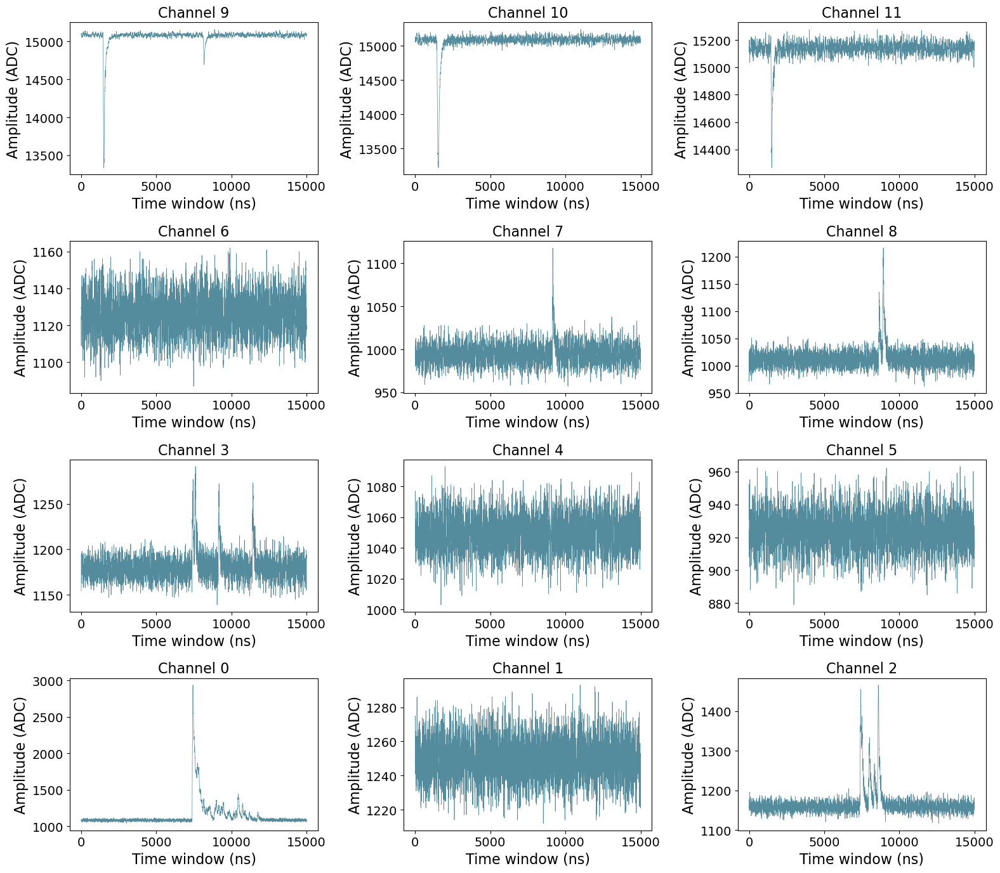

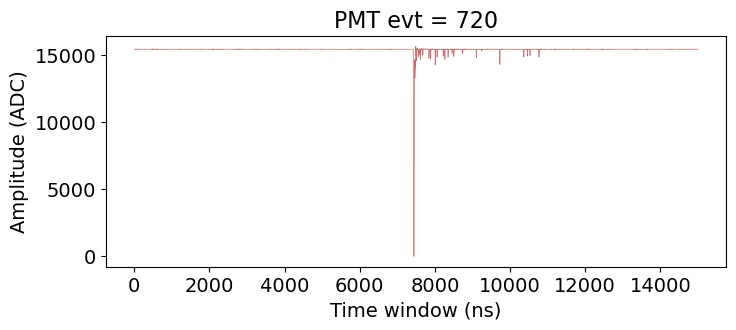

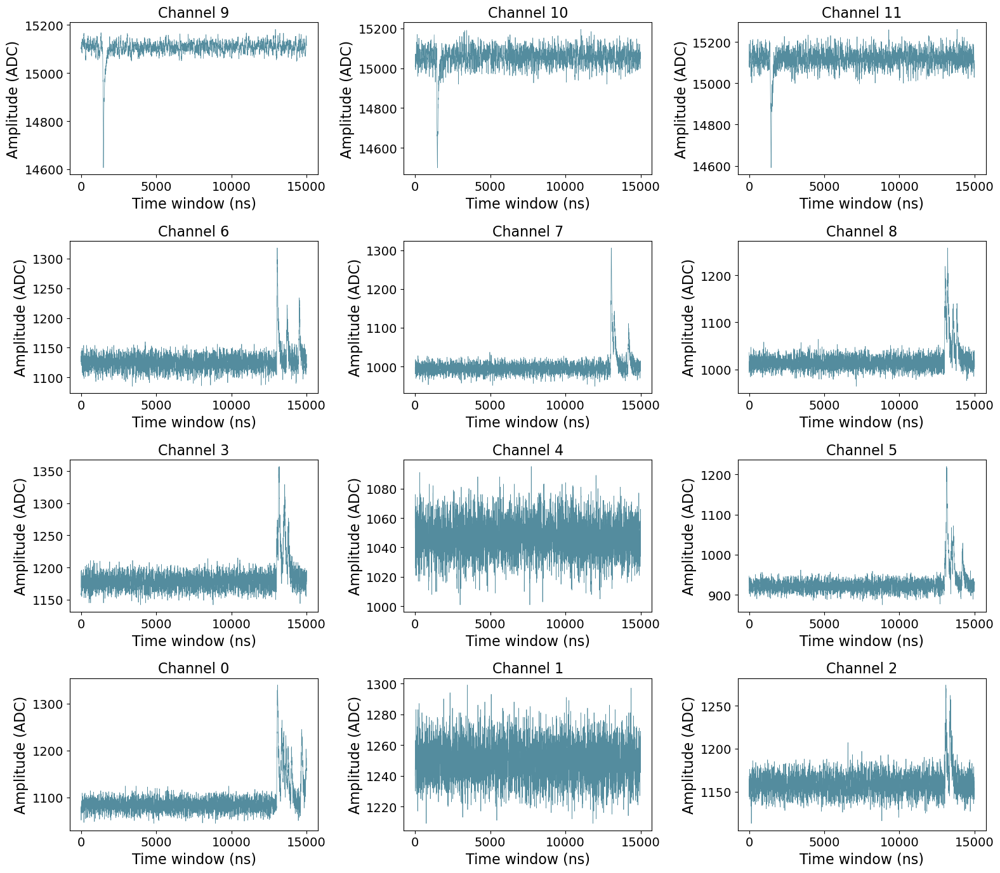

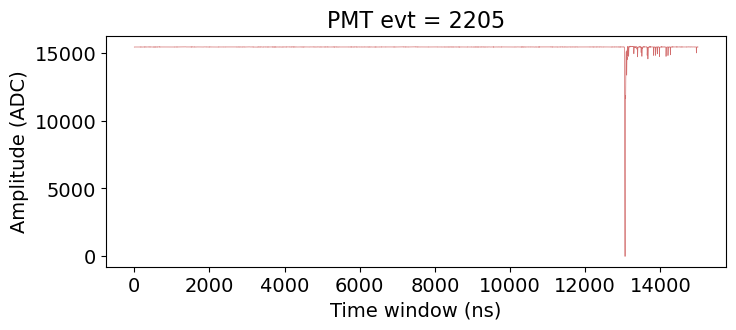

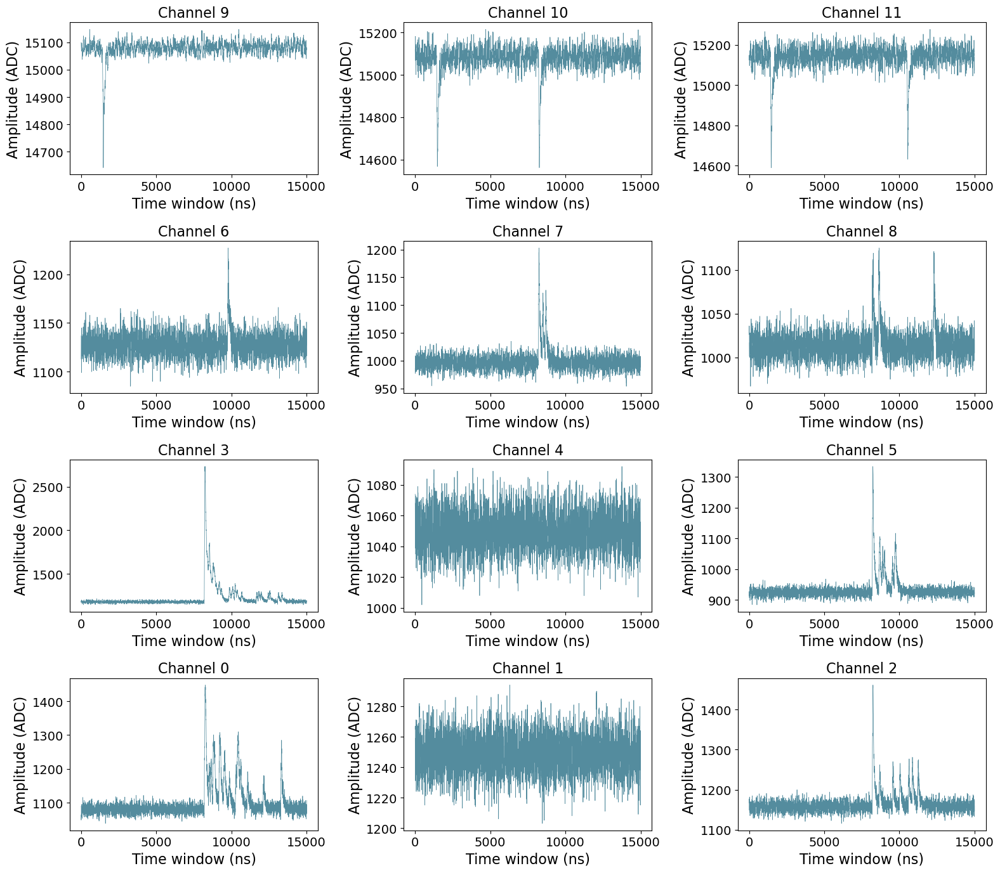

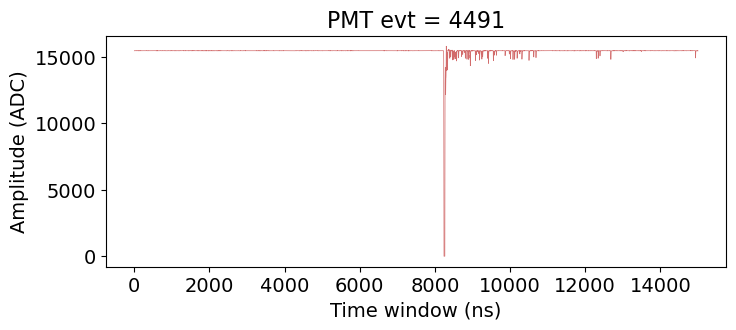

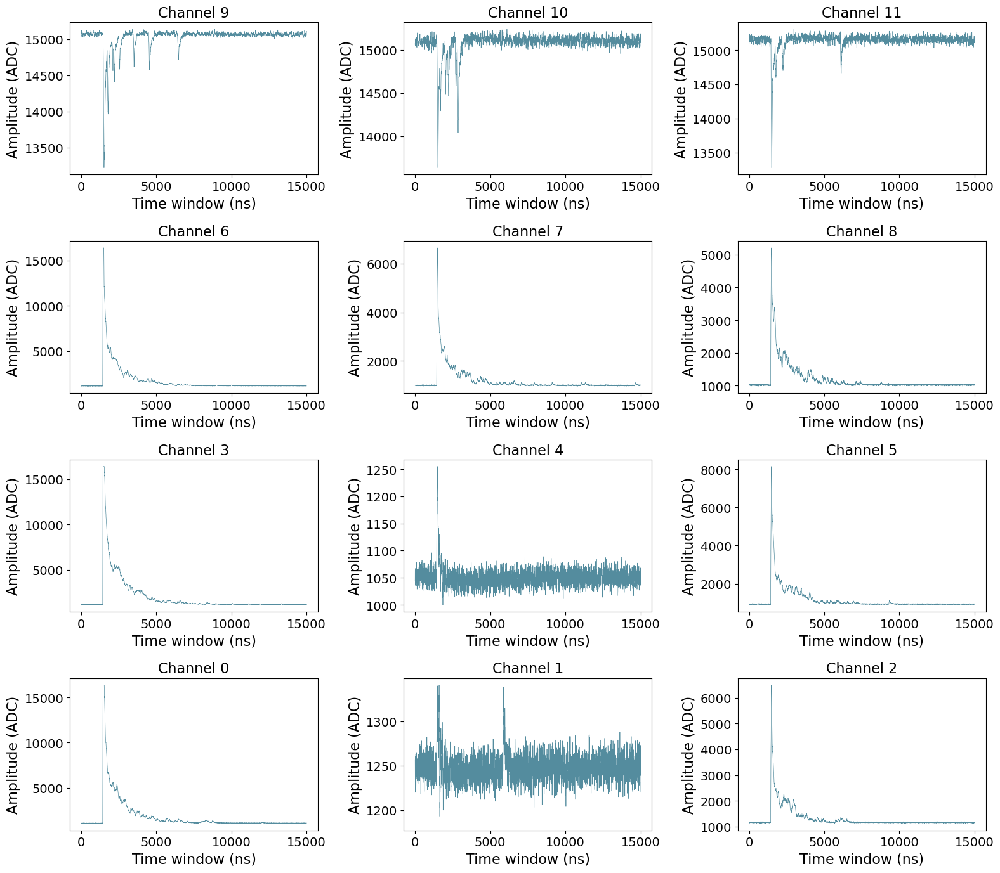

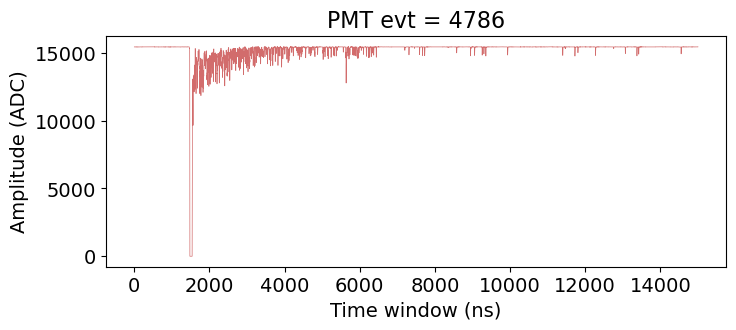

In [274]:
plot_evts = [720, 2205, 4491, 4786]
for evt in plot_evts:
    fig, axs = plt.subplots(4, 3, figsize=(16, 14))
    for row, ich in enumerate(reversed(np.arange(0, 12, 3))):
        for col in range(3):
            ch = ich + col
            wf = np.array(RawTree[f'chan{ch}/rdigi'].array())[evt]
            axs[row][col].plot(2*np.arange(len(wf)), wf, linewidth=0.5, color=fav_col, alpha=0.9)
            axs[row][col].set_xlabel('Time window (ns)', fontsize=16)
            axs[row][col].set_ylabel('Amplitude (ADC)',  fontsize=16)
            axs[row][col].set_title(f"Channel {ch}",     fontsize=16)
    plt.tight_layout()
    plt.show()
    
    fig = plt.figure(figsize=(8, 3))
    wf = np.array(RawTree[f'chan12/rdigi'].array())[evt]
    plt.plot(2*np.arange(len(wf)), wf, linewidth=0.5, color='indianred', alpha=0.9)
    plt.xlabel('Time window (ns)', fontsize=14)
    plt.ylabel('Amplitude (ADC)',  fontsize=14)
    plt.title(f"PMT evt = {evt}", fontsize=16)
    plt.show()

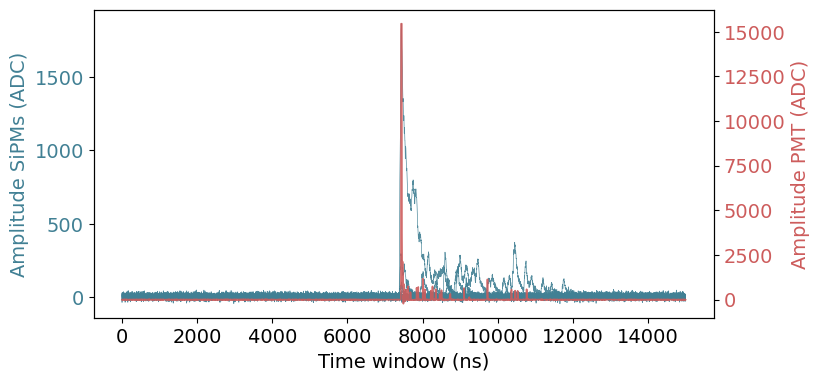

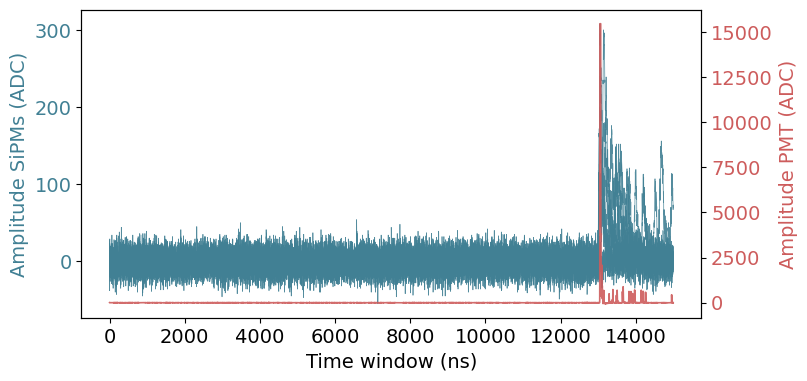

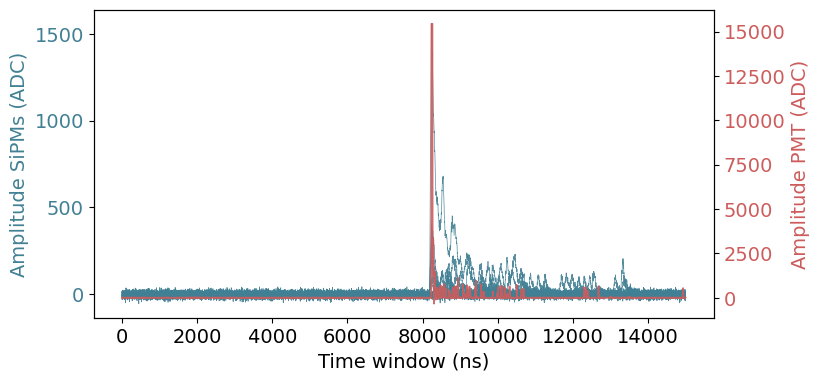

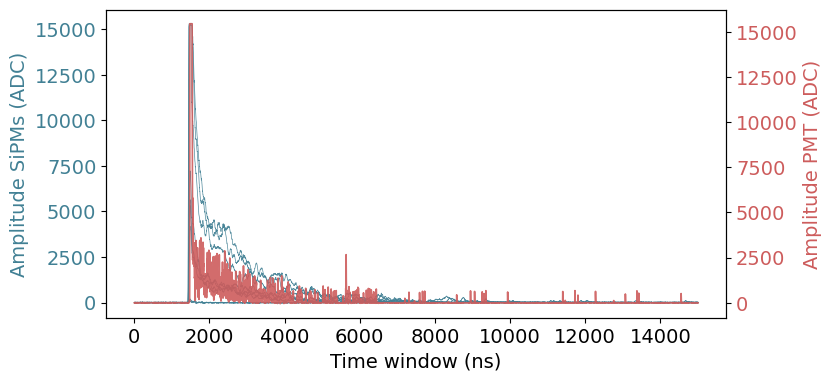

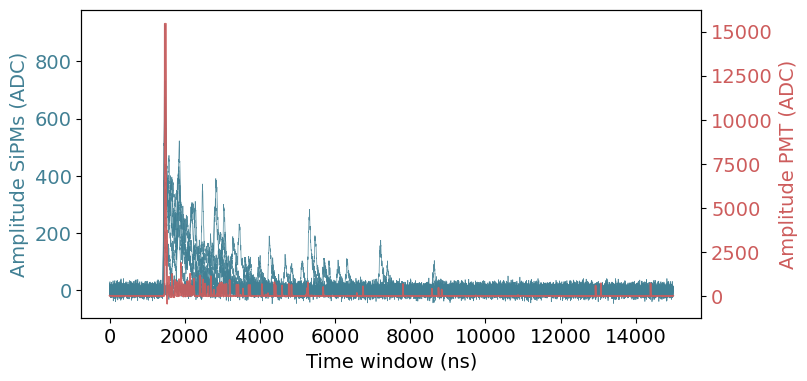

...

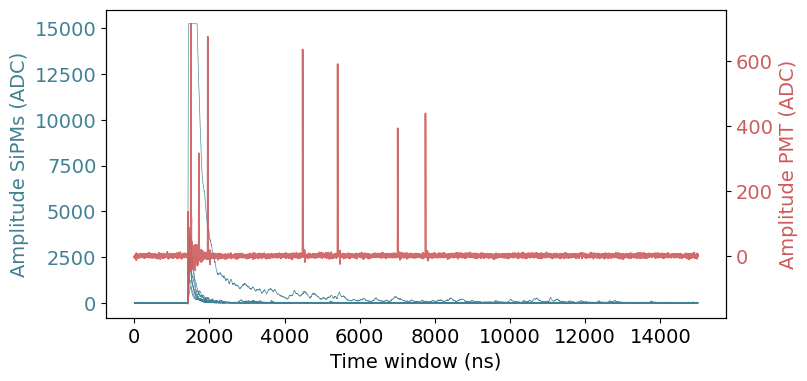

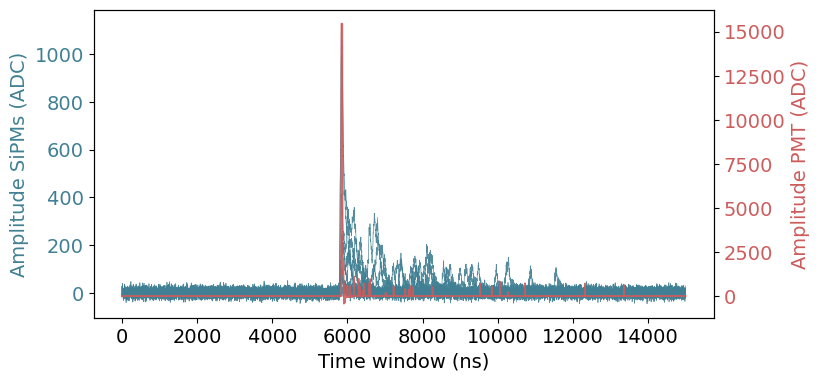

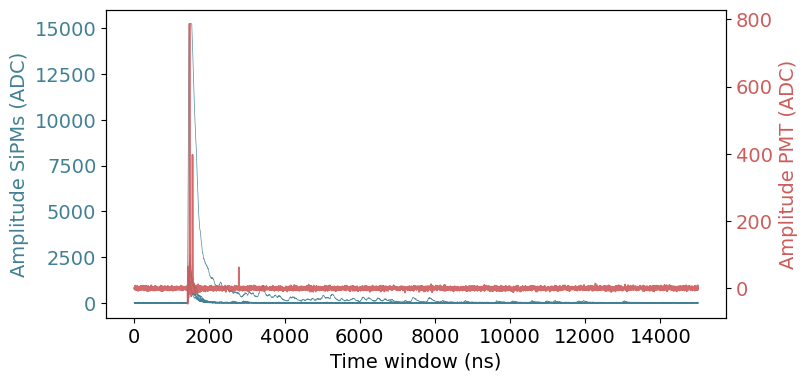

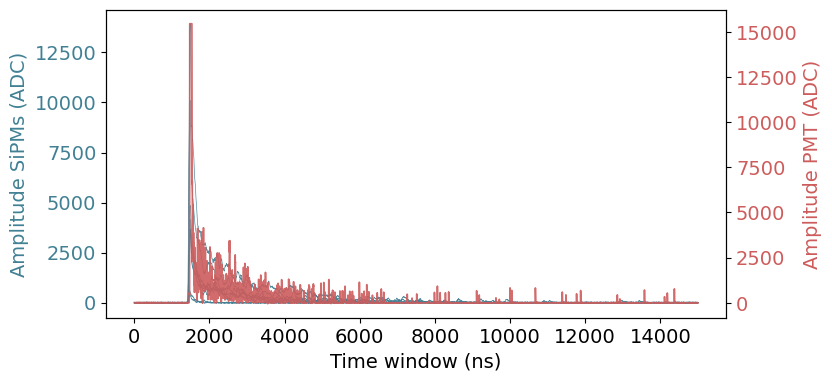

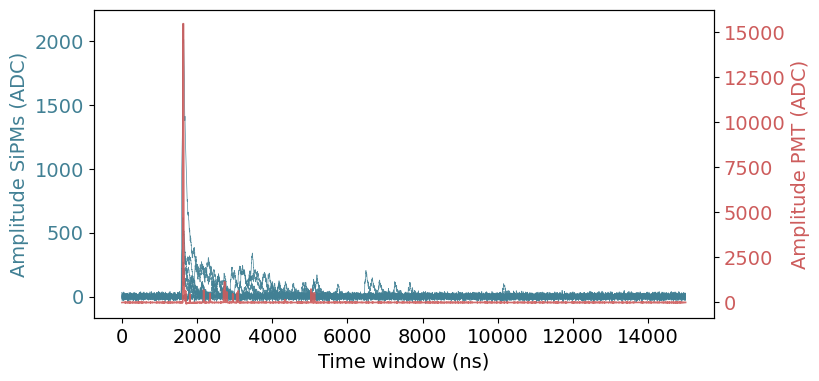

In [281]:
plot_evts = [720, 2205, 4491, 4786, 7607, 8590, 9483, 10675, 12035, 12699, 13086, 14229,
             14650, 14724, 15232, 15348, 16888, 16923, 17457, 18102, 18660, 19249]
for evt in plot_evts:
    
    fig, ax0 = plt.subplots(1, 1, figsize=(8,4))
    ax1 = ax0.twinx()
    for ch in range(9):
        wf  = np.array(RawTree[f'chan{ch}/rdigi'].array())[evt]
        swf = pf.subtract_baseline(wf, mode=True, wf_range_bsl=(0, 500))
        ax0.plot(2*np.arange(len(swf)), swf, linewidth=0.5, color=fav_col, alpha=0.9, label=f'ch = {ch}')
        
    wf  = np.array(RawTree[f'chan12/rdigi'].array())[evt]
    swf = blr.pmt_deconvolver(wf, wf_range_bsl=(0, 500))
    ax1.plot(2*np.arange(len(swf)), swf, linewidth=1.2, color='indianred', alpha=0.9, label='PMT')

    ax0.set_title(f'Evt = {evt}')
    ax0.set_xlabel('Time window (ns)',      fontsize=14)
    ax0.set_ylabel('Amplitude SiPMs (ADC)', fontsize=14, color='#418094')
    ax1.set_ylabel('Amplitude PMT (ADC)',   fontsize=14, color="indianred")
    
    ax0.tick_params(axis='y', labelcolor='#418094')
    ax1.tick_params(axis='y', labelcolor="indianred")
    plt.show()

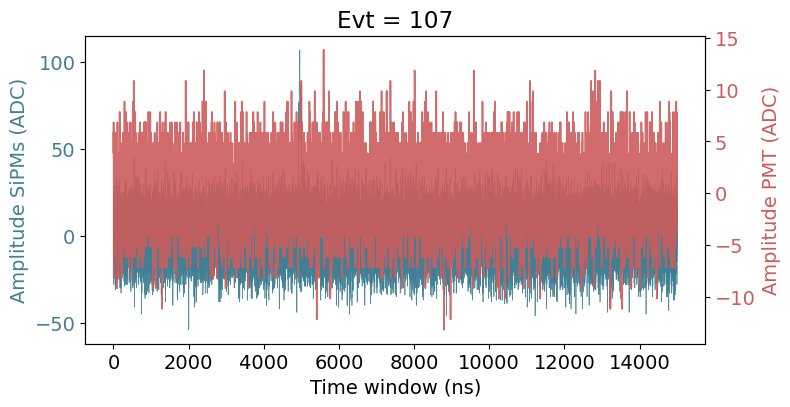

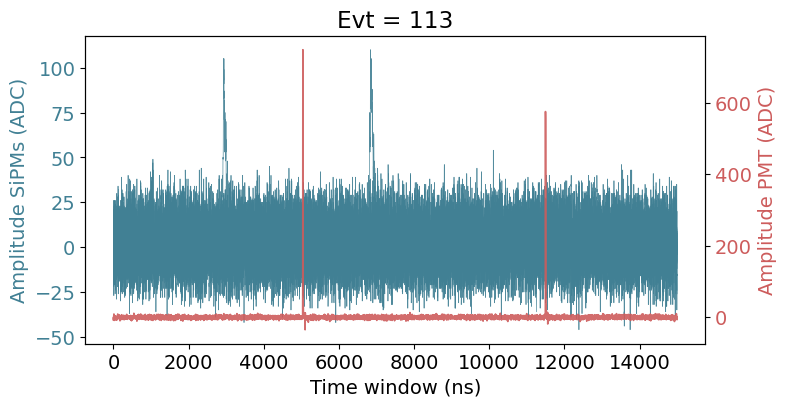

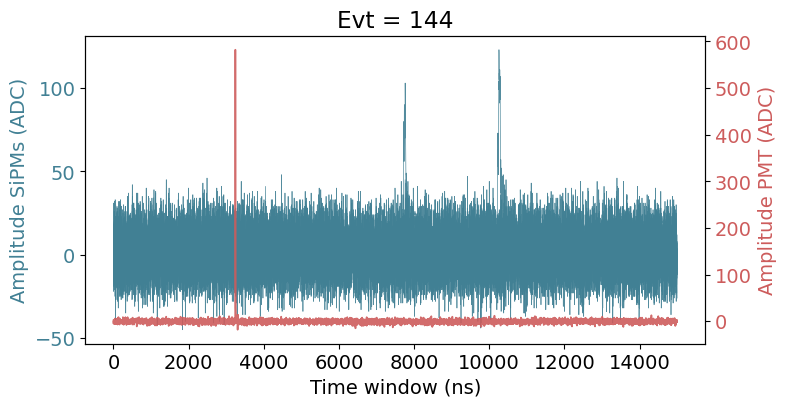

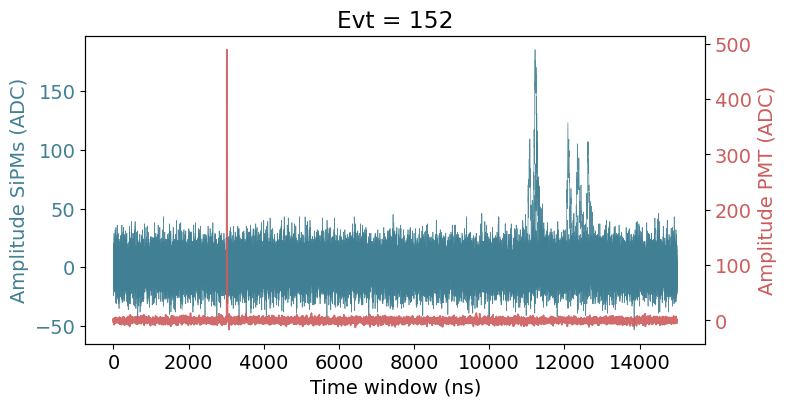

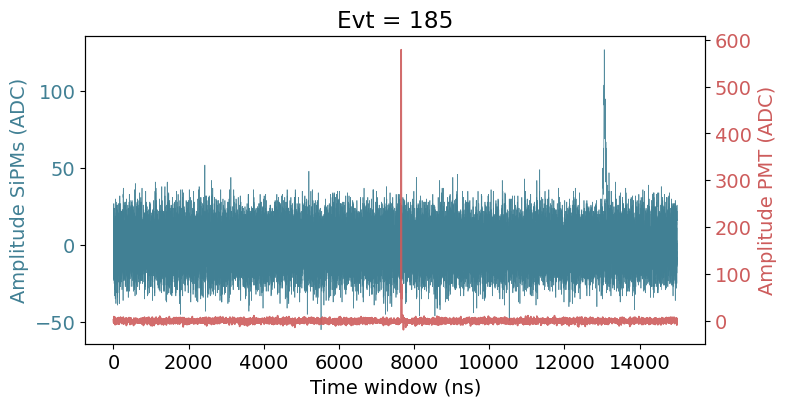

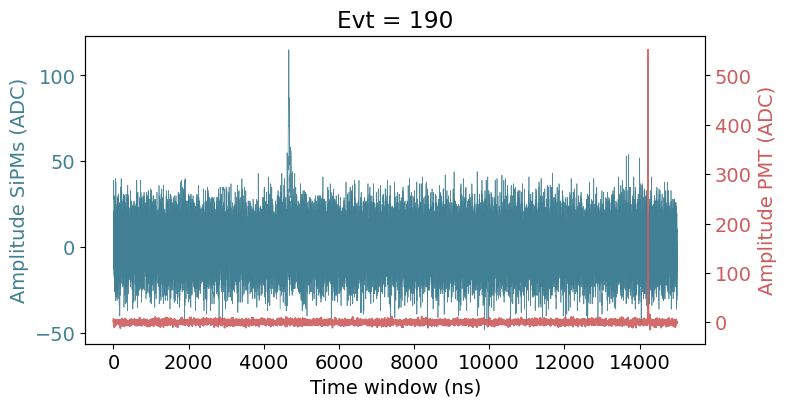

In [288]:
plot_evts = [107, 113, 144, 152, 185, 190]

for evt in plot_evts:
    
    fig, ax0 = plt.subplots(1, 1, figsize=(8,4))
    ax1 = ax0.twinx()
    for ch in range(9):
        wf  = np.array(RawTree[f'chan{ch}/rdigi'].array())[evt]
        swf = pf.subtract_baseline(wf, mode=True, wf_range_bsl=(0, 500))
        ax0.plot(2*np.arange(len(swf)), swf, linewidth=0.5, color=fav_col, alpha=0.9, label=f'ch = {ch}')
        
    wf  = np.array(RawTree[f'chan12/rdigi'].array())[evt]
    swf = blr.pmt_deconvolver(wf, wf_range_bsl=(0, 500))
    ax1.plot(2*np.arange(len(swf)), swf, linewidth=1.2, color='indianred', alpha=0.9, label='PMT')

    ax0.set_title(f'Evt = {evt}')
    ax0.set_xlabel('Time window (ns)',      fontsize=14)
    ax0.set_ylabel('Amplitude SiPMs (ADC)', fontsize=14, color='#418094')
    ax1.set_ylabel('Amplitude PMT (ADC)',   fontsize=14, color="indianred")
    
    ax0.tick_params(axis='y', labelcolor='#418094')
    ax1.tick_params(axis='y', labelcolor="indianred")
    plt.show()

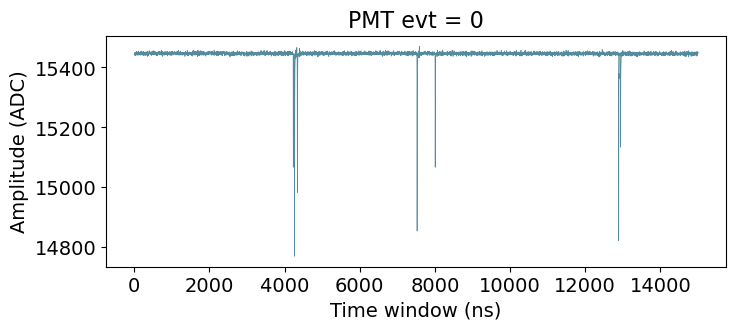

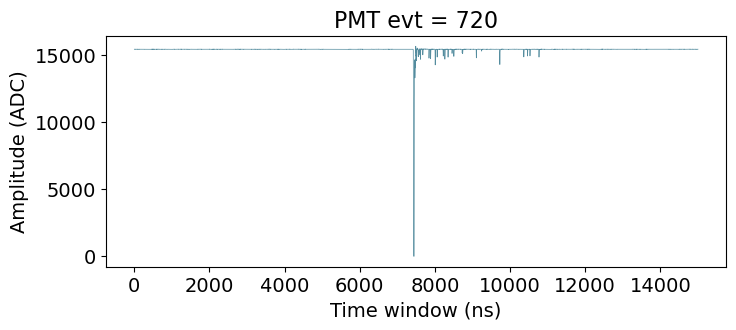

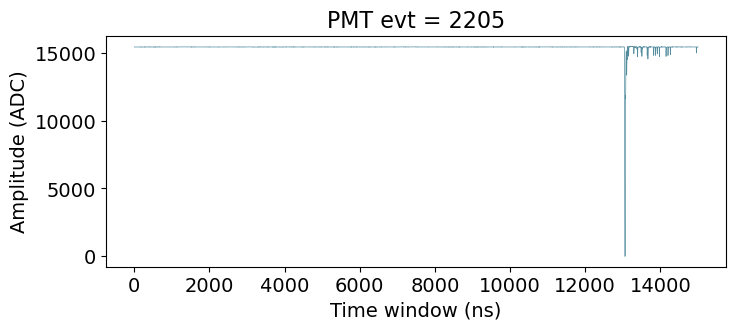

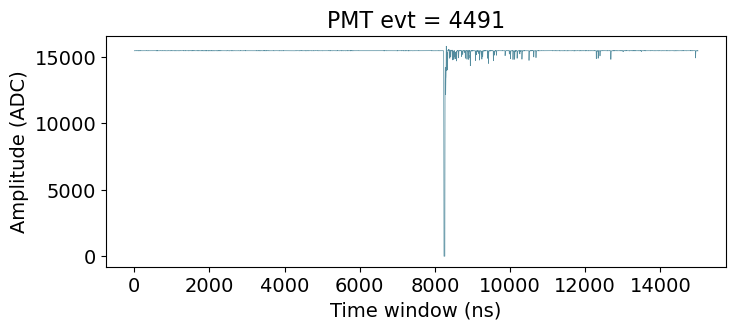

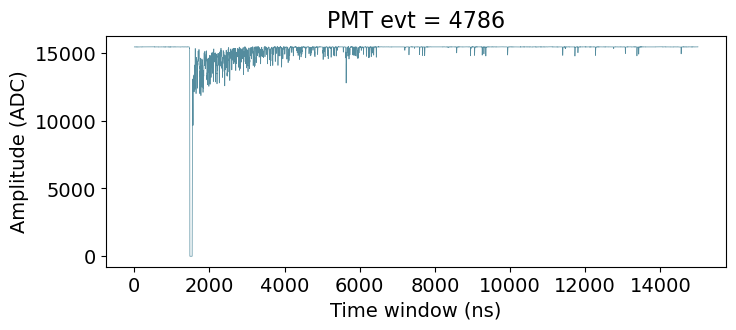

In [273]:
for evt in [0] + plot_evts:

    fig = plt.figure(figsize=(8, 3))
    wf = np.array(RawTree[f'chan12/rdigi'].array())[evt]
    plt.plot(2*np.arange(len(wf)), wf, linewidth=0.5, color=fav_col, alpha=0.9)
    plt.xlabel('Time window (ns)', fontsize=14)
    plt.ylabel('Amplitude (ADC)',  fontsize=14)
    plt.title(f"PMT evt = {evt}", fontsize=16)
    plt.show()

## Shape of single pes for one channel

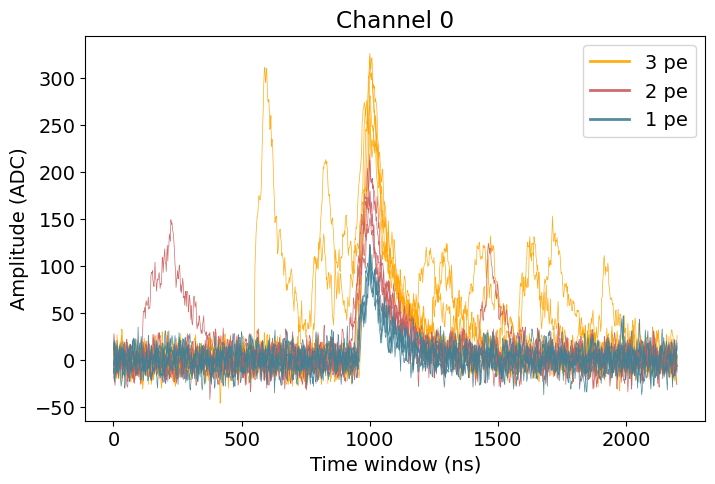

In [18]:
ch   = 0
wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
swfs = pf.subtract_baseline(wfs, mode=True, wf_range_bsl=(0, 500))
max_swfs = np.max(swfs, axis=1)

sel_swfs0 = (max_swfs >  80) & (max_swfs < 150)
sel_swfs1 = (max_swfs > 150) & (max_swfs < 240)
sel_swfs2 = (max_swfs > 240) & (max_swfs < 500)

swfs0 = swfs[sel_swfs0]
swfs1 = swfs[sel_swfs1]
swfs2 = swfs[sel_swfs2]

fig, ax0 = plt.subplots(1, 1, figsize=(8,5))
for i, wf in enumerate(swfs2[[1, 3, 4, 5, 6, 7]]):
    if i==0:
        lab = '3 pe'
    else:
        lab = ''
    ax0.plot(2*np.arange(len(wf[np.argmax(wf)-500:np.argmax(wf)+600])), wf[np.argmax(wf)-500:np.argmax(wf)+600], linewidth=0.5, color='orange', alpha=0.9, label=lab)
for i, wf in enumerate(swfs1[:5]):
    if i==0:
        lab = '2 pe'
    else:
        lab = ''
    ax0.plot(2*np.arange(len(wf[np.argmax(wf)-500:np.argmax(wf)+600])), wf[np.argmax(wf)-500:np.argmax(wf)+600], linewidth=0.5, color='indianred', alpha=0.9, label=lab)
for i, wf in enumerate(swfs0[:5]):
    if i==0:
        lab = '1 pe'
    else:
        lab = ''
    ax0.plot(2*np.arange(len(wf[np.argmax(wf)-500:np.argmax(wf)+600])), wf[np.argmax(wf)-500:np.argmax(wf)+600], linewidth=0.5, color=fav_col, alpha=0.9, label=lab)
ax0.set_title(f'Channel {ch}')
ax0.set_xlabel('Time window (ns)', fontsize=14)
ax0.set_ylabel('Amplitude (ADC)',  fontsize=14)
leg = ax0.legend()
for line in leg.get_lines():
    line.set_linewidth(2)

#plt.savefig('/Users/romoluque_c/Repositories/BACON_romo/analysis_documentation_run3/images/single_pe_shape.pdf', bbox_inches='tight')
plt.show()

In [352]:
ch   = 6
wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
swfs = pf.subtract_baseline(wfs, mode=True, wf_range_bsl=(0, 500))
max_swfs = np.max(swfs, axis=1)

## sel_swfs0 = (max_swfs >  80) & (max_swfs < 150)
## sel_swfs1 = (max_swfs > 150) & (max_swfs < 240)
## sel_swfs2 = (max_swfs > 240) & (max_swfs < 500)
## 
## swfs0 = swfs[sel_swfs0]
## swfs1 = swfs[sel_swfs1]
## swfs2 = swfs[sel_swfs2]
## 
## fig, ax0 = plt.subplots(1, 1, figsize=(8,4))
## for wf in swfs2[[1, 3, 4, 5, 6, 7]]:
##     ax0.plot(2*np.arange(len(wf[np.argmax(wf)-500:np.argmax(wf)+600])), wf[np.argmax(wf)-500:np.argmax(wf)+600], linewidth=0.5, color='orange', alpha=0.9, label=f'ch = {ch}')
## for wf in swfs1[:5]:
##     ax0.plot(2*np.arange(len(wf[np.argmax(wf)-500:np.argmax(wf)+600])), wf[np.argmax(wf)-500:np.argmax(wf)+600], linewidth=0.5, color='indianred', alpha=0.9, label=f'ch = {ch}')
## for wf in swfs0[:5]:
##     ax0.plot(2*np.arange(len(wf[np.argmax(wf)-500:np.argmax(wf)+600])), wf[np.argmax(wf)-500:np.argmax(wf)+600], linewidth=0.5, color=fav_col, alpha=0.9, label=f'ch = {ch}')
## ax0.set_title(f'Channel = {ch}')
## ax0.set_xlabel('Time window (ns)', fontsize=14)
## ax0.set_ylabel('Amplitude (ADC)',  fontsize=14)
## #ax0.set_xlim(2* np.argmax(wf) - 1500, 2* np.argmax(wf) + 1500)
## plt.show()

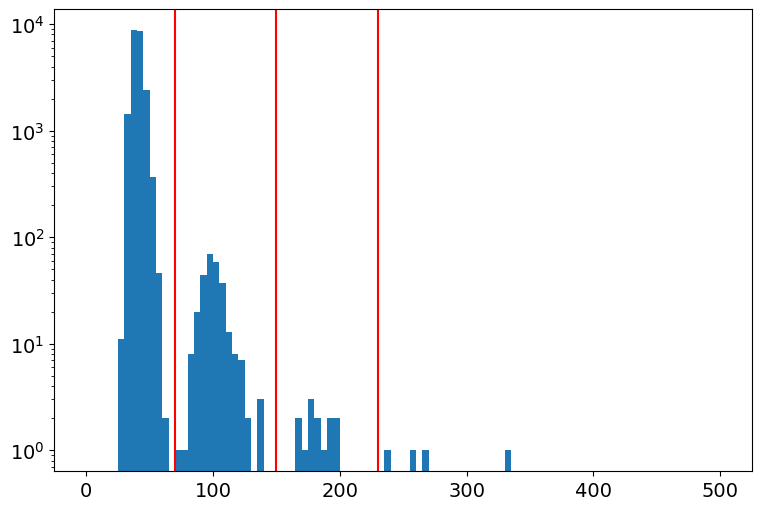

In [353]:
plt.hist(max_swfs, bins=100, range=(0, 500), log=True)
plt.axvline( 70, color='r')
plt.axvline(150, color='r')
plt.axvline(230, color='r');

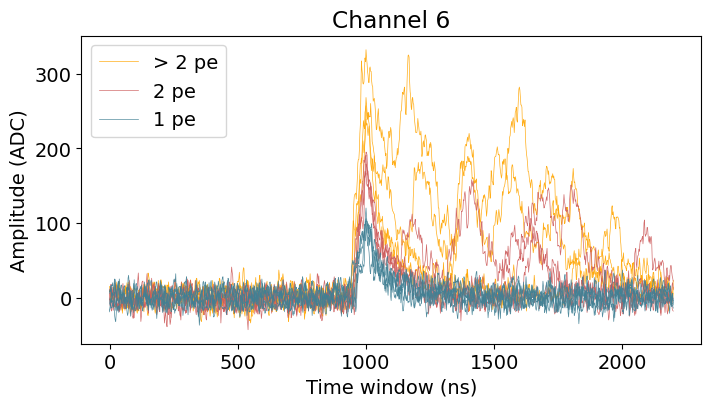

In [358]:
ch   = 6
wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
swfs = pf.subtract_baseline(wfs, mode=True, wf_range_bsl=(0, 500))
max_swfs = np.max(swfs, axis=1)

sel_swfs0 = (max_swfs >  70) & (max_swfs < 150)
sel_swfs1 = (max_swfs > 150) & (max_swfs < 230)
sel_swfs2 = (max_swfs > 230) & (max_swfs < 500)

swfs0 = swfs[sel_swfs0]
swfs1 = swfs[sel_swfs1]
swfs2 = swfs[sel_swfs2]

fig, ax0 = plt.subplots(1, 1, figsize=(8,4))
for i,wf in enumerate(swfs2):
    if i==0:
        label='> 2 pe'
    else:
        label=''
    ax0.plot(2*np.arange(len(wf[np.argmax(wf)-500:np.argmax(wf)+600])), wf[np.argmax(wf)-500:np.argmax(wf)+600], linewidth=0.5, color='orange', alpha=0.9, label=label)
for i,wf in enumerate(swfs1[:5]):
    if i==0:
        label='2 pe'
    else:
        label=''
    ax0.plot(2*np.arange(len(wf[np.argmax(wf)-500:np.argmax(wf)+600])), wf[np.argmax(wf)-500:np.argmax(wf)+600], linewidth=0.5, color='indianred', alpha=0.9, label=label)
for i,wf in enumerate(swfs0[:5]):
    if i==0:
        label='1 pe'
    else:
        label=''
    ax0.plot(2*np.arange(len(wf[np.argmax(wf)-500:np.argmax(wf)+600])), wf[np.argmax(wf)-500:np.argmax(wf)+600], linewidth=0.5, color=fav_col, alpha=0.9, label=label)
ax0.set_title(f'Channel {ch}')
ax0.set_xlabel('Time window (ns)', fontsize=14)
ax0.set_ylabel('Amplitude (ADC)',  fontsize=14)
ax0.legend(loc=2)
plt.show()

In [361]:
ch   = 6
wfs  = np.array(RawTree[f'chan{ch}/rdigi'].array())
swfs = pf.subtract_baseline(wfs, mode=True, wf_range_bsl=(0, 500))
max_swfs = np.max(swfs, axis=1)

sel_events = np.where((max_swfs > 230) & (max_swfs < 600))[0]

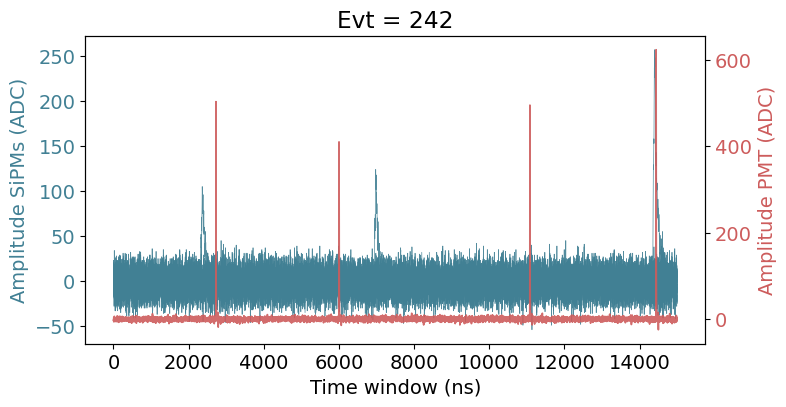

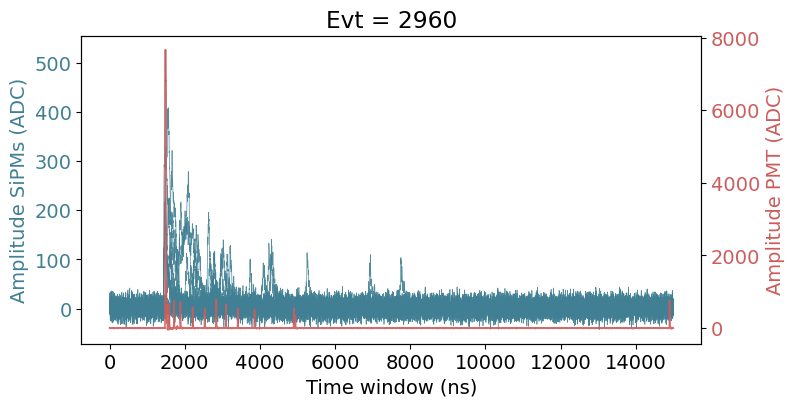

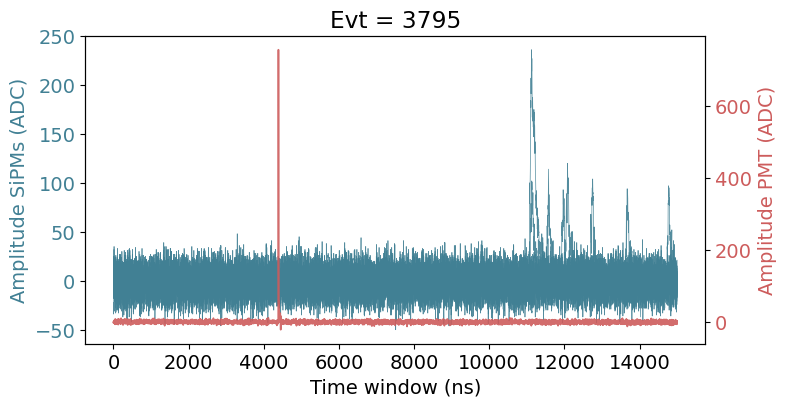

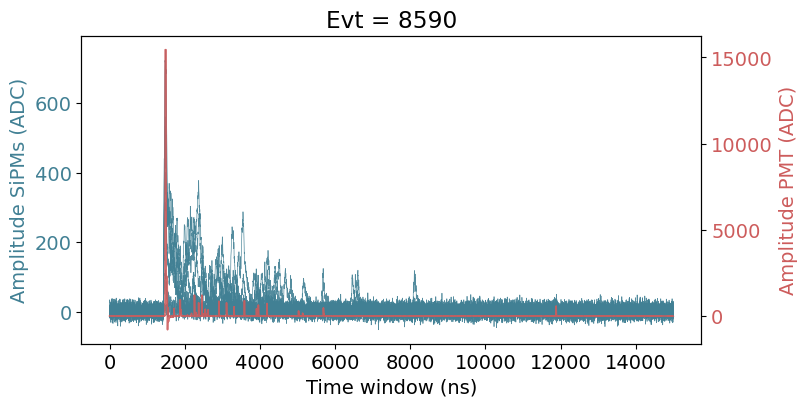

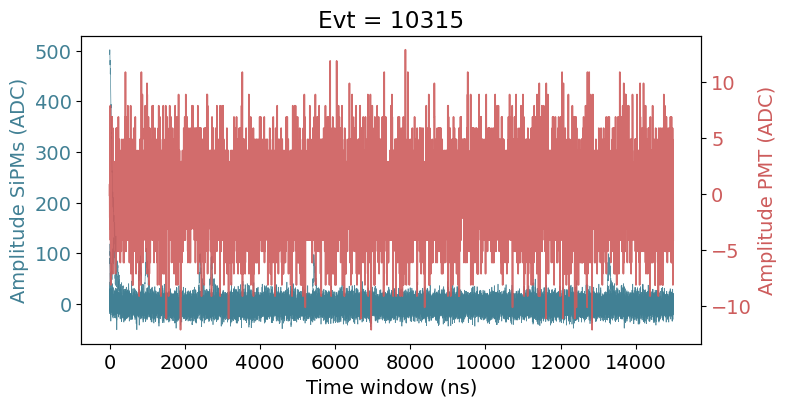

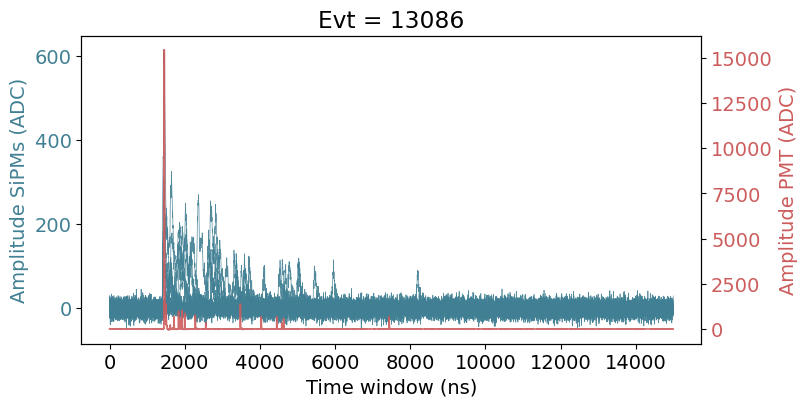

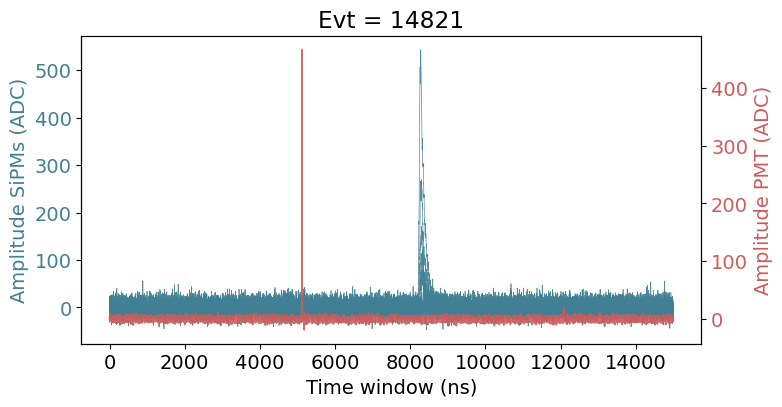

In [363]:
for evt in sel_events:
    
    fig, ax0 = plt.subplots(1, 1, figsize=(8,4))
    ax1 = ax0.twinx()
    for ch in range(9):
        wf  = np.array(RawTree[f'chan{ch}/rdigi'].array())[evt]
        swf = pf.subtract_baseline(wf, mode=True, wf_range_bsl=(0, 500))
        ax0.plot(2*np.arange(len(swf)), swf, linewidth=0.5, color=fav_col, alpha=0.9, label=f'ch = {ch}')
        
    wf  = np.array(RawTree[f'chan12/rdigi'].array())[evt]
    swf = blr.pmt_deconvolver(wf, wf_range_bsl=(0, 500))
    ax1.plot(2*np.arange(len(swf)), swf, linewidth=1.2, color='indianred', alpha=0.9, label='PMT')

    ax0.set_title(f'Evt = {evt}')
    ax0.set_xlabel('Time window (ns)',      fontsize=14)
    ax0.set_ylabel('Amplitude SiPMs (ADC)', fontsize=14, color='#418094')
    ax1.set_ylabel('Amplitude PMT (ADC)',   fontsize=14, color="indianred")
    
    ax0.tick_params(axis='y', labelcolor='#418094')
    ax1.tick_params(axis='y', labelcolor="indianred")
    plt.show()

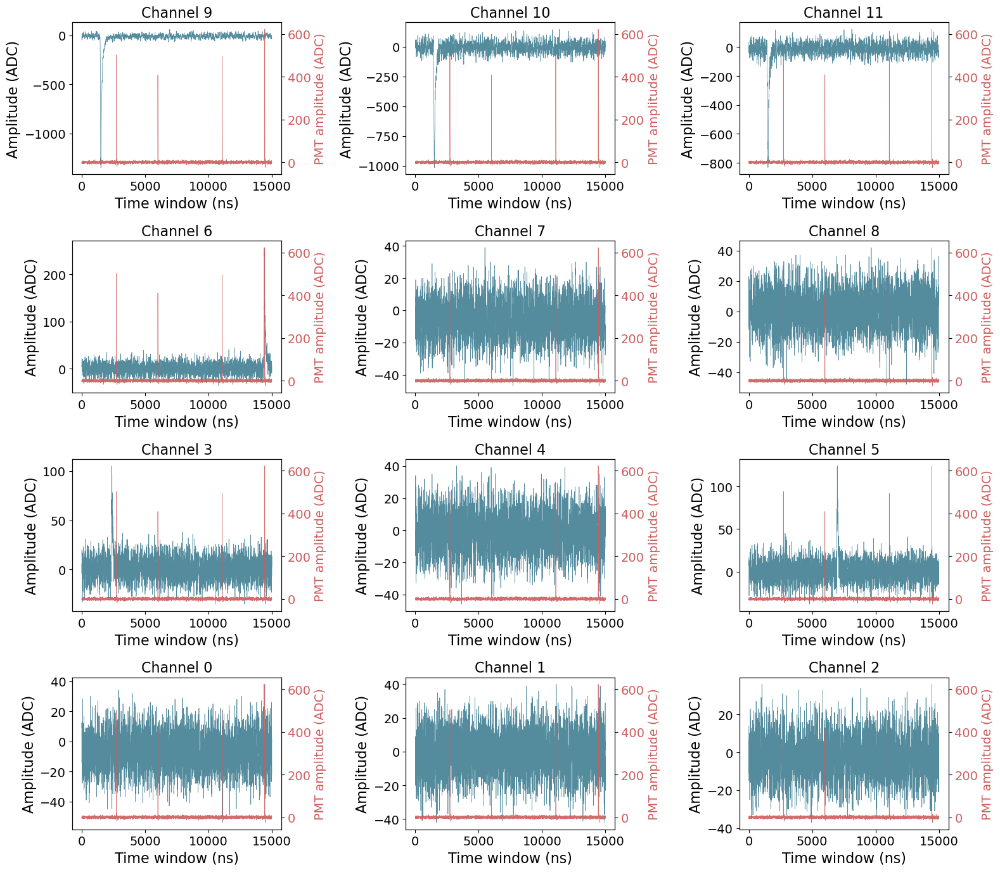

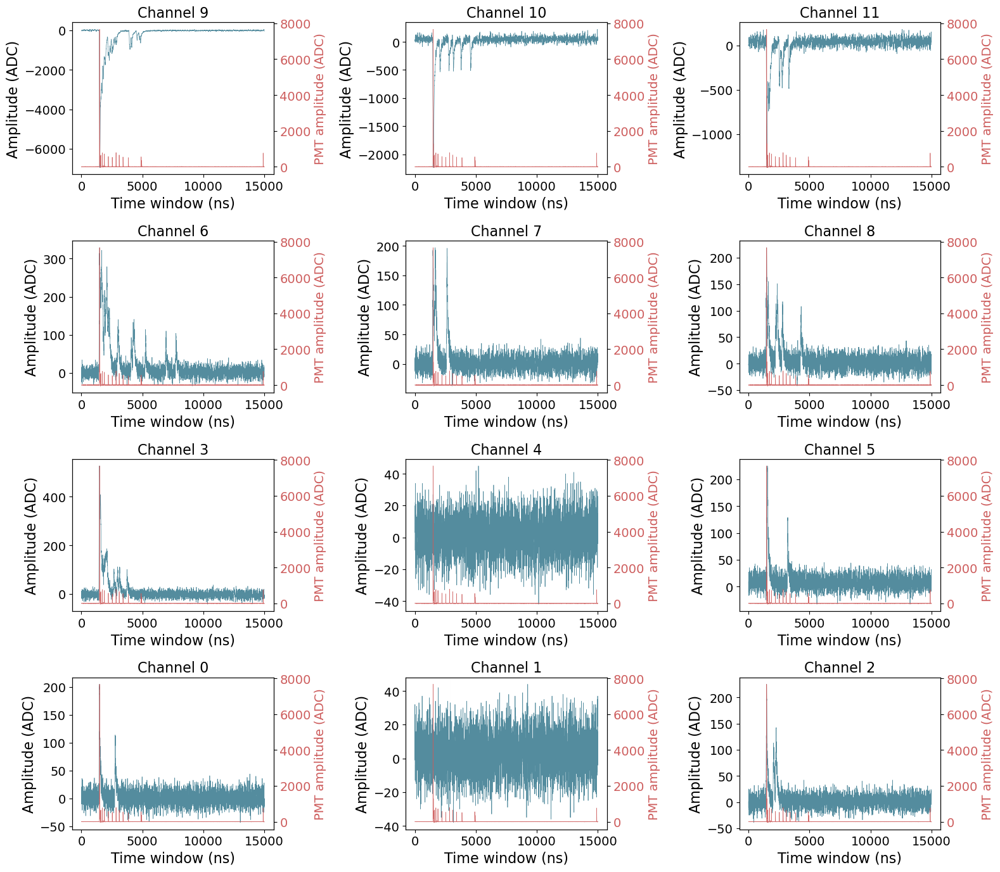

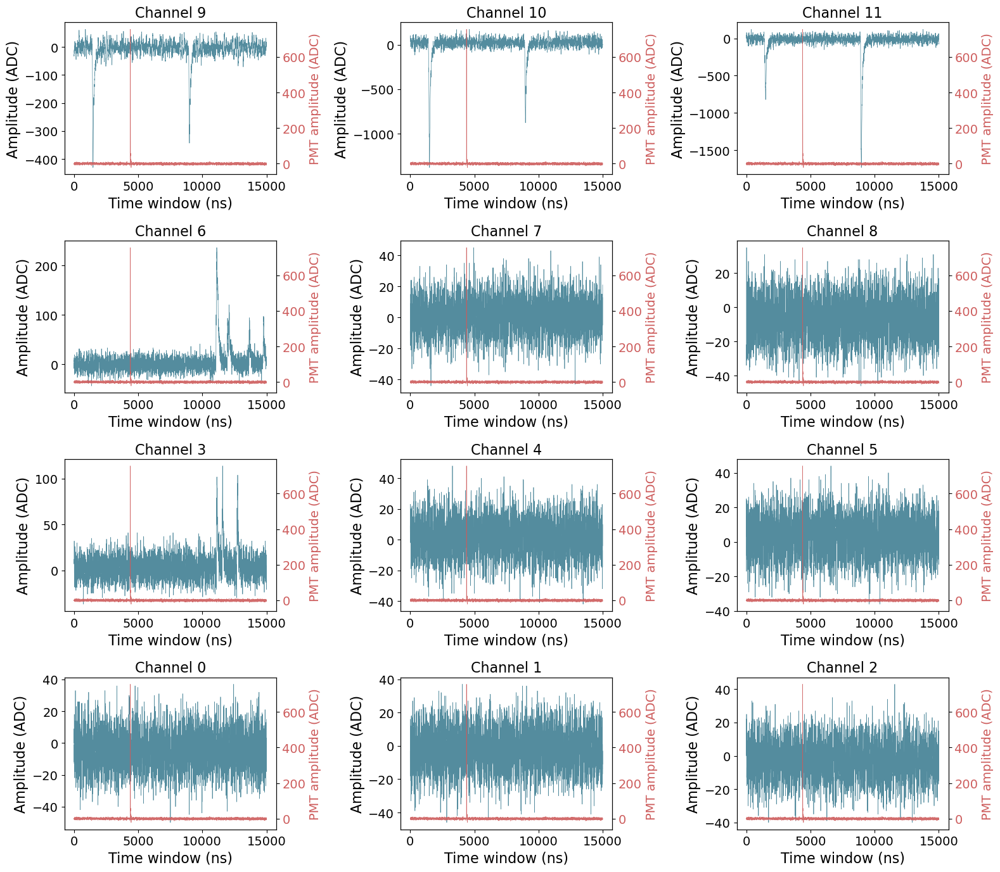

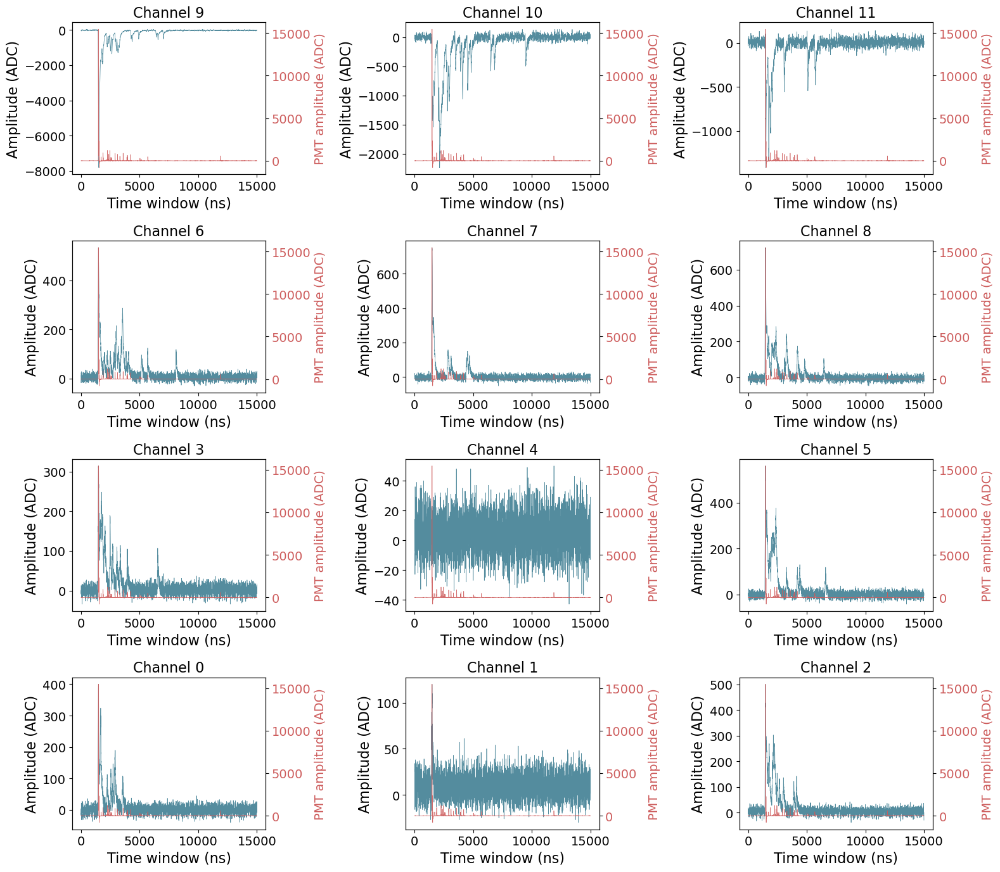

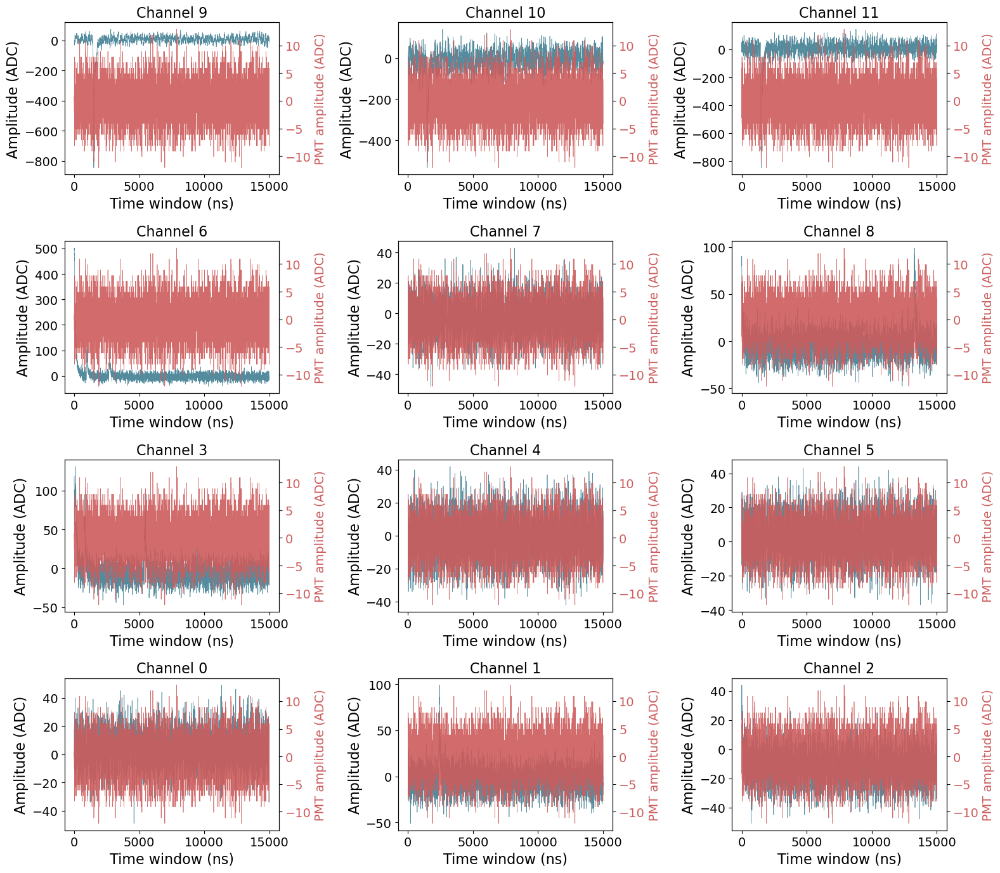

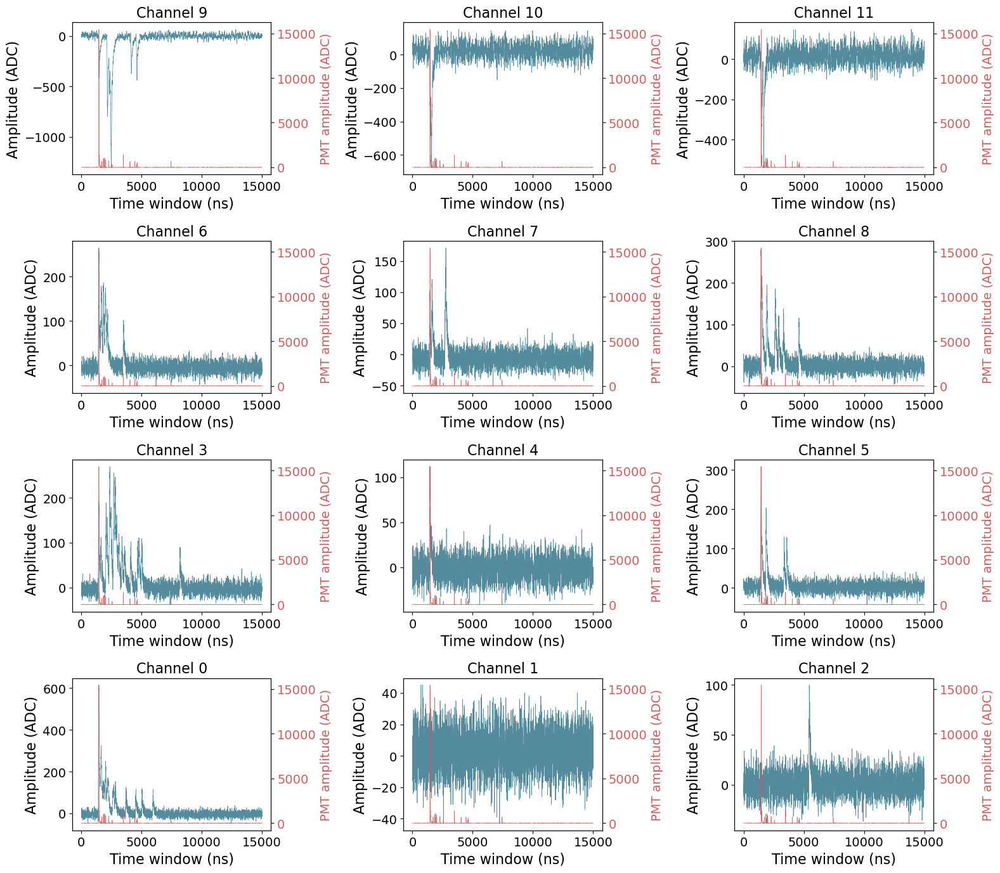

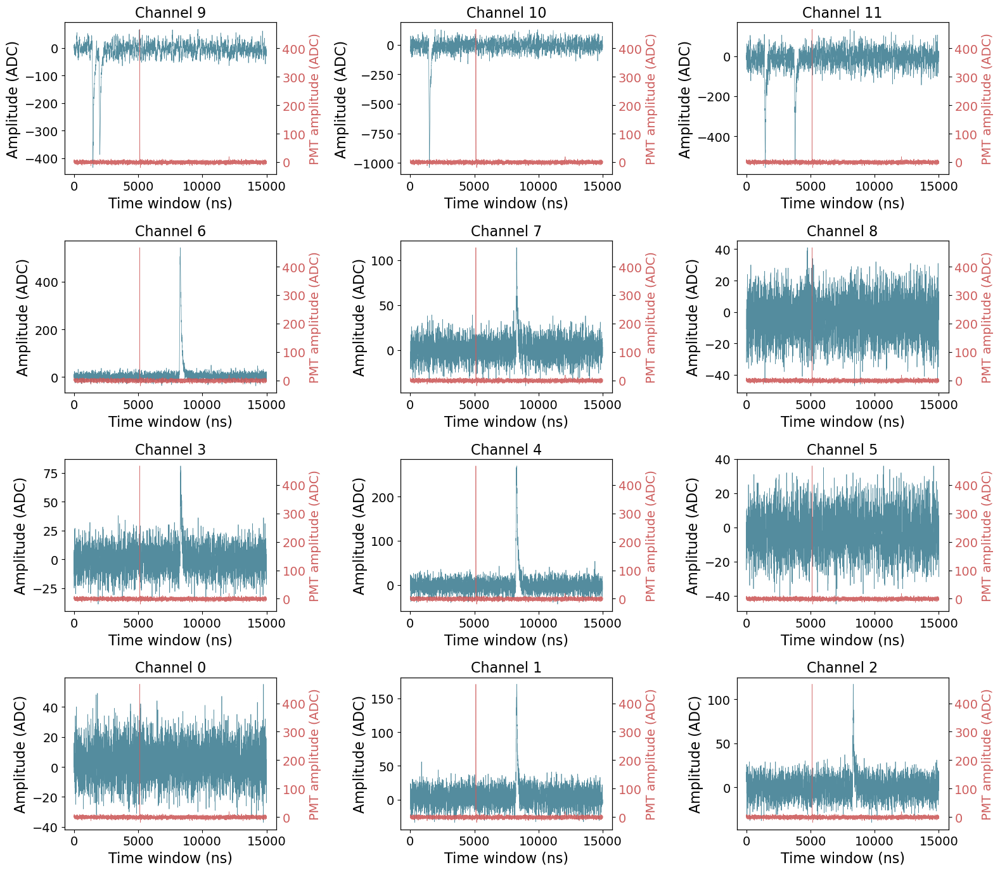

In [369]:
for evt in sel_events:
    pmt_wf  = np.array(RawTree[f'chan12/rdigi'].array())[evt]
    pmt_swf = blr.pmt_deconvolver(pmt_wf, wf_range_bsl=(0, 500))
    fig, axs = plt.subplots(4, 3, figsize=(16, 14))
    for row, ich in enumerate(reversed(np.arange(0, 12, 3))):
        for col in range(3):
            ch  = ich + col
            wf  = np.array(RawTree[f'chan{ch}/rdigi'].array())[evt]
            swf = pf.subtract_baseline(wf, mode=True, wf_range_bsl=(0, 500))
            axs[row][col].plot(2*np.arange(len(swf)), swf, linewidth=0.5, color=fav_col, alpha=0.9)
            axs[row][col].set_xlabel('Time window (ns)', fontsize=16)
            axs[row][col].set_ylabel('Amplitude (ADC)',  fontsize=16)
            axs[row][col].set_title(f"Channel {ch}",     fontsize=16)
            
            ax0 = axs[row][col].twinx()
            ax0.plot(2*np.arange(len(pmt_swf)), pmt_swf, linewidth=0.5, color='indianred', alpha=0.9)
            ax0.set_xlabel('Time window (ns)', fontsize=14)
            ax0.set_ylabel('PMT amplitude (ADC)',  fontsize=14, color='indianred')
            ax0.tick_params(axis='y', labelcolor="indianred")
    
    plt.tight_layout()
    plt.show()